Warning: before executing a data analysis subsection, always execute all the "data preparation" and "preparation for modelling" subsections (those with a ⚒️) that are before the subsection.

Warning: executing twice the df.set_index()/df.reset_index() blocks will cause an error (that can be ignored, it just informs us that the operation has already been made)

## Libraries and data loading 📚

In [204]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import aquarel
import scipy.stats as st
import wordcloud as wc
import bar_chart_race as bcr
import scipy.stats as st
import pyalex as alex
from ineqpy.inequality import gini
from IPython.display import clear_output
alex.config.email = "gabriel.vignon@ensta.fr"
sns.set_palette("viridis")
# plt.rcParams.update({
#     "font.family": "serif",
#     "text.usetex": False,  # Latex
#     "font.serif": ["Computer Modern Roman"],  # ou "Times New Roman"
# })

In [205]:
works = pd.read_csv("data/works/works_abstracts.csv")
works = works[works["year"] != 2025]

C:\Users\gabri\AppData\Local\Temp\ipykernel_30176\3352970314.py:1: DtypeWarning: Columns (92,93,94,95,96,97,98,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,204,205,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,344,345,346,347,348,349,350,351,3

In [206]:
works

,title,year,cited_by_count,countries_distinct_count,institutions_distinct_count,citation_normalized_percentile,primary_topic,keywords,concepts,referenced_works_count,...,institution_117,institution_118,institution_119,institution_120,institution_121,institution_122,institution_123,institution_124,institution_125,institution_126
0,Animal research: Reporting <i>in vivo</i> expe...,2010,3423,1,4,"{'value': 0.99971, 'is_in_top_1_percent': True...","('Animal testing and alternatives',)",[{'id': 'https://openalex.org/keywords/watson'...,"[{'id': 'https://openalex.org/C161191863', 'wi...",6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Principles of early drug discovery,2010,2434,1,2,"{'value': 0.756098, 'is_in_top_1_percent': Fal...","('Computational Drug Discovery Methods',)",[{'id': 'https://openalex.org/keywords/identif...,"[{'id': 'https://openalex.org/C74187038', 'wik...",25,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Measuring reactive species and oxidative damag...,2004,2194,1,1,"{'value': 0.990741, 'is_in_top_1_percent': Tru...","('Antioxidant Activity and Oxidative Stress',)",[],"[{'id': 'https://openalex.org/C207001950', 'wi...",386,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"Guide to Receptors and Channels (GRAC), 5th ed...",2011,2071,1,3,"{'value': 0.999918, 'is_in_top_1_percent': Tru...","('Inflammatory mediators and NSAID effects',)",[],"[{'id': 'https://openalex.org/C170493617', 'wi...",2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Characterization of three inhibitors of endoth...,1990,1874,1,1,"{'value': 0.999876, 'is_in_top_1_percent': Tru...","('Nitric Oxide and Endothelin Effects',)",[{'id': 'https://openalex.org/keywords/omega-n...,"[{'id': 'https://openalex.org/C2908937200', 'w...",37,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26312,NaN,1986,0,0,0,NaN,NaN,[],"[{'id': 'https://openalex.org/C41008148', 'wik...",0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
26313,Transdermal Iontophoresis - Role of the Stratu...,1994,0,0,0,"{'value': 0.0, 'is_in_top_1_percent': False, '...","('Chemotherapy-related skin toxicity',)",[{'id': 'https://openalex.org/keywords/iontoph...,"[{'id': 'https://openalex.org/C183529106', 'wi...",0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
26314,ORAL COMMUNICATIONS,1991,0,0,0,"{'value': 0.0, 'is_in_top_1_percent': False, '...","('Attention Deficit Hyperactivity Disorder',)",[],"[{'id': 'https://openalex.org/C71924100', 'wik...",266,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
26315,Interleukin 1 and lipopolysaccharide effects o...,1989,0,0,0,"{'value': 0.0, 'is_in_top_1_percent': False, '...","('Inflammatory mediators and NSAID effects',)",[{'id': 'https://openalex.org/keywords/interle...,"[{'id': 'https://openalex.org/C2777956040', 'w...",0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## General data preparation ⚒️

### General variables

In [207]:
year_begin = 1980
year_end = 2024

### Citation rate

In [208]:
works["age"] = 2025 - works["year"]
works["mean_citations_per_year"] = works["cited_by_count"] / works["age"]

### MNCS

In [209]:
cbc_per_year = (
    works[["year", "cited_by_count"]]
    .groupby(by = "year")
    .mean()
)

for index, row in works.iterrows():
    works.loc[index, "mncs"] = works.loc[index, "cited_by_count"]/cbc_per_year.loc[works.loc[index, "year"], "cited_by_count"]


### Number of authors

In [210]:
for index, article in works.iterrows():
    works.loc[index, "authors_count"] = 0
    if pd.isna(article["author_1"]):
        continue
    i = 1
    while pd.notna(article.get(f"author_{i}")):
        i += 1
    works.loc[index, "authors_count"] = i - 1

### Meta-analysis and reviews

In [211]:
for index, row in works.iterrows():
    if pd.notna(row["title"]):
        if pd.notna(row["abstract"]):
            if "meta‑analysis" in (works.loc[index, "abstract"]).lower() or "meta analysis" in works.loc[index, "abstract"].lower() or \
            "meta‑analysis" in (works.loc[index, "title"]).lower() or "meta analysis" in works.loc[index, "title"].lower():
                works.loc[index, "meta-analysis"] = True
            else:
                works.loc[index, "meta-analysis"] = False
            if "review" in works.loc[index, "title"].lower() or "review" in works.loc[index, "abstract"].lower():
                works.loc[index, "review"] = True
            else:
                works.loc[index, "review"] = False
        else:
            if "meta‑analysis" in (works.loc[index, "title"]).lower() or "meta analysis" in works.loc[index, "title"].lower():
                works.loc[index, "meta-analysis"] = True
            else:
                works.loc[index, "meta-analysis"] = False
            if "review" in works.loc[index, "title"].lower():
                works.loc[index, "review"] = True
            else:
                works.loc[index, "review"] = False

In [212]:
works["review"].sum()

1307

In [213]:
works["meta-analysis"].sum()

0

## Distributions of the variables 📈

### Data preparation ⚒️

#### Groups (group_[columns]_[operation])

In [214]:
group_year_mean = (works.groupby(by = "year")[["cited_by_count", "countries_distinct_count", "institutions_distinct_count", "referenced_works_count", "authors_count", "mean_citations_per_year", "mncs"]]).mean()
group_year_mean.sort_values(by = "year", inplace=True, ascending=False)
#group_year_mean.drop(index = 2025, inplace=True) 
group_year_mean.head()

,cited_by_count,countries_distinct_count,institutions_distinct_count,referenced_works_count,authors_count,mean_citations_per_year,mncs
year,,,,,,,
2024,2.495627,1.513120,3.428571,63.061224,8.037901,2.495627,1.0
2023,10.479233,1.418530,3.402556,64.543131,7.178914,5.239617,1.0
2022,14.079245,1.528302,3.075472,51.694340,7.988679,4.693082,1.0
2021,23.097403,1.387446,3.337662,68.132035,7.004329,5.774351,1.0
2020,31.462441,1.417840,3.018779,65.511737,6.502347,6.292488,1.0


In [215]:
group_references_mean = (
    works[["cited_by_count", "referenced_works_count", "mean_citations_per_year", "mncs"]]
    .groupby(by = "referenced_works_count")
    .mean()
)
group_references_mean.head()

,cited_by_count,mean_citations_per_year,mncs
referenced_works_count,,,
0,1.247182,0.082371,0.028464
1,13.539130,1.703806,0.413224
2,37.900000,3.277078,0.720401
3,21.436364,1.387190,0.494960
4,20.788889,1.797043,0.567661


#### Gini coefficients per year

In [216]:
ginis = []
for i in range(year_begin, year_end + 1):
    works_year = works[works["year"] == i]
    ginis.append(gini(works_year["cited_by_count"].values))

### Data analysis 📊

#### N works | Years

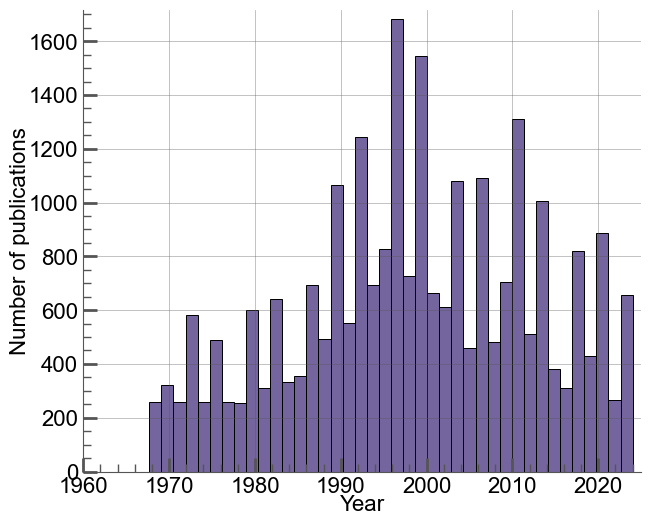

In [217]:
with aquarel.load_theme("scientific"):
    sns.set_palette("viridis")
    plt.figure(figsize=(7.2, 6))
    sns.histplot(data = works, x = "year")
    plt.xlim(1960, 2025)
    plt.xlabel("Year", fontsize = 16)
    plt.xticks(fontsize=16)
    plt.ylabel("Number of publications", fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()


#### N citations | Years

<Figure size 640x480 with 0 Axes>

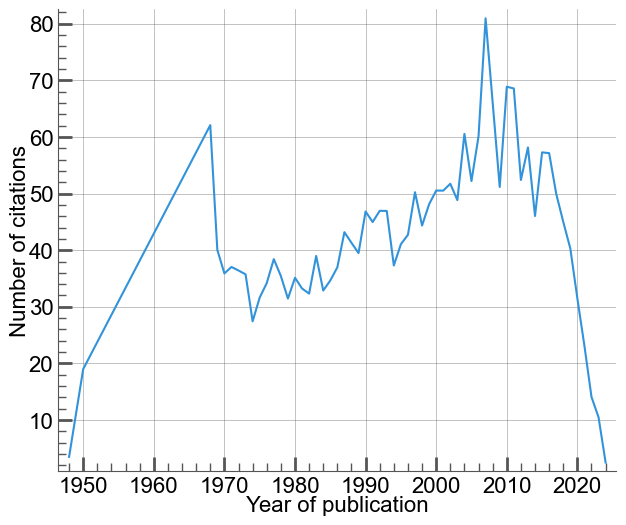

Mean citations count: 42.103730949167776
Median citations count: 41.30753564154786


In [218]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.lineplot(data = group_year_mean, x = "year", y = "cited_by_count", color = "#3293da")
    plt.xlabel("Year of publication", fontsize=16),
    plt.ylabel("Number of citations", fontsize=16),
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()

mean_value = group_year_mean["cited_by_count"].mean()
median_value = group_year_mean["cited_by_count"].median()
print(f"Mean citations count: {mean_value}")
print(f"Median citations count: {median_value}")

##### Citation rate

<Figure size 640x480 with 0 Axes>

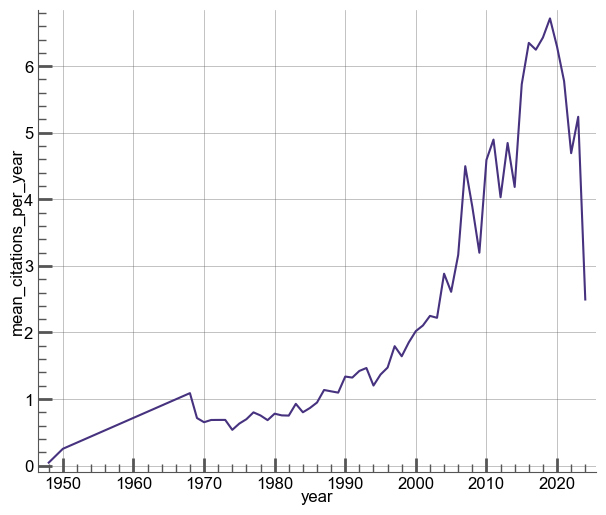

In [ ]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.lineplot(data = group_year_mean, x = "year", y = "mean_citations_per_year", color = sns.color_palette("viridis")[0])
    plt.show()


##### MNCS

<Figure size 640x480 with 0 Axes>

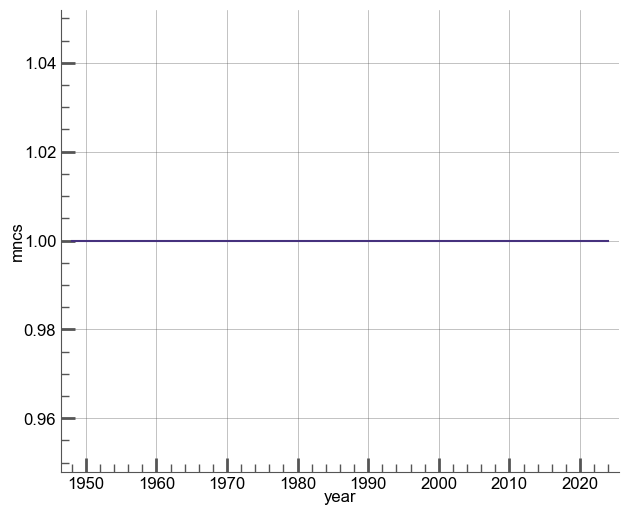

In [ ]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.lineplot(data = group_year_mean, x = "year", y = "mncs", color = sns.color_palette("viridis")[0])
    plt.show()


#### N countries | years

<Figure size 640x480 with 0 Axes>

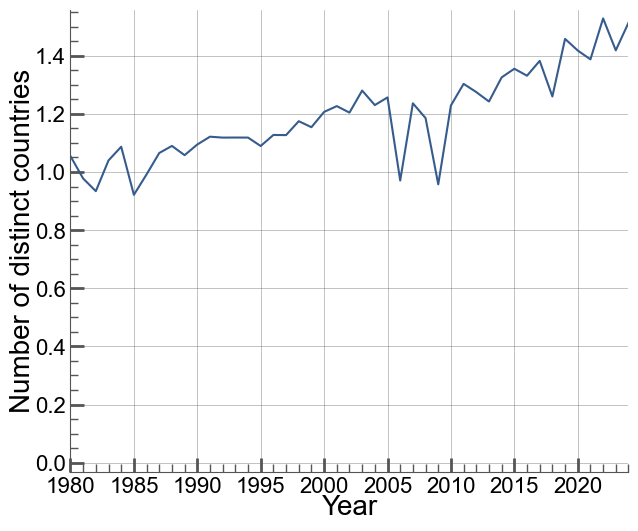

In [219]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.lineplot(data = group_year_mean, x = "year", y = "countries_distinct_count", color = sns.color_palette("viridis")[1])
    plt.xlim(1980, 2024)
    plt.xlabel("Year", fontsize=20)
    plt.ylabel("Number of distinct countries", fontsize=20)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()

#### N institutions | years

<Figure size 640x480 with 0 Axes>

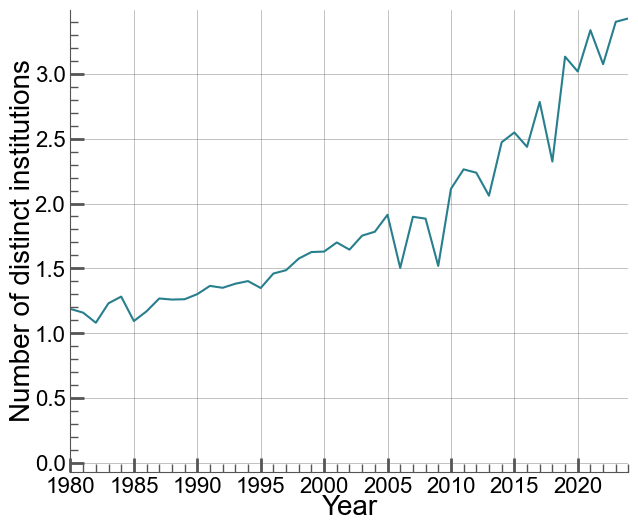

In [ ]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.lineplot(data = group_year_mean, x = "year", y = "institutions_distinct_count", color = sns.color_palette("viridis")[2])
    plt.xlim(1980, 2024)
    plt.xlabel("Year", fontsize=20)
    plt.ylabel("Number of distinct institutions", fontsize=20)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()

#### N references | Years

<Figure size 640x480 with 0 Axes>

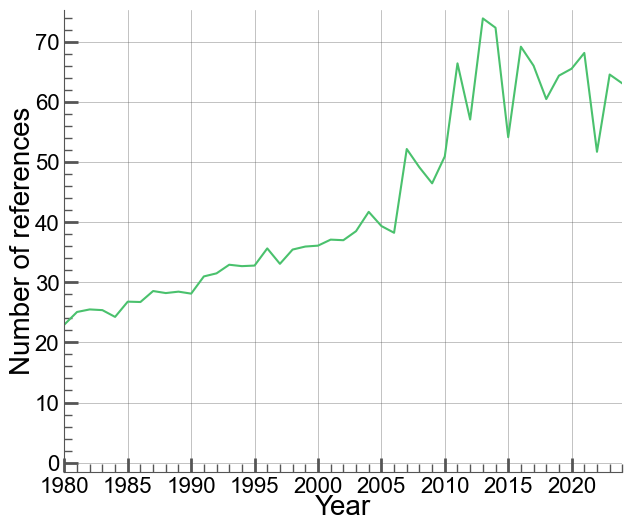

In [ ]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.lineplot(data = group_year_mean, x = "year", y = "referenced_works_count", color = sns.color_palette("viridis")[4])
    plt.xlim(1980, 2024)
    plt.xlabel("Year", fontsize=20)
    plt.ylabel("Number of references", fontsize=20)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()


In [ ]:
works[["cited_by_count", "referenced_works_count"]].groupby(by = "referenced_works_count").count()

,cited_by_count
referenced_works_count,
0,2573
1,115
2,70
3,55
4,90
...,...
740,1
773,1
890,1


#### N works | N citations

In [ ]:
unknown_studies = works[works["cited_by_count"] == 0]
unknown_studies.shape[0]/works.shape[0]

0.09905804870577424

<Figure size 640x480 with 0 Axes>

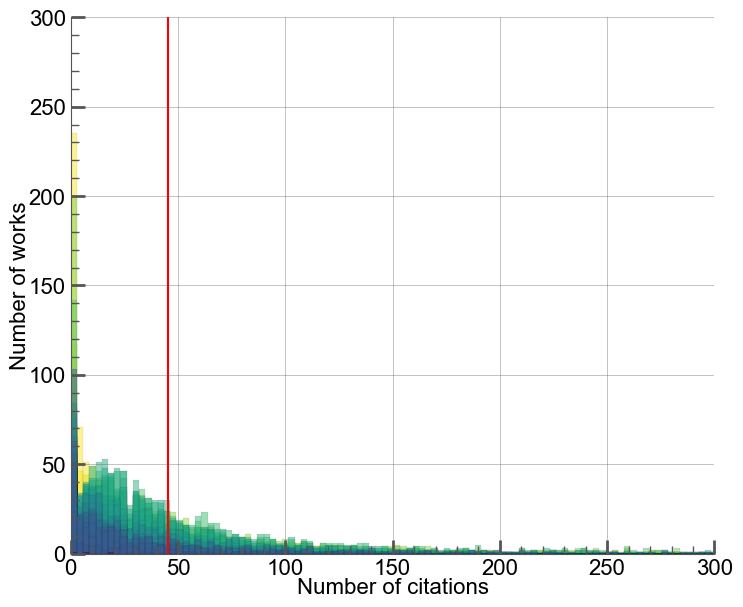

In [ ]:
with aquarel.load_theme("scientific"):
    sns.displot(data = works, x = "cited_by_count", hue = "year", palette = "viridis", legend = False, height = 6, aspect = 1.2)
    plt.xlim(0, 300)
    plt.ylim(0, 300)
    plt.axvline(x = works["cited_by_count"].mean(), color = "red")
    plt.xlabel("Number of citations", fontsize=16)
    plt.ylabel("Number of works", fontsize=16)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()

##### Citation rate

<Figure size 640x480 with 0 Axes>

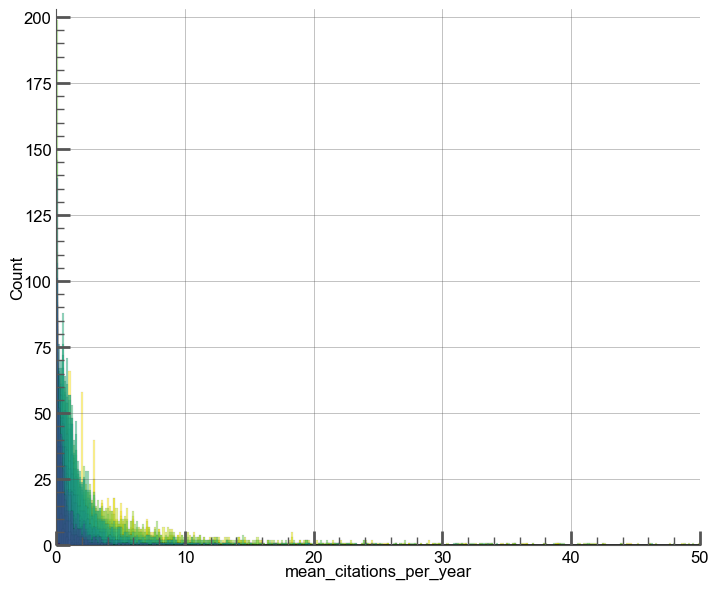

In [23]:
with aquarel.load_theme("scientific"):
    sns.displot(data = works, x = "mean_citations_per_year", hue = "year", palette = "viridis", legend = False, height = 6, aspect = 1.2)
    plt.xlim(0, 50)
    plt.show()

##### MNCS

In [24]:
with aquarel.load_theme("scientific"):
    sns.displot(data = works, x = "mncs", hue = "year", palette = "viridis", legend = False, height = 6, aspect = 1.2)
    plt.xlim(0, 50)
    plt.xlabel("MNCS")
    plt.show()

<Figure size 640x480 with 0 Axes>

KeyboardInterrupt: 

#### N works | N references

<Figure size 1000x600 with 0 Axes>

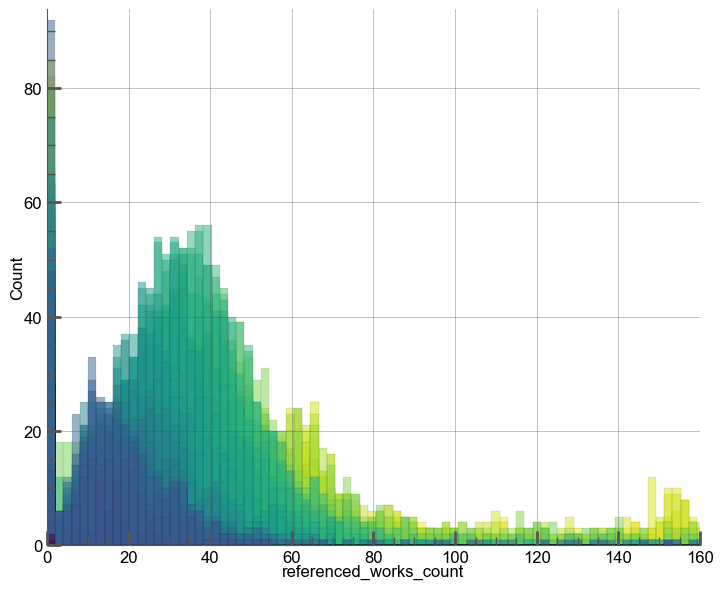

In [11]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(10, 6))
    sns.displot(data = works, x = "referenced_works_count",  hue = "year", legend = False, palette = "viridis", height = 6, aspect = 1.2)
    plt.xlim(0, 160)
    plt.show()

#### N citations | N references 

<Figure size 640x480 with 0 Axes>

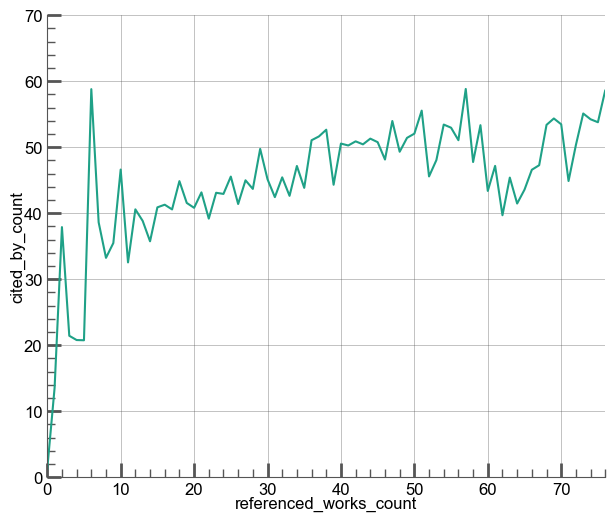

Mean authors count: 40.106524735794146
Median authors count: 33.0


In [220]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.lineplot(data = group_references_mean, x = "referenced_works_count", y = "cited_by_count", color = sns.color_palette("viridis")[3])
    plt.xlim(0, 76)
    plt.ylim(0, 70)
    plt.show()

mean_value = works["referenced_works_count"].mean()
print(f"Mean authors count: {mean_value}")
median_value = works["referenced_works_count"].median()
print(f"Median authors count: {median_value}")

##### Citation rate

<Figure size 640x480 with 0 Axes>

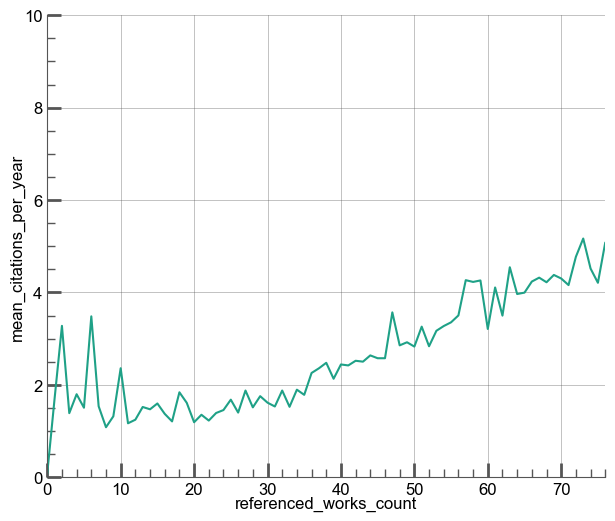

In [309]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.lineplot(data = group_references_mean, x = "referenced_works_count", y = "mean_citations_per_year", color = sns.color_palette("viridis")[3])
    plt.xlim(0, 76)
    plt.ylim(0,10)
    plt.show()

#### MNCS

<Figure size 640x480 with 0 Axes>

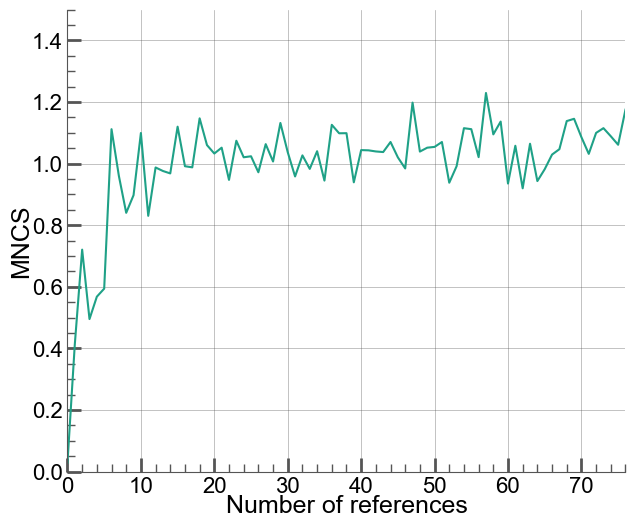

In [310]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.lineplot(data = group_references_mean, x = "referenced_works_count", y = "mncs", color = sns.color_palette("viridis")[3])
    plt.xlim(0, 76)
    plt.ylim(0,1.5)
    plt.xlabel("Number of references", fontsize=18)
    plt.ylabel("MNCS", fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()

#### Kolmogorov-Smirnov | Citations and Pareto

In [311]:
xmin = 0
works_pareto = works["cited_by_count"][works["cited_by_count"] > xmin] # train only with the data after xmin

In [312]:
b, loc, scale = st.pareto.fit(works_pareto, floc = 0) # floc = fixed loc 


In [313]:
pareto_fitted = st.pareto(b, loc, scale)
D, p = st.kstest(works_pareto, pareto_fitted.cdf)
print(p)

0.0


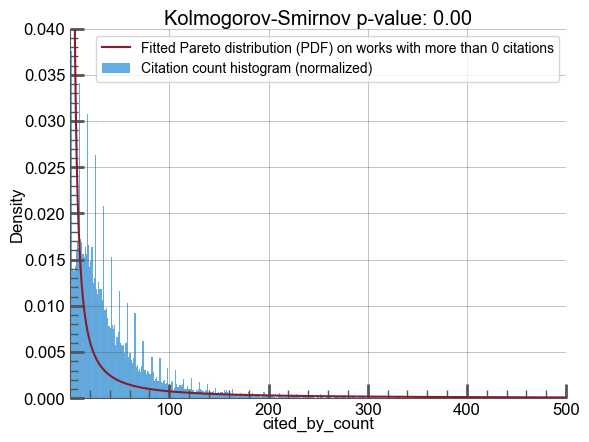

In [314]:
x = np.linspace(1, 1000, 10_000)
sns.lineplot(x = x, y = pareto_fitted.pdf(x), color = "#831e2f", label = f"Fitted Pareto distribution (PDF) on works with more than {xmin} citations")
sns.histplot(x = works_pareto, stat = "density", color = "#3293da", bins = 3000, label = "Citation count histogram (normalized)")
plt.xlim(0.05, 500)
plt.ylim(0, 0.04)
plt.title(f"Kolmogorov-Smirnov p-value: {p:.2f}")
plt.legend()
plt.show()

In [316]:
works.shape

(26116, 394)

#### Gini coefficient for citations share

In [34]:
gini(works["cited_by_count"].values) #.values convert a Series in array

np.float64(0.6026971168973548)

<Figure size 640x480 with 0 Axes>

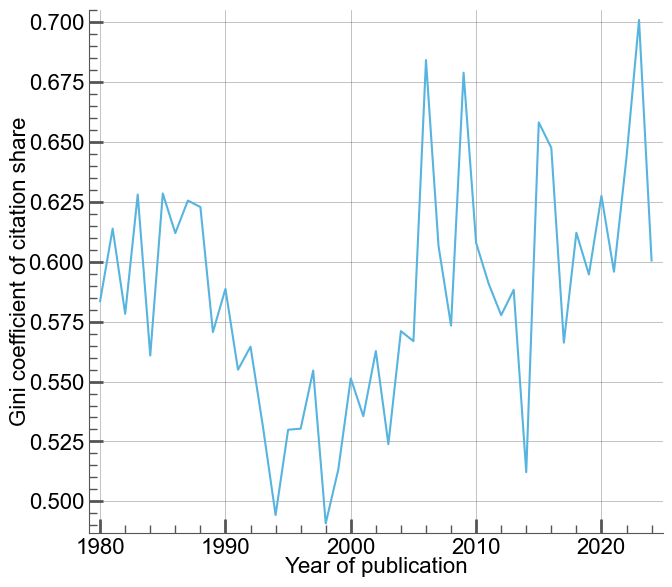

In [221]:

with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.4, 6.8))
    sns.lineplot(x = range(year_begin, year_end + 1), y = ginis)
    plt.xlabel("Year of publication", fontsize=16)
    plt.ylabel("Gini coefficient of citation share", fontsize=16)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()

#### Meta-analysis and Reviews

In [317]:
works["referenced_works_count"].mean()

np.float64(40.106524735794146)

In [318]:
works[works["review"] == True]["referenced_works_count"].mean()

np.float64(130.21428571428572)

## Authors 🧑‍🎓

### Data preparation ⚒️

#### Groups (group_[columns]_[operation])

In [222]:
group_Nauthors_mean = (
    works[["authors_count", "cited_by_count", "mean_citations_per_year", "mncs"]]
    .groupby(by = "authors_count")
    .mean()
)
group_Nauthors_mean

,cited_by_count,mean_citations_per_year,mncs
authors_count,,,
0.0,0.749641,0.065764,0.016372
1.0,50.151478,2.468873,1.074533
2.0,44.984244,1.903090,1.046438
3.0,47.370173,2.156278,1.052812
4.0,50.995393,2.550633,1.105149
5.0,51.608155,2.668978,1.085048
6.0,48.184252,2.689924,0.994433
7.0,52.817764,3.302022,1.107880
8.0,52.955899,3.658044,1.078340


#### List of authors

authors: each row is a collaboration, with the name of the author, the index of the work, the number of citations of the work

authors_summary: number of contributions for each author

In [282]:
works.sort_values(by="year", inplace=True)
works.reset_index(drop=True, inplace=True)
authors = []
authors_summary = {}
for index, row in works.iterrows():
    i = 1
    while(pd.notna(row[f"author_{i}"]) and i<100):
        authors.append({
            "author": row[f"author_{i}"],
            "cited_by_count": row["cited_by_count"],
            "mncs":row["mncs"],
            "index_work": index
        })

        authors_summary[row[f"author_{i}"]] = authors_summary.get(row[f"author_{i}"], 0) + 1
        i += 1
authors = pd.DataFrame(authors)
authors["count"] = 1

In [224]:
top_authors = (
    authors
    .groupby(by = "author")
    .sum()
    .sort_values(by = "cited_by_count", ascending = False)
)
top_authors.reset_index(inplace=True)
top_authors.drop(columns="index_work", inplace=True)


In [225]:
top_10_authors = top_authors.head(n = 10)

for index, row in top_10_authors.iterrows():
    top_10_authors.loc[index, "name"] = (alex.Authors()[row["author"]])["display_name"]

top_10_authors.columns = ["author", "number of citations", "number of contributions", "name"]

C:\Users\gabri\AppData\Local\Temp\ipykernel_30176\1173055293.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_10_authors.loc[index, "name"] = (alex.Authors()[row["author"]])["display_name"]


#### List of first position authors

fauthor = first position author

In [226]:
fauthors = []
fauthors_summary = {}
for index, row in works.iterrows():
    i = 1
    fauthors.append({
        "author": row[f"author_{1}"],
        "cited_by_count": row["cited_by_count"]
    })

fauthors = pd.DataFrame(fauthors)
fauthors["count"] = 1

In [227]:
top_fauthors = (
    fauthors
    .groupby(by = "author")
    .sum()
    .sort_values(by = "cited_by_count", ascending = False)
)

top_10_fauthors = top_fauthors.head(n = 10)
top_10_fauthors.reset_index(inplace = True)

for index, row in top_10_fauthors.iterrows():
    top_10_fauthors.loc[index, "name"] = (alex.Authors()[row["author"]])["display_name"]

top_10_fauthors.columns = ["author", "number of citations", "number of contributions", "name"]

C:\Users\gabri\AppData\Local\Temp\ipykernel_30176\772826494.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_10_fauthors.loc[index, "name"] = (alex.Authors()[row["author"]])["display_name"]


#### Impact of the past contributions

In [ ]:
# authors is sorted by the index of works, that match with the publication date of the work
authors['cumulative_count'] = authors.groupby(by='author')['count'].cumsum() - authors["count"]
authors['cumulative_citations'] = authors.groupby(by='author')['cited_by_count'].cumsum() - authors["cited_by_count"]
authors['cumulative_mncs'] = authors.groupby(by='author')['mncs'].cumsum() - authors["mncs"]

for index, row in works.iterrows():
    works.loc[index, "sum_past_contributions_authors"] = authors.loc[authors["index_work"]== index, "cumulative_count"].sum()
    works.loc[index, "sum_past_citations_authors"] = authors.loc[authors["index_work"]== index, "cumulative_citations"].sum()
    works.loc[index, "sum_past_mncs_authors"] = authors.loc[authors["index_work"]== index, "cumulative_mncs"].sum()
    if index%1000 == 0:
        print(f"Progression : {index/26116*100} %")
        clear_output(wait=True) # wait : don't clear until the next output is ready to be print

works["mean_past_mncs_authors"] = works["sum_past_mncs_authors"] / works["sum_past_contributions_authors"]
works["mean_past_contributions_authors"] = works["sum_past_contributions_authors"]/works["authors_count"]

Progression : 99.55582784499923 %


In [312]:
works

,title,year,cited_by_count,countries_distinct_count,institutions_distinct_count,citation_normalized_percentile,primary_topic,keywords,concepts,referenced_works_count,...,review,sum_past_contributions_authors,sum_past_citations_authors,countries_mean_mncs,countries_mean_number_works,institutions_mean_mncs,institutions_mean_number_works,sum_past_mncs_authors,mean_past_mncs_authors,mean_past_contributions_authors
0,"The Chemo-therapeutie Aetion of Streptomycin, ...",1948,7,0,0,"{'value': 0.776744, 'is_in_top_1_percent': Fal...","('Veterinary medicine and infectious diseases',)",[],"[{'id': 'https://openalex.org/C2775843808', 'w...",0,...,False,0.0,0.0,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000
1,"The Constitution of Pbotostilbamldlne, the Irr...",1948,0,0,0,"{'value': 0.0, 'is_in_top_1_percent': False, '...","('Lanthanide and Transition Metal Complexes',)",[],"[{'id': 'https://openalex.org/C2776154427', 'w...",0,...,False,0.0,0.0,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000
2,Antryeide A aew trypanocidal drug.,1950,19,0,0,"{'value': 0.937652, 'is_in_top_1_percent': Fal...",('Phytochemistry and biological activities of ...,[{'id': 'https://openalex.org/keywords/trypano...,"[{'id': 'https://openalex.org/C2776684476', 'w...",0,...,False,0.0,0.0,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000
3,Procaine perfused into cerebral ventricles and...,1968,6,1,1,"{'value': 0.770715, 'is_in_top_1_percent': Fal...",('Traumatic Brain Injury and Neurovascular Dis...,[{'id': 'https://openalex.org/keywords/subarac...,"[{'id': 'https://openalex.org/C42219234', 'wik...",9,...,False,0.0,0.0,NaN,0.000000,0.096635,2.0,0.000000,NaN,0.000000
4,The cholinergic properties of some amino‐acid ...,1968,25,1,1,"{'value': 0.72933, 'is_in_top_1_percent': Fals...","('Nicotinic Acetylcholine Receptors Study',)",[],"[{'id': 'https://openalex.org/C188987157', 'wi...",14,...,False,0.0,0.0,NaN,0.000000,0.332853,6.0,0.000000,NaN,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26111,"The cytoplasmic sensor, the AIM2 inflammasome:...",2024,3,2,4,"{'value': 0.999982, 'is_in_top_1_percent': Tru...","('Inflammasome and immune disorders',)","[{'id': 'https://openalex.org/keywords/aim2', ...","[{'id': 'https://openalex.org/C2777209026', 'w...",191,...,True,10.0,349.0,1.115402,6570.125000,NaN,NaN,9.387139,0.938714,1.250000
26112,Innovative pharmacotherapy for hepatic metabol...,2024,3,1,1,"{'value': 0.730161, 'is_in_top_1_percent': Fal...","('Liver Disease Diagnosis and Treatment',)",[{'id': 'https://openalex.org/keywords/liver-c...,"[{'id': 'https://openalex.org/C2778772119', 'w...",134,...,False,13.0,512.0,1.105375,6840.000000,NaN,NaN,9.825888,0.755838,2.166667
26113,Structural bases for stoichiometry‐selective c...,2024,3,2,9,"{'value': 0.999982, 'is_in_top_1_percent': Tru...","('Nicotinic Acetylcholine Receptors Study',)",[{'id': 'https://openalex.org/keywords/n-type-...,"[{'id': 'https://openalex.org/C519063684', 'wi...",61,...,False,5.0,104.0,1.406428,16514.333333,NaN,NaN,2.369164,0.473833,1.000000
26114,Insight into structural properties of viral G ...,2024,2,3,4,"{'value': 0.5, 'is_in_top_1_percent': False, '...","('Influenza Virus Research Studies',)",[{'id': 'https://openalex.org/keywords/viral-i...,"[{'id': 'https://openalex.org/C170493617', 'wi...",213,...,True,19.0,550.0,1.077325,2295.571429,NaN,NaN,26.469333,1.393123,2.714286


In [ ]:
authors[authors["author"] == "https://openalex.org/A5111407989"]

,author,cited_by_count,index_work,count,cumulative_count,cumulative_citations
8874,https://openalex.org/A5111407989,36,3925,1,0,0
13823,https://openalex.org/A5111407989,24,5765,1,1,36
13918,https://openalex.org/A5111407989,24,5791,1,2,60
13958,https://openalex.org/A5111407989,23,5803,1,3,84
14077,https://openalex.org/A5111407989,3,5844,1,4,107
14330,https://openalex.org/A5111407989,107,5929,1,5,110
14575,https://openalex.org/A5111407989,46,6006,1,6,217
15015,https://openalex.org/A5111407989,42,6166,1,7,263
16484,https://openalex.org/A5111407989,48,6633,1,8,305
17160,https://openalex.org/A5111407989,1,6829,1,9,353


### Data Analysis 📊

#### N authors | Years

In [230]:
group_year_mean.sort_values(by = "year", inplace=True, ascending=False)
group_year_mean.head()

,cited_by_count,countries_distinct_count,institutions_distinct_count,referenced_works_count,authors_count,mean_citations_per_year,mncs
year,,,,,,,
2024,2.495627,1.513120,3.428571,63.061224,8.037901,2.495627,1.0
2023,10.479233,1.418530,3.402556,64.543131,7.178914,5.239617,1.0
2022,14.079245,1.528302,3.075472,51.694340,7.988679,4.693082,1.0
2021,23.097403,1.387446,3.337662,68.132035,7.004329,5.774351,1.0
2020,31.462441,1.417840,3.018779,65.511737,6.502347,6.292488,1.0


<Figure size 640x480 with 0 Axes>

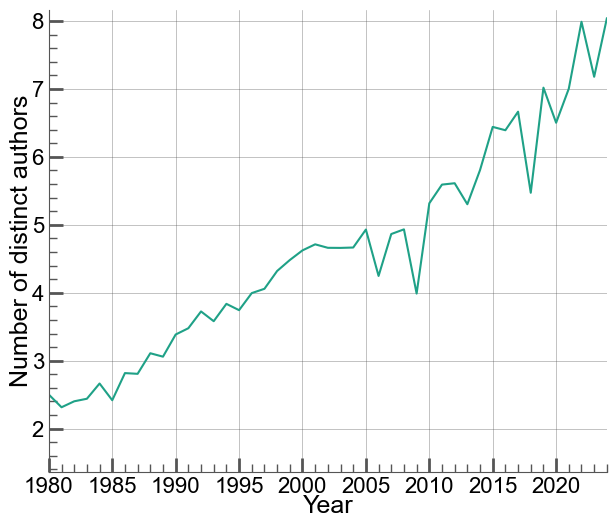

Mean authors count: 4.030036159730278
Median authors count: 3.836940836940837


In [231]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.lineplot(data = group_year_mean, x = "year", y = "authors_count", color = sns.color_palette("viridis")[3])
    plt.xlim(1980, 2024)
    plt.xlabel("Year", fontsize=18)
    plt.ylabel("Number of distinct authors", fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()

mean_value = group_year_mean["authors_count"].mean()
print(f"Mean authors count: {mean_value}")
median_value = group_year_mean["authors_count"].median()
print(f"Median authors count: {median_value}")

In [232]:
test_spearman = works.copy()
test_spearman.dropna(axis = 0, subset = "mean_citations_per_year", inplace=True)
pho, p_value = st.spearmanr(test_spearman["authors_count"], test_spearman["mean_citations_per_year"])
print(pho, p_value)

0.4882459109661567 0.0


#### N citations | N authors

In [233]:
works[["authors_count", "cited_by_count"]].groupby(by = "authors_count").count()

,cited_by_count
authors_count,
0.0,2089
1.0,1624
2.0,4887
3.0,4687
4.0,3473
5.0,2575
6.0,1905
7.0,1306
8.0,907


<Figure size 640x480 with 0 Axes>

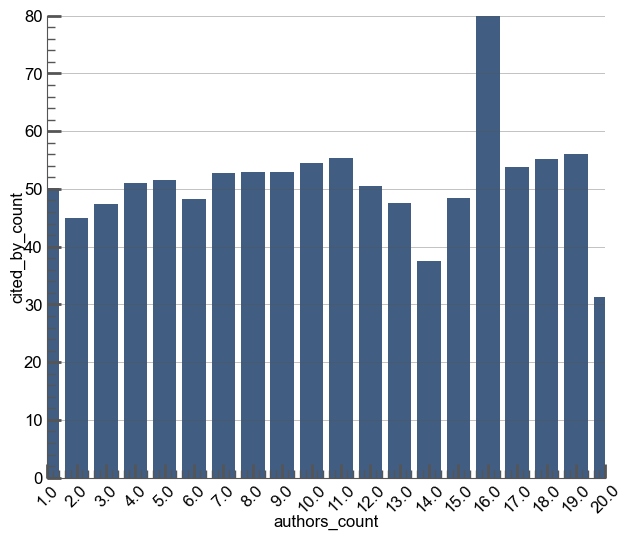

Mean authors count: 4.030036159730278
Median authors count: 3.836940836940837


In [234]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.barplot(data = group_Nauthors_mean, x = "authors_count", y = "cited_by_count", color = sns.color_palette("viridis")[1])
    plt.xlim(1,20)
    plt.ylim(0,80)
    plt.xticks(rotation = 45)
    plt.show()
    # Not enough articles beyond 20 authors

mean_value = group_year_mean["authors_count"].mean()
median_value = group_year_mean["authors_count"].median()
print(f"Mean authors count: {mean_value}")
print(f"Median authors count: {median_value}")

##### Citation rate

<Figure size 640x480 with 0 Axes>

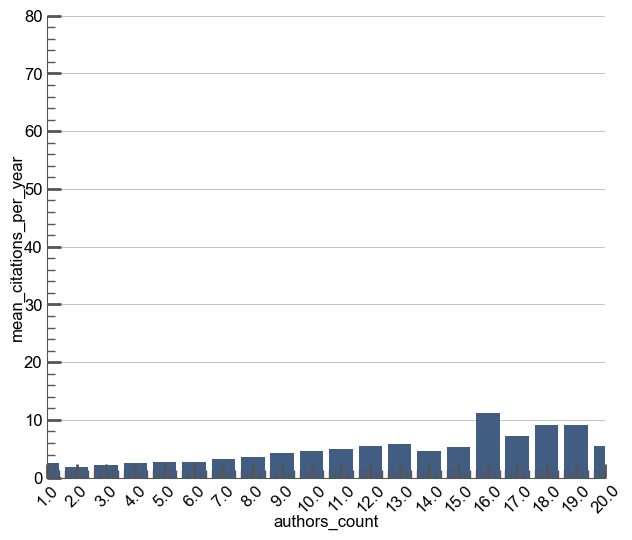

In [235]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.barplot(data = group_Nauthors_mean, x = "authors_count", y = "mean_citations_per_year", color = sns.color_palette("viridis")[1])
    plt.xlim(1,20)
    plt.ylim(0,80)
    plt.xticks(rotation = 45)
    plt.show()
    # Not enough articles beyond 20 authors

##### MNCS

<Figure size 640x480 with 0 Axes>

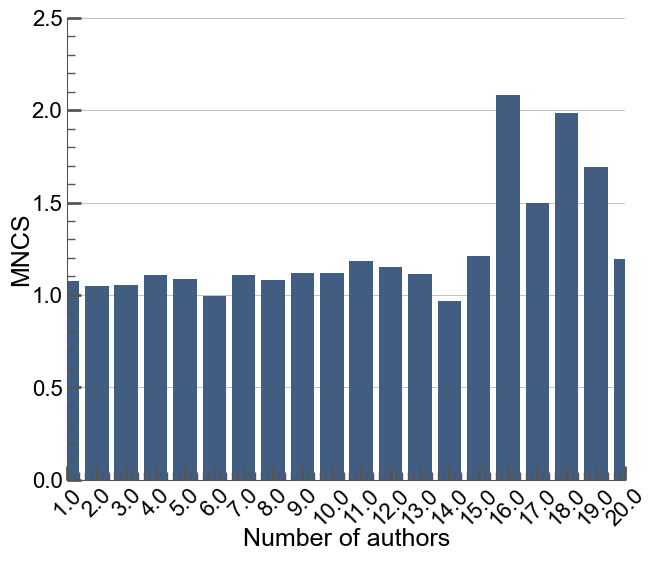

In [236]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.barplot(data = group_Nauthors_mean, x = "authors_count", y = "mncs", color = sns.color_palette("viridis")[1])
    plt.xlim(1,20)
    plt.ylim(0,2.5)
    plt.xticks(rotation = 45)
    plt.xlabel("Number of authors", fontsize=18)
    plt.ylabel("MNCS", fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()
    # Not enough articles beyond 20 authors

#### Top authors

In [237]:
authors

,author,cited_by_count,index_work,count,cumulative_count,cumulative_citations
0,https://openalex.org/A5114249750,7,0,1,0,0
1,https://openalex.org/A5020569499,7,0,1,0,0
2,https://openalex.org/A5108563163,0,1,1,0,0
3,https://openalex.org/A5086385394,19,2,1,0,0
4,https://openalex.org/A5112812836,19,2,1,0,0
...,...,...,...,...,...,...
112121,https://openalex.org/A5079705150,3,26115,1,3,44
112122,https://openalex.org/A5055232721,3,26115,1,0,0
112123,https://openalex.org/A5078703237,3,26115,1,0,0
112124,https://openalex.org/A5062277314,3,26115,1,0,0


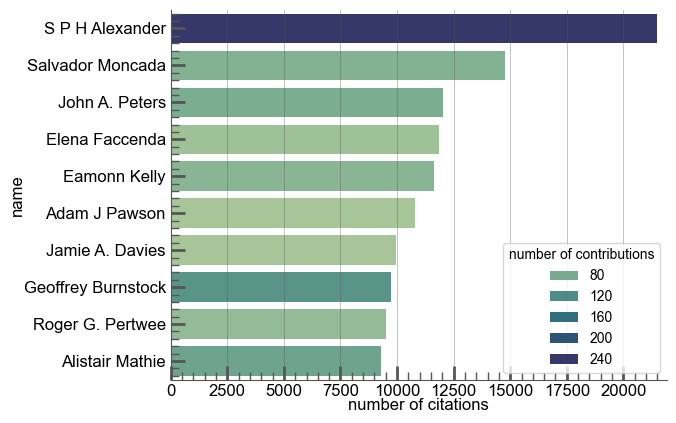

In [238]:
with aquarel.load_theme("scientific"):
    sns.barplot(data = top_10_authors, x = "number of citations", y = "name", orient = "h", hue = "number of contributions", palette = "crest", legend = True)
    #plt.xticks(rotation = 90)
    plt.show()

#### Top first position authors

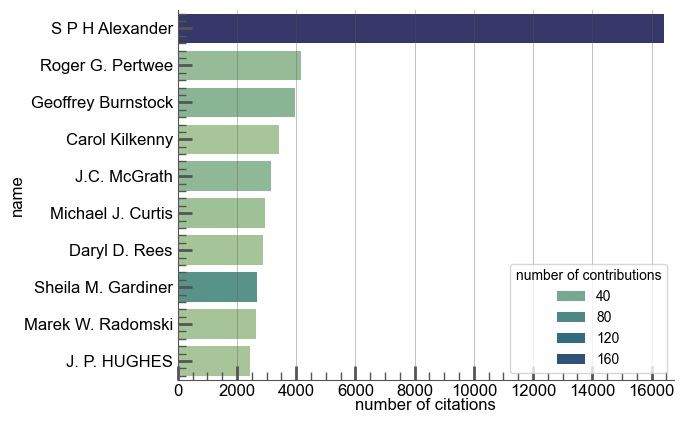

In [239]:
with aquarel.load_theme("scientific"):
    sns.barplot(data = top_10_fauthors, x = "number of citations", y = "name", orient = "h", hue = "number of contributions", palette = "crest", legend = True)
    plt.show()

#### Top authors simplified

C:\Users\gabri\AppData\Local\Temp\ipykernel_30176\806775777.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = top_10_authors, x = "number of citations", y = "name", orient = "h", palette = "viridis", legend = True)


<Figure size 640x480 with 0 Axes>

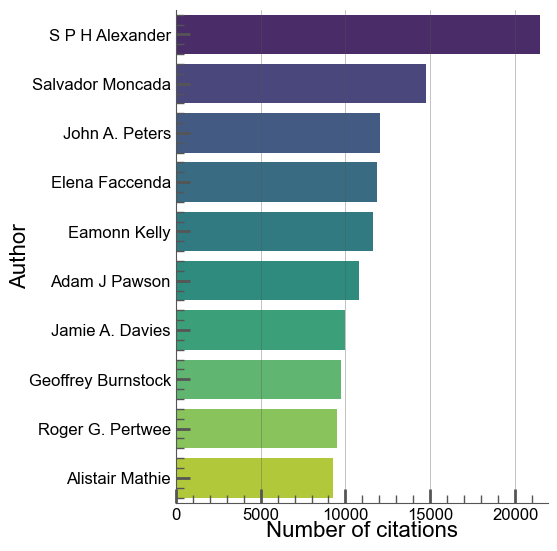

In [240]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(4.8,6.4))
    sns.barplot(data = top_10_authors, x = "number of citations", y = "name", orient = "h", palette = "viridis", legend = True)
    #plt.xticks(rotation = 90)
    plt.xlabel("Number of citations", fontsize=16)
    plt.ylabel("Author", fontsize=16)
    plt.show()

#### Impact of the past contributions

In [241]:
authors

,author,cited_by_count,index_work,count,cumulative_count,cumulative_citations
0,https://openalex.org/A5114249750,7,0,1,0,0
1,https://openalex.org/A5020569499,7,0,1,0,0
2,https://openalex.org/A5108563163,0,1,1,0,0
3,https://openalex.org/A5086385394,19,2,1,0,0
4,https://openalex.org/A5112812836,19,2,1,0,0
...,...,...,...,...,...,...
112121,https://openalex.org/A5079705150,3,26115,1,3,44
112122,https://openalex.org/A5055232721,3,26115,1,0,0
112123,https://openalex.org/A5078703237,3,26115,1,0,0
112124,https://openalex.org/A5062277314,3,26115,1,0,0


Percentage of contributions from authors without previous works in the journal : 

In [242]:
authors[authors["cumulative_count"] ==0].shape[0]/authors.shape[0]*100

56.24030108984536

## Countries 🗺️

### Data preparation ⚒️

#### List of countries

Countries = list of collaborations

In [243]:
countries = []
for index, article in works.iterrows():
    i = 1
    while pd.notna(article.get(f"country_{i}")) and i < 120:
        countries.append({
            "country_name" : article[f"country_{i}"], 
            "year" :  article["year"],
            "index":index,
            "cited_by_count" : article["cited_by_count"],
            "mncs": article["mncs"],
            "mean_citations_per_year": article["mean_citations_per_year"],
            })
        i += 1
countries = pd.DataFrame(countries)
countries["count"] = 1
countries["age"] = 2025 - countries["year"]

#### Groups (group_[columns]_[operation])

In [244]:
group_countriesyears_count = countries.groupby(by = ["country_name", "year"]).sum()
group_countriesyears_count.reset_index(inplace=True)
group_countriesyears_count.sort_values(by = "year", ascending = True, inplace = True)

group_countries_count = group_countriesyears_count.groupby(by = "country_name").sum()
group_countries_count.drop(columns = ["year", "index", "cited_by_count","mncs", "mean_citations_per_year"], inplace = True)
group_countries_count.sort_values(by = "count", ascending = False, inplace = True)
group_countries_count.reset_index(inplace = True)

In [274]:
group_countriesyears_cumsum = group_countriesyears_count.groupby(by=["country_name"]).cumsum()
group_countriesyears_cumsum.drop(columns="year", inplace=True)
group_countriesyears_cumsum[["country_name", "year"]] = group_countriesyears_count[["country_name", "year"]]
group_countriesyears_cumsum.rename(columns={"mncs":"sum_mncs"}, inplace=True)
group_countriesyears_cumsum["count"] -= group_countriesyears_count["count"]
group_countriesyears_cumsum["sum_mncs"] -= group_countriesyears_count["mncs"]
group_countriesyears_cumsum["mean_mncs"] = group_countriesyears_cumsum["sum_mncs"]/group_countriesyears_cumsum["count"]

In [247]:
group_countries_mean = countries.groupby(by = "country_name").mean()
group_countries_mean.sort_values(by = "cited_by_count",ascending = False, inplace = True)
group_countries_mean.reset_index(inplace = True)
group_countries_mean.drop(columns = ["year", "mean_citations_per_year", "index", "count"], inplace = True)
group_countries_mean.columns=["country_name", "mean_citations", "mean_mncs", "mean_age"]

In [248]:
top_countries = ((group_countries_count.head(5))["country_name"]).to_list()
top_countries

['GB', 'US', 'JP', 'IT', 'CN']

In [249]:
group_countries = pd.merge(group_countries_count, group_countries_mean, on = "country_name")
group_countries.sort_values(by = "count", ascending = False, inplace = True)
group_countries.head(n = 10) 

,country_name,count,age,mean_citations,mean_mncs,mean_age
0,GB,20873,560656,66.565132,1.548932,26.860346
1,US,15918,344611,59.597123,1.373285,21.649139
2,JP,8923,222826,39.693489,0.854742,24.972095
3,IT,7640,159991,53.749738,1.192936,20.941230
4,CN,7603,55284,38.218072,1.108652,7.271340
5,DE,6410,122600,48.708268,1.091272,19.126365
6,FR,5655,129807,48.409549,1.099891,22.954377
7,AU,4749,103872,50.143609,1.190638,21.872394
8,ES,4389,79826,43.521531,0.981111,18.187742
9,CA,4376,109811,49.003885,1.103227,25.093921


In [250]:
group_Ncountries_mean = (
    works[["cited_by_count", "countries_distinct_count", "mean_citations_per_year", "mncs"]]
    .groupby(by = "countries_distinct_count")
    .mean()
)

the cell below should be execute only once

In [251]:
group_countries.set_index("country_name", inplace=True)

#### Features in works for future modelling

Adding two new features to work (for the modelling of mncs):
- the average (if >1 countries involved in the work) of the mean mncs of countries before the publication of the work
- the average (idem) of the number of works of countries

In [280]:
for index, row in works.iterrows():
    i = 1
    n_countries = 0
    works.loc[index, "countries_mean_mncs"] = 0
    works.loc[index, "countries_mean_number_works"] = 0


    while pd.notna(row[f"country_{i}"]) and i<120:
        year = row["year"]
        subset = group_countriesyears_cumsum[(group_countriesyears_cumsum["country_name"] == row[f"country_{i}"]) & (group_countriesyears_cumsum["year"] == year)]
        while subset.empty == True: # if the country has no work for this year...
            if year==1967:
                break
            year -= 1 # then try the year before
            subset = group_countriesyears_cumsum[(group_countriesyears_cumsum["country_name"] == row[f"country_{i}"]) & (group_countriesyears_cumsum["year"] == year)]

        if not subset.empty: # if the country have already published a work since 1967...
            works.loc[index, "countries_mean_mncs"] += subset["mean_mncs"].iloc[0]
            works.loc[index, "countries_mean_number_works"] += subset["count"].iloc[0]
            n_countries += 1
        i += 1     
        
    if n_countries > 0:
        works.loc[index, "countries_mean_mncs"] /= n_countries # we divide by the number of countries in the study
        works.loc[index, "countries_mean_number_works"] /= n_countries
    else:
        works.loc[index, "countries_mean_mncs"] = None # None if none of the countries have previous works
        works.loc[index, "countries_mean_number_works"] = None


    if index%100 == 0:
        print(f"Progress: {index/works.shape[0]*100} %")
        clear_output(wait=True)


Progress: 99.93873487517232 %


### Data analysis 📊

#### Average ages of publications per country

In [254]:
age_countries = (
    (countries[["country_name", "age"]])[countries["country_name"].isin(top_countries)]
    .groupby(by = "country_name")
    .mean()
)

C:\Users\gabri\AppData\Local\Temp\ipykernel_30176\2960720236.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = age_countries, x = "country_name", y = "age", palette = "viridis_r")


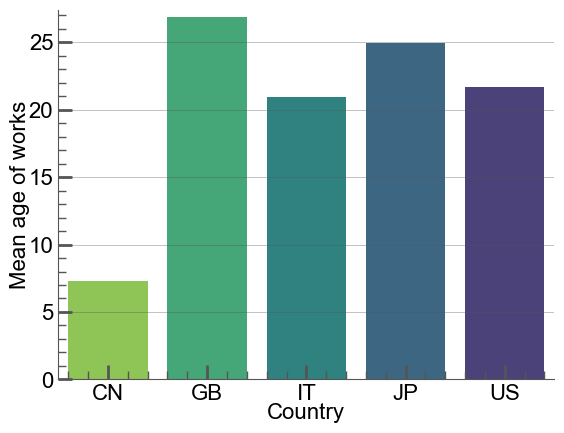

In [255]:
with aquarel.load_theme("scientific"):
    sns.barplot(data = age_countries, x = "country_name", y = "age", palette = "viridis_r")
    plt.ylabel("Mean age of works", fontsize=16)
    plt.xlabel("Country", fontsize=16)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()

In [75]:
group_countriesyears_count

,country_name,year,index,cited_by_count,mncs,mean_citations_per_year,count,age
881,GB,1995,10937517,48396,1178.584941,1613.200000,860,25800
468,CN,2019,5938731,37693,935.277639,6282.166667,790,4740
882,GB,1996,9303503,40965,958.816709,1412.586207,770,22330
473,CN,2024,10622430,2167,868.318925,2167.000000,763,763
470,CN,2021,6912130,19604,848.753444,4901.000000,713,2852
...,...,...,...,...,...,...,...,...
8,AR,1970,3969,57,1.587991,1.036364,1,55
2292,ZA,2012,5235,52,0.992263,4.000000,1,13
2291,ZA,2010,16422,13,0.188755,0.866667,1,15
0,AE,2002,20533,10,0.193286,0.434783,1,23


France is ranked 7 and Hungary is ranked 19. 119 countries

In [256]:
group_countriesyears_count

,country_name,year,index,cited_by_count,mncs,mean_citations_per_year,count,age
1250,IT,1968,485,957,15.413221,16.789474,12,684
401,CL,1968,36,42,0.676442,0.736842,2,114
344,CH,1968,201,337,5.427644,5.912281,4,228
854,GB,1968,2014,2202,35.464904,38.631579,44,2508
1058,IE,1968,48,10,0.161058,0.175439,1,57
...,...,...,...,...,...,...,...,...
1445,LV,2024,363687,76,30.453271,76.000000,14,14
43,AR,2024,103696,4,1.602804,4.000000,4,4
1437,LU,2024,129687,29,11.620327,29.000000,5,5
1400,KR,2024,2075862,151,60.505841,151.000000,80,80


<Figure size 640x480 with 0 Axes>

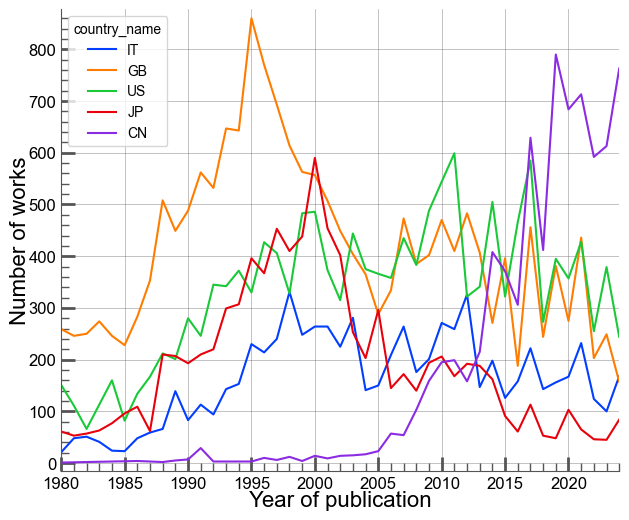

In [257]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.lineplot(data = group_countriesyears_count[group_countriesyears_count["country_name"].isin(top_countries)], x = "year", y = "count", hue = "country_name", palette = "bright")
    plt.xlim(1980, 2024)
    plt.xlabel("Year of publication", fontsize=16)
    plt.ylabel("Number of works", fontsize=16)
    plt.show()

#### Mean citations per country

In [78]:
works

,title,year,cited_by_count,countries_distinct_count,institutions_distinct_count,citation_normalized_percentile,primary_topic,keywords,concepts,referenced_works_count,...,age,mean_citations_per_year,mncs,authors_count,meta-analysis,review,sum_past_contributions_authors,sum_past_citations_authors,countries_mean_mncs,countries_mean_number_works
0,Animal research: Reporting <i>in vivo</i> expe...,2010,3423,1,4,"{'value': 0.99971, 'is_in_top_1_percent': True...","('Animal testing and alternatives',)",[{'id': 'https://openalex.org/keywords/watson'...,"[{'id': 'https://openalex.org/C161191863', 'wi...",6,...,15,228.200000,49.700581,5.0,False,False,0.0,0.0,1.290777,17394.166667
1,Principles of early drug discovery,2010,2434,1,2,"{'value': 0.756098, 'is_in_top_1_percent': Fal...","('Computational Drug Discovery Methods',)",[{'id': 'https://openalex.org/keywords/identif...,"[{'id': 'https://openalex.org/C74187038', 'wik...",25,...,15,162.266667,35.340700,4.0,False,True,0.0,0.0,1.239146,16698.400000
2,Measuring reactive species and oxidative damag...,2004,2194,1,1,"{'value': 0.990741, 'is_in_top_1_percent': Tru...","('Antioxidant Activity and Oxidative Stress',)",[],"[{'id': 'https://openalex.org/C207001950', 'wi...",386,...,21,104.476190,36.240673,2.0,False,True,0.0,0.0,1.353610,198.666667
3,"Guide to Receptors and Channels (GRAC), 5th ed...",2011,2071,1,3,"{'value': 0.999918, 'is_in_top_1_percent': Tru...","('Inflammatory mediators and NSAID effects',)",[],"[{'id': 'https://openalex.org/C170493617', 'wi...",2,...,14,147.928571,30.206978,3.0,False,False,0.0,0.0,1.032621,13915.333333
4,Characterization of three inhibitors of endoth...,1990,1874,1,1,"{'value': 0.999876, 'is_in_top_1_percent': Tru...","('Nitric Oxide and Endothelin Effects',)",[{'id': 'https://openalex.org/keywords/omega-n...,"[{'id': 'https://openalex.org/C2908937200', 'w...",37,...,35,53.542857,40.007506,5.0,False,False,0.0,0.0,1.290777,17394.166667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26312,NaN,1986,0,0,0,NaN,NaN,[],"[{'id': 'https://openalex.org/C41008148', 'wik...",0,...,39,0.000000,0.000000,0.0,NaN,NaN,0.0,0.0,0.000000,0.000000
26313,Transdermal Iontophoresis - Role of the Stratu...,1994,0,0,0,"{'value': 0.0, 'is_in_top_1_percent': False, '...","('Chemotherapy-related skin toxicity',)",[{'id': 'https://openalex.org/keywords/iontoph...,"[{'id': 'https://openalex.org/C183529106', 'wi...",0,...,31,0.000000,0.000000,2.0,False,False,0.0,0.0,0.000000,0.000000
26314,ORAL COMMUNICATIONS,1991,0,0,0,"{'value': 0.0, 'is_in_top_1_percent': False, '...","('Attention Deficit Hyperactivity Disorder',)",[],"[{'id': 'https://openalex.org/C71924100', 'wik...",266,...,34,0.000000,0.000000,2.0,False,False,43.0,1086.0,0.000000,0.000000
26315,Interleukin 1 and lipopolysaccharide effects o...,1989,0,0,0,"{'value': 0.0, 'is_in_top_1_percent': False, '...","('Inflammatory mediators and NSAID effects',)",[{'id': 'https://openalex.org/keywords/interle...,"[{'id': 'https://openalex.org/C2777956040', 'w...",0,...,36,0.000000,0.000000,2.0,False,False,8.0,6.0,0.000000,0.000000


In [79]:
group_countries.sort_values(by = "mean_citations", ascending = False, inplace = True)
group_countries.head(n = 18)

,count,age,mean_citations,mean_mncs,mean_age
country_name,,,,,
NP,1,14,211.000000,3.077582,14.000000
KE,1,34,180.000000,4.001933,34.000000
EC,1,35,121.000000,2.583195,35.000000
PY,8,324,111.500000,3.035718,40.500000
EE,8,178,106.750000,2.312324,22.250000
RE,3,54,103.000000,1.272324,18.000000
SG,298,4478,101.536913,2.030415,15.026846
MG,1,33,97.000000,2.065970,33.000000
ZM,2,35,86.500000,2.147400,17.500000


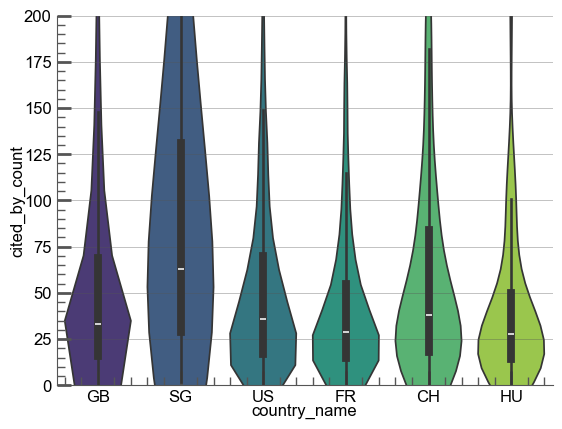

In [80]:
countries_examples = countries[countries["country_name"].isin(["GB", "FR", "HU", "US", "CH", "SG"])]

with aquarel.load_theme("scientific"):
    sns.violinplot(x = "country_name", y = "cited_by_count", data = countries_examples, hue = "country_name", palette = "viridis")
    plt.ylim(0, 200)
    plt.show()

Data transformation for a better visualization :

In [258]:
# studying only the countries with more than 5 articles published
group_countries = group_countries[group_countries["count"] > 5]
# log(x)
group_countries["count_log"] = np.log(group_countries["count"])
# centering y
group_countries["mean_citations_centered"] = group_countries["mean_citations"] - group_countries["mean_citations"].mean()
# rescale [-1, 1]
group_countries["count_viz"] = -1 + 2 * group_countries["count_log"] / group_countries["count_log"].max()
group_countries["mean_citations_viz"] = group_countries["mean_citations_centered"] / group_countries["mean_citations_centered"].max()

In [259]:
group_countries.reset_index(inplace=True)

<Figure size 640x480 with 0 Axes>

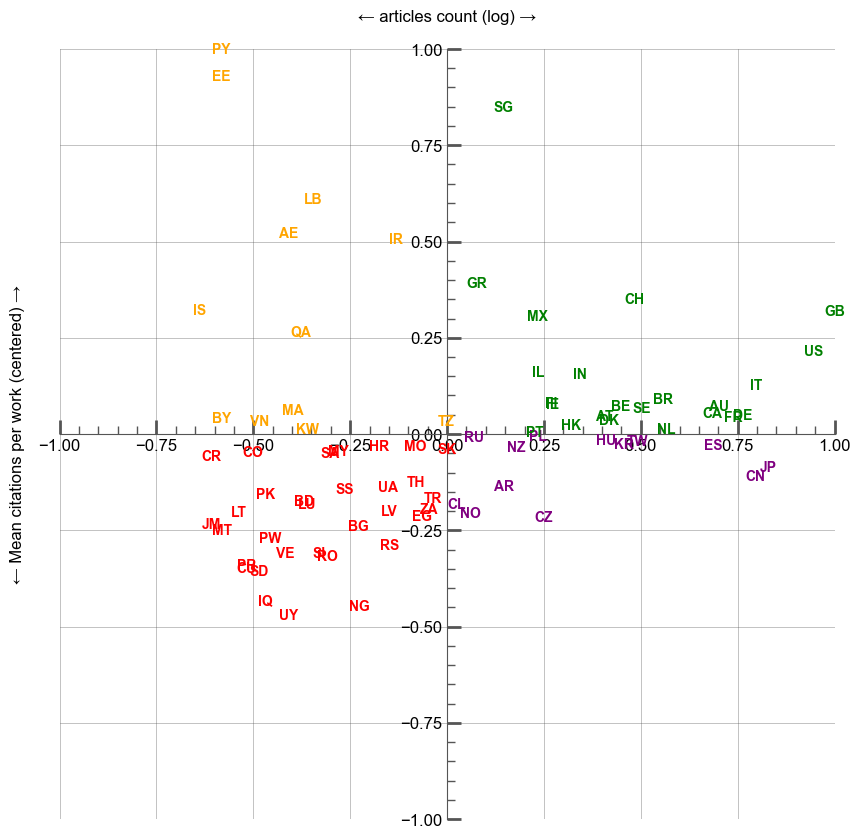

In [260]:
plt.figure(figsize = (10, 10))
for index, row in group_countries.iterrows():
    if row["mean_citations_viz"] >= 0 and row["count_viz"] >= 0:
        color = "green"
    elif row["mean_citations_viz"] < 0 and row["count_viz"] >= 0:
        color = "purple"
    elif row["mean_citations_viz"] < 0 and row["count_viz"] < 0:
        color = "red"
    else:
        color = "orange"
    plt.text(row["count_viz"], row["mean_citations_viz"], row["country_name"],
             ha = "center", va = "center", fontsize = 10, fontweight = "bold", color = color)
    

plt.xlabel("← articles count (log) →", labelpad = - 320) # labelpad = décalage du label
plt.ylabel("← Mean citations per work (centered) →", labelpad = 270)
plt.xlim(-1, 1)
plt.ylim(-1, 1)
# position of the two axes
ax = plt.gca()
ax.spines['left'].set_position('zero')   # axe Y à x=0
ax.spines['bottom'].set_position('zero') # axe X à y=0

plt.show()

##### MNCS MinMaxScaling

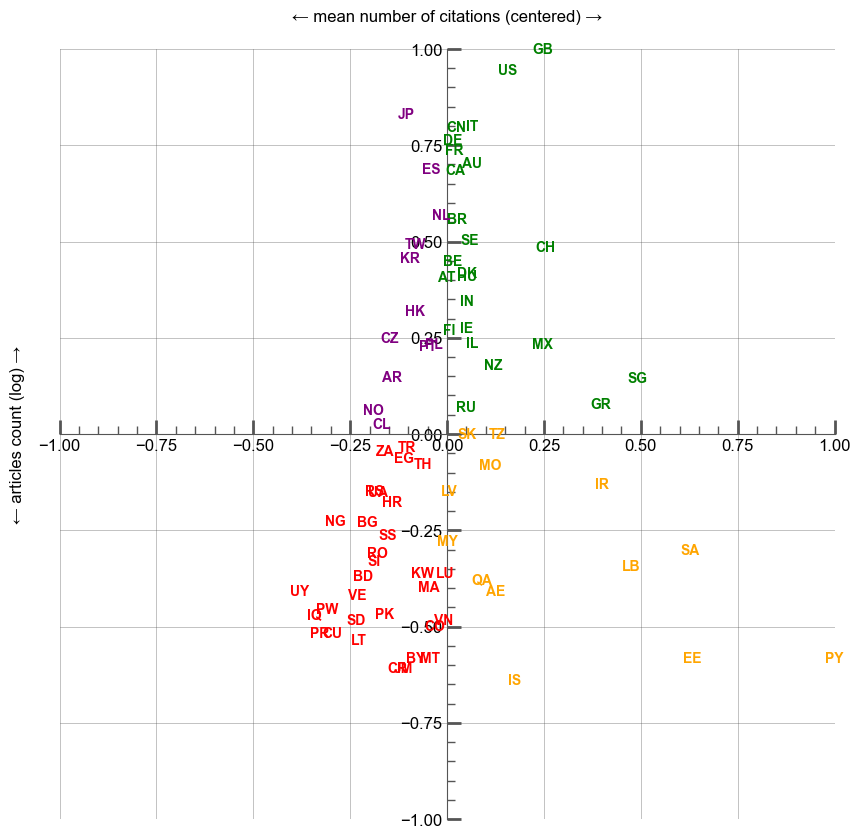

In [84]:
# studying only the countries with more than 5 articles published
group_countries = group_countries[group_countries["count"] > 5]
# log(x)
group_countries["count_log"] = np.log(group_countries["count"])
# centering y
group_countries["mean_mncs_centered"] = group_countries["mean_mncs"] - group_countries["mean_mncs"].mean()
# rescale [-1, 1]
group_countries["count_viz"] = -1 + 2 * group_countries["count_log"] / group_countries["count_log"].max()
group_countries["mean_mncs_viz"] = group_countries["mean_mncs_centered"] / group_countries["mean_mncs_centered"].max()

plt.figure(figsize = (10, 10))
for index, row in group_countries.iterrows():
    if row["mean_mncs_viz"] >= 0 and row["count_viz"] >= 0:
        color = "green"
    elif row["mean_mncs_viz"] < 0 and row["count_viz"] >= 0:
        color = "purple"
    elif row["mean_mncs_viz"] < 0 and row["count_viz"] < 0:
        color = "red"
    else:
        color = "orange"
    plt.text(row["mean_mncs_viz"], row["count_viz"], row["country_name"],
             ha = "center", va = "center", fontsize = 10, fontweight = "bold", color = color)
    

plt.xlabel("← mean number of citations (centered) →", labelpad = - 320) # labelpad = décalage du label
plt.ylabel("← articles count (log) →", labelpad = 270)
plt.xlim(-1, 1)
plt.ylim(-1, 1)
# position of the two axes
ax = plt.gca()
ax.spines['left'].set_position('zero')   # axe Y à x=0
ax.spines['bottom'].set_position('zero') # axe X à y=0

plt.show()

##### MNCS StandardScaling

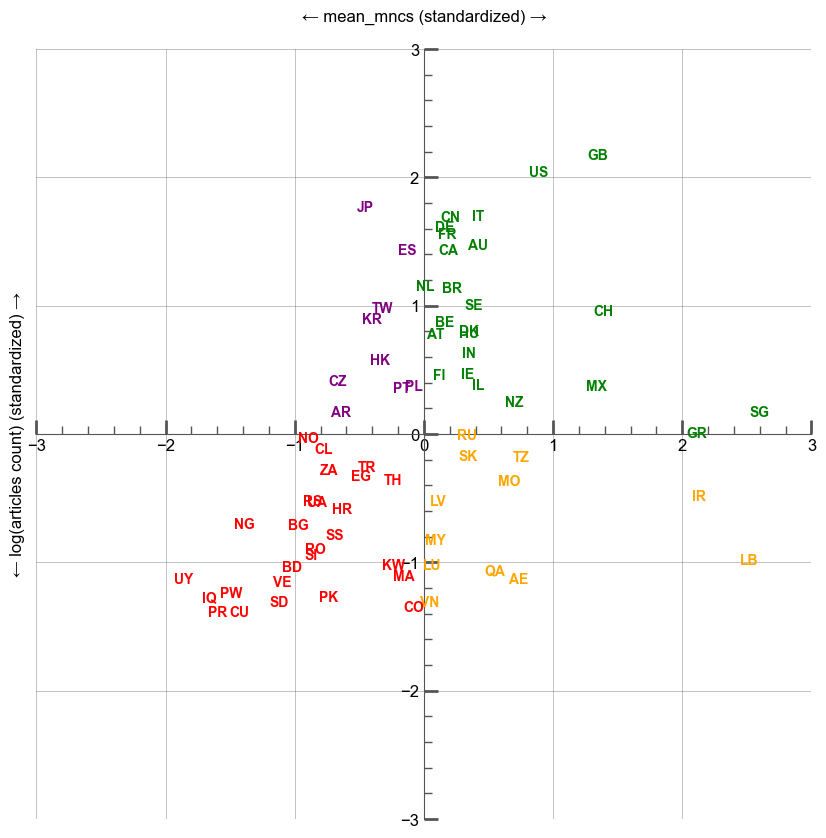

In [261]:
# studying only the countries with more than 5 articles published
group_countries = group_countries[group_countries["count"] > 10]
# log(x)
group_countries["count_log"] = np.log(group_countries["count"])
# standard scaling
group_countries["mean_mncs_viz"] = (group_countries["mean_mncs"] - group_countries["mean_mncs"].mean())/group_countries["mean_mncs"].std()
group_countries["count_viz"] = (group_countries["count_log"] - group_countries["count_log"].mean())/group_countries["count_log"].std()

plt.figure(figsize = (10, 10))
for index, row in group_countries.iterrows():
    if row["mean_mncs_viz"] >= 0 and row["count_viz"] >= 0:
        color = "green"
    elif row["mean_mncs_viz"] < 0 and row["count_viz"] >= 0:
        color = "purple"
    elif row["mean_mncs_viz"] < 0 and row["count_viz"] < 0:
        color = "red"
    else:
        color = "orange"
    if row["country_name"] != "SA":
        plt.text(row["mean_mncs_viz"], row["count_viz"], row["country_name"],
                 ha = "center", va = "center", fontsize = 10, fontweight = "bold", color = color)
    

plt.xlabel("← mean_mncs (standardized) →", labelpad = - 320) # labelpad = décalage du label
plt.ylabel("← log(articles count) (standardized) →", labelpad = 270)
plt.xlim(-3, 3)
plt.ylim(-3, 3)
# position of the two axes
ax = plt.gca()
ax.spines['left'].set_position('zero')   # axe Y à x=0
ax.spines['bottom'].set_position('zero') # axe X à y=0

plt.show()

#### N citations | N countries

In [84]:
works[["cited_by_count", "countries_distinct_count"]].groupby(by = "countries_distinct_count").count()

,cited_by_count
countries_distinct_count,
0,3425
1,16833
2,4753
3,870
4,146
5,28
6,16
7,8
8,17


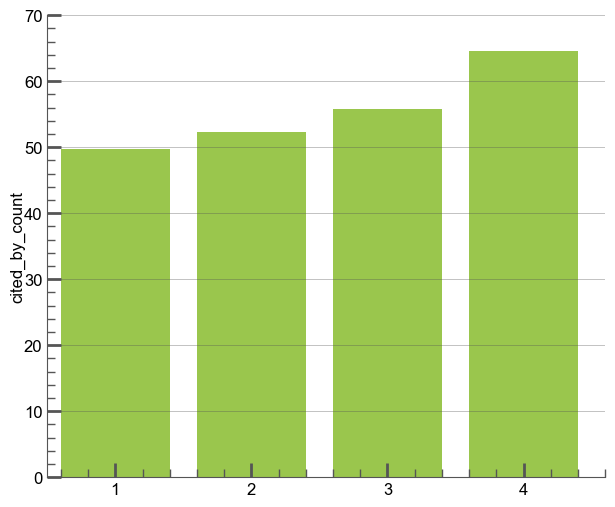

In [86]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.barplot(data = group_Ncountries_mean, x = "countries_distinct_count", y = "cited_by_count", color = sns.color_palette("viridis")[5])
    plt.xlim(0.5, 4.6)
    plt.ylim(0,70)
    plt.xlabel("")
    plt.show()

##### Citation rate

Mean authors count: 1.156953591667943
Median authors count: 1.0


<Figure size 640x480 with 0 Axes>

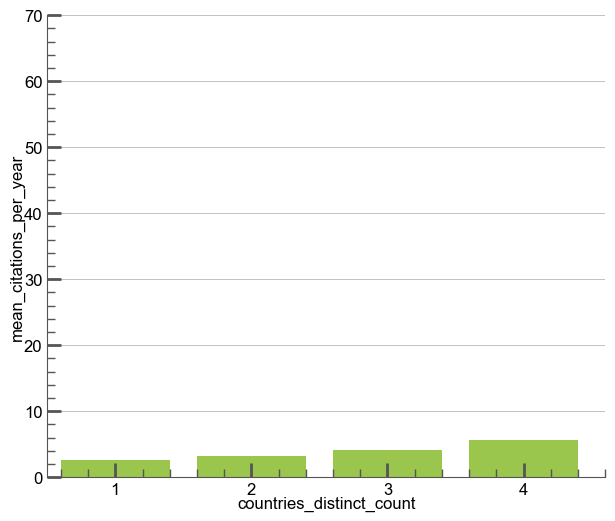

In [87]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.barplot(data = group_Ncountries_mean, x = "countries_distinct_count", y = "mean_citations_per_year", color = sns.color_palette("viridis")[5])
    mean_value = works["countries_distinct_count"].mean()
    print(f"Mean authors count: {mean_value}")
    median_value = works["countries_distinct_count"].median()
    print(f"Median authors count: {median_value}")
    plt.xlim(0.5, 4.6)
    plt.ylim(0,70)
    # plt.xticks(rotation = 45)
    plt.show()

##### MNCS

<Figure size 640x480 with 0 Axes>

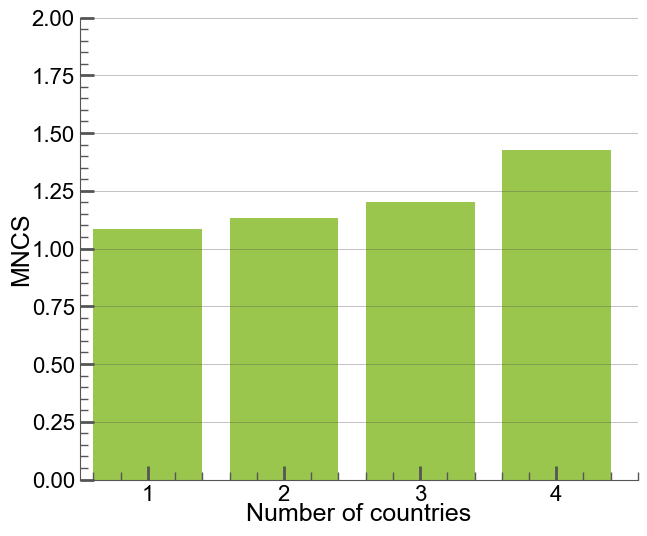

In [88]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.barplot(data = group_Ncountries_mean, x = "countries_distinct_count", y = "mncs", color = sns.color_palette("viridis")[5])
    plt.xlim(0.5, 4.6)
    plt.ylim(0,2)
    # plt.xticks(rotation = 45)
    plt.xlabel("Number of countries", fontsize=18)
    plt.ylabel("MNCS", fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()

## Institutions 🏦

### Data Preparation ⚒️

NB: We are counting the contributions, not the articles

#### List of institutions

In [262]:
institutions = []

for index, article in works.iterrows():
    i = 1
    while pd.notna(article.get(f"institution_{i}")):
        institutions.append({
            "institution" : article[f"institution_{i}"], 
            "year" :  article["year"], 
            "cited_by_count" : article["cited_by_count"],
            "mncs": article["mncs"]
            })
        i += 1

institutions = pd.DataFrame(institutions)
institutions["count"] = 1

for index, row in institutions.iterrows():
    ajout =  row["institution"].split(",", 1)[0]
    ajout = ajout[2:-1]
    institutions.loc[index, "institution_simple"] = ajout

In [263]:
institutions

,institution,year,cited_by_count,mncs,count,institution_simple
0,"['Pfizer (United Kingdom)', 'https://openalex....",1968,14,0.225481,1,Pfizer (United Kingdom)
1,"['Pfizer (United Kingdom)', 'https://openalex....",1968,14,0.225481,1,Pfizer (United Kingdom)
2,"['Pfizer (United Kingdom)', 'https://openalex....",1968,14,0.225481,1,Pfizer (United Kingdom)
3,"['Universidade Federal do Rio de Janeiro', 'ht...",1968,4,0.064423,1,Universidade Federal do Rio de Janeiro
4,"['Universidade Federal do Rio de Janeiro', 'ht...",1968,4,0.064423,1,Universidade Federal do Rio de Janeiro
...,...,...,...,...,...,...
129668,"['Mayo Clinic', 'https://openalex.org/I1330342...",2024,3,1.202103,1,Mayo Clinic
129669,['The University of Texas Southwestern Medical...,2024,3,1.202103,1,The University of Texas Southwestern Medical C...
129670,"['University of California, San Diego', 'https...",2024,3,1.202103,1,University of Californi
129671,"['Mayo Clinic', 'https://openalex.org/I1330342...",2024,3,1.202103,1,Mayo Clinic


#### Groups (group_[columns]_[operation])

In [264]:
group_institutionsyears_sum = institutions.groupby(by = ["institution_simple", "year", "institution"]).sum().reset_index()

In [313]:
group_institutionsyears_sum.sort_values(by = "year", ascending = True, inplace = True) # the sort is essential (for the correctness of the cumsum)
group_institutionsyears_cumsum = group_institutionsyears_sum.drop(columns=["institution_simple"]).groupby(by=["institution"]).cumsum()
group_institutionsyears_cumsum.drop(columns="year", inplace=True)
group_institutionsyears_cumsum[["institution", "year"]] = group_institutionsyears_sum[["institution", "year"]]
group_institutionsyears_cumsum.rename(columns={"mncs":"sum_mncs"}, inplace=True)
group_institutionsyears_cumsum["sum_mncs"] -= group_institutionsyears_sum["mncs"]
group_institutionsyears_cumsum["count"] -= group_institutionsyears_sum["count"]
group_institutionsyears_cumsum["mean_mncs"] = group_institutionsyears_cumsum["sum_mncs"]/group_institutionsyears_cumsum["count"]

In [266]:
group_institutions_sum = (institutions[["institution_simple", "count", "cited_by_count", "mncs", "institution"]]).groupby(by = ["institution_simple", "institution"]).sum()
group_institutions_sum.sort_values(by = "count", ascending = False, inplace = True)
group_institutions_sum.reset_index(inplace = True)
top_institutions = ((group_institutions_sum.head(3))["institution_simple"]).to_list()
top_institutions



['Inserm',
 'University College London',
 'Centre National de la Recherche Scientifique']

In [267]:
group_institutions_sum.sort_values(by = "cited_by_count", inplace = True, ascending = False)
group_institutions_sum.loc[group_institutions_sum["institution_simple"]=="Centre National de la Recherche Scientifique", "institution_simple"] = "CNRS"

In [268]:
group_Ninstitutions_mean = (
    works[["cited_by_count", "institutions_distinct_count", "mean_citations_per_year", "mncs"]]
    .groupby(by = "institutions_distinct_count")
    .mean()
)


#### Features in works for future modelling

In [315]:
for index, row in works.iterrows():
    i = 1
    n_institutions = 0
    works.loc[index, "institutions_mean_mncs"] = 0
    works.loc[index, "institutions_mean_number_works"] = 0


    while pd.notna(row[f"institution_{i}"]) and i<120:
        year = row["year"]
        subset = group_institutionsyears_cumsum[(group_institutionsyears_cumsum["institution"] == row[f"institution_{i}"]) & (group_institutionsyears_cumsum["year"] == year)]
        while subset.empty == True: # if the institution has no work for this year...
            if year==1967:
                break
            year -= 1 # then try the year before
            subset = group_institutionsyears_cumsum[(group_institutionsyears_cumsum["institution"] == row[f"institution_{i}"]) & (group_institutionsyears_cumsum["year"] == year)]

        if not subset.empty: # if the institution have already published a work since 1967...
            works.loc[index, "institutions_mean_mncs"] += subset["mean_mncs"].iloc[0]
            works.loc[index, "institutions_mean_number_works"] += subset["count"].iloc[0]
            n_institutions += 1
        i += 1     
        
    if n_institutions > 0:
        works.loc[index, "institutions_mean_mncs"] /= n_institutions # we divide by the number of institutions in the study
        works.loc[index, "institutions_mean_number_works"] /= n_institutions
    else:
        works.loc[index, "institutions_mean_mncs"] = None # None if none of the institutions have previous works
        works.loc[index, "institutions_mean_number_works"] = None


    if index%100 == 0:
        print(f"Progress: {index/works.shape[0]*100} %")
        clear_output(wait=True)


Progress: 99.93873487517232 %


In [ ]:
group_institutionsyears_sum.sort_values("count", ascending=False)

,institution_simple,year,institution,cited_by_count,mncs,count
8618,La Jolla Alcohol Research,2016,"['La Jolla Alcohol Research', 'https://openale...",0,0.000000,190
11760,New Frontier,2000,"['New Frontier', 'https://openalex.org/I421008...",12517,247.700826,108
18421,University College London,1996,"['University College London', 'https://openale...",5392,126.203825,98
8619,La Jolla Alcohol Research,2017,"['La Jolla Alcohol Research', 'https://openale...",0,0.000000,98
6313,Inserm,2001,"['Inserm', 'https://openalex.org/I154526488']",4721,93.446016,92
...,...,...,...,...,...,...
12625,Palladin Institute of Biochemistry,2024,"['Palladin Institute of Biochemistry', 'https:...",1,0.400701,1
12624,Palacký University Olomouc,2024,"['Palacký University Olomouc', 'https://openal...",1,0.400701,1
3367,Discovery Institute,2024,"['Discovery Institute', 'https://openalex.org/...",0,0.000000,1
12160,Novartis (Switzerland),1968,"['Novartis (Switzerland)', 'https://openalex.o...",31,0.499279,1


In [316]:
works

,title,year,cited_by_count,countries_distinct_count,institutions_distinct_count,citation_normalized_percentile,primary_topic,keywords,concepts,referenced_works_count,...,review,sum_past_contributions_authors,sum_past_citations_authors,countries_mean_mncs,countries_mean_number_works,institutions_mean_mncs,institutions_mean_number_works,sum_past_mncs_authors,mean_past_mncs_authors,mean_past_contributions_authors
0,"The Chemo-therapeutie Aetion of Streptomycin, ...",1948,7,0,0,"{'value': 0.776744, 'is_in_top_1_percent': Fal...","('Veterinary medicine and infectious diseases',)",[],"[{'id': 'https://openalex.org/C2775843808', 'w...",0,...,False,0.0,0.0,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000
1,"The Constitution of Pbotostilbamldlne, the Irr...",1948,0,0,0,"{'value': 0.0, 'is_in_top_1_percent': False, '...","('Lanthanide and Transition Metal Complexes',)",[],"[{'id': 'https://openalex.org/C2776154427', 'w...",0,...,False,0.0,0.0,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000
2,Antryeide A aew trypanocidal drug.,1950,19,0,0,"{'value': 0.937652, 'is_in_top_1_percent': Fal...",('Phytochemistry and biological activities of ...,[{'id': 'https://openalex.org/keywords/trypano...,"[{'id': 'https://openalex.org/C2776684476', 'w...",0,...,False,0.0,0.0,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000
3,Procaine perfused into cerebral ventricles and...,1968,6,1,1,"{'value': 0.770715, 'is_in_top_1_percent': Fal...",('Traumatic Brain Injury and Neurovascular Dis...,[{'id': 'https://openalex.org/keywords/subarac...,"[{'id': 'https://openalex.org/C42219234', 'wik...",9,...,False,0.0,0.0,NaN,0.000000,NaN,0.000000,0.000000,NaN,0.000000
4,The cholinergic properties of some amino‐acid ...,1968,25,1,1,"{'value': 0.72933, 'is_in_top_1_percent': Fals...","('Nicotinic Acetylcholine Receptors Study',)",[],"[{'id': 'https://openalex.org/C188987157', 'wi...",14,...,False,0.0,0.0,NaN,0.000000,NaN,0.000000,0.000000,NaN,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26111,"The cytoplasmic sensor, the AIM2 inflammasome:...",2024,3,2,4,"{'value': 0.999982, 'is_in_top_1_percent': Tru...","('Inflammasome and immune disorders',)","[{'id': 'https://openalex.org/keywords/aim2', ...","[{'id': 'https://openalex.org/C2777209026', 'w...",191,...,True,10.0,349.0,1.115402,6570.125000,NaN,111.500000,9.387139,0.938714,1.250000
26112,Innovative pharmacotherapy for hepatic metabol...,2024,3,1,1,"{'value': 0.730161, 'is_in_top_1_percent': Fal...","('Liver Disease Diagnosis and Treatment',)",[{'id': 'https://openalex.org/keywords/liver-c...,"[{'id': 'https://openalex.org/C2778772119', 'w...",134,...,False,13.0,512.0,1.105375,6840.000000,1.089818,276.000000,9.825888,0.755838,2.166667
26113,Structural bases for stoichiometry‐selective c...,2024,3,2,9,"{'value': 0.999982, 'is_in_top_1_percent': Tru...","('Nicotinic Acetylcholine Receptors Study',)",[{'id': 'https://openalex.org/keywords/n-type-...,"[{'id': 'https://openalex.org/C519063684', 'wi...",61,...,False,5.0,104.0,1.406428,16514.333333,NaN,198.666667,2.369164,0.473833,1.000000
26114,Insight into structural properties of viral G ...,2024,2,3,4,"{'value': 0.5, 'is_in_top_1_percent': False, '...","('Influenza Virus Research Studies',)",[{'id': 'https://openalex.org/keywords/viral-i...,"[{'id': 'https://openalex.org/C170493617', 'wi...",213,...,True,19.0,550.0,1.077325,2295.571429,1.516238,190.500000,26.469333,1.393123,2.714286


In [317]:
works[works["institution_1"] == "['University of Cambridge', 'https://openalex.org/I241749']"]["institutions_mean_number_works"].plot()
works[works["institution_1"] == "['China Pharmaceutical University', 'https://openalex.org/I161716053']"]["institutions_mean_number_works"].plot()  

<Axes: >

### Data Analysis 📊

#### Top institutions evolution, and link with prestige

In [318]:
group_institutionsyears_sum

,institution_simple,year,institution,cited_by_count,mncs,count
10285,Middlesex Hospital,1968,"['Middlesex Hospital', 'https://openalex.org/I...",60,0.966346,3
1837,Central State Hospital,1968,"['Central State Hospital', 'https://openalex.o...",68,1.095192,2
17349,Umeå University,1968,"['Umeå University', 'https://openalex.org/I902...",4,0.064423,1
21090,University of London,1968,"['University of London', 'https://openalex.org...",142,2.287019,4
8842,Leicester College,1968,"['Leicester College', 'https://openalex.org/I2...",44,0.708654,1
...,...,...,...,...,...,...
15962,Taylor Family Institute for Innovative Psychia...,2024,['Taylor Family Institute for Innovative Psych...,16,6.411215,4
9243,Lundbeck (Denmark),2024,"['Lundbeck (Denmark)', 'https://openalex.org/I...",2,0.801402,2
21459,University of Minnesota,2024,"['University of Minnesota', 'https://openalex....",4,1.602804,4
3355,Digestive Health Research Institute,2024,"['Digestive Health Research Institute', 'https...",68,27.247664,17


5,221 institutions.

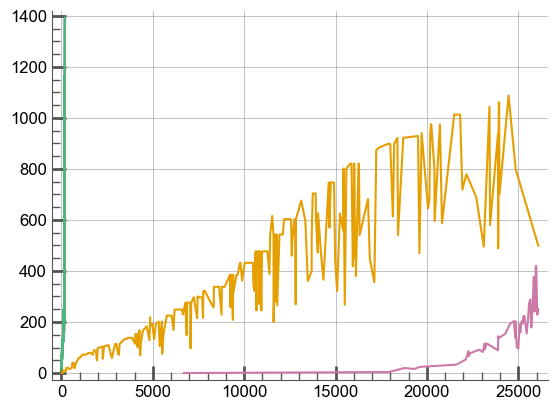

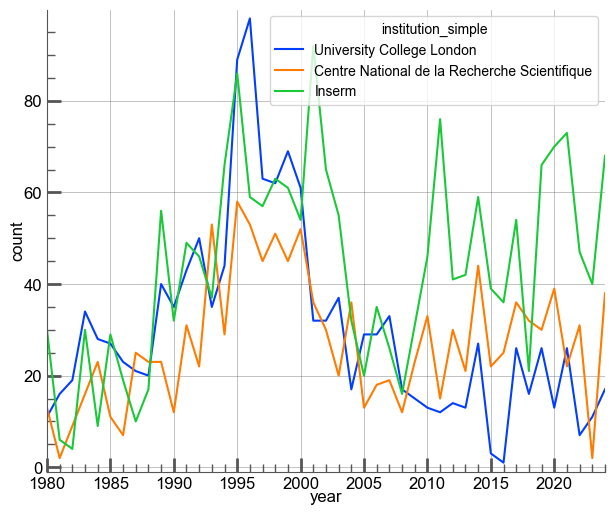

In [319]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.lineplot(data = group_institutionsyears_sum[group_institutionsyears_sum["institution_simple"].isin(top_institutions)], x = "year", y = "count", hue = "institution_simple", palette = "bright")
    plt.xlim(1980, 2024)
    plt.show()

#### Citations distribution and Pareto law

C:\Users\gabri\AppData\Local\Temp\ipykernel_30176\2875893597.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = group_institutions_sum.head(n=10), x = "cited_by_count", y = "institution_simple", orient = "h", palette = "viridis", legend = True)


<Figure size 640x480 with 0 Axes>

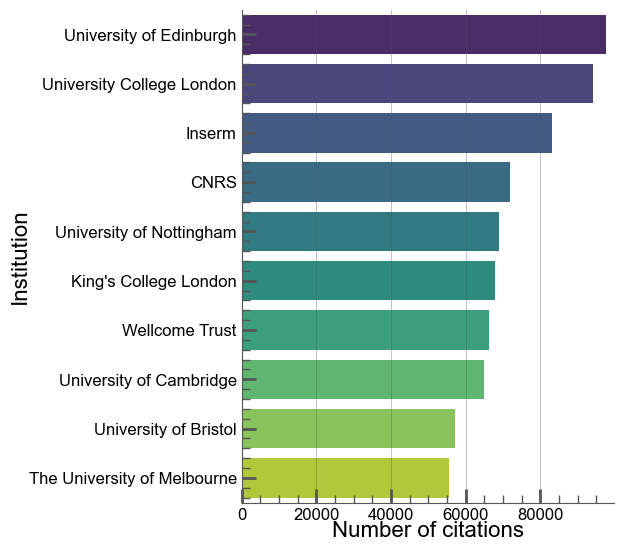

In [320]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(4.8,6.4))
    sns.barplot(data = group_institutions_sum.head(n=10), x = "cited_by_count", y = "institution_simple", orient = "h", palette = "viridis", legend = True)
    #plt.xticks(rotation = 90)
    plt.ylabel("Institution",fontsize=16)
    plt.xlabel("Number of citations", fontsize=16)
    plt.show()

In [321]:
group_institutions_sum

,institution_simple,institution,count,cited_by_count,mncs
6,University of Edinburgh,"['University of Edinburgh', 'https://openalex....",920,97714,2692.800265
1,University College London,"['University College London', 'https://openale...",1482,94145,2278.254014
0,Inserm,"['Inserm', 'https://openalex.org/I154526488']",2001,83027,2003.971106
2,CNRS,['Centre National de la Recherche Scientifique...,1217,71782,1563.287753
7,University of Nottingham,"['University of Nottingham', 'https://openalex...",912,69021,1614.900978
...,...,...,...,...,...
3578,Scuola Normale Superiore,"['Scuola Normale Superiore', 'https://openalex...",2,0,0.000000
4341,Universidade Federal de Alfenas,"['Universidade Federal de Alfenas', 'https://o...",1,0,0.000000
3452,Drug Discovery Laboratory (Norway),"['Drug Discovery Laboratory (Norway)', 'https:...",2,0,0.000000
2279,Qufu Normal University,"['Qufu Normal University', 'https://openalex.o...",6,0,0.000000


In [322]:
group_institutions_sum.set_index("institution_simple",inplace=True)
top_10_universities = group_institutions_sum.loc[["University of Edinburgh",
                       "University College London",
                       "University of Nottingham",
                       "King's College London",
                       "University of Cambridge",
                       "University of Bristol",
                       "The University of Melbourne",
                       "University of Glasgow",
                       "University of Aberdeen",
                       "University of Manchester"
                       ],:]

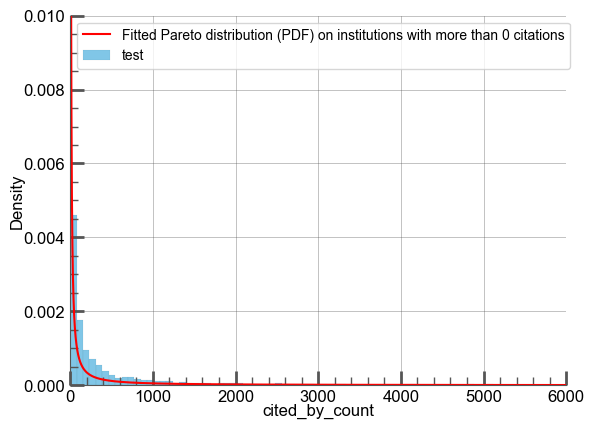

In [323]:
xmin = 0
institutions_pareto = group_institutions_sum["cited_by_count"][group_institutions_sum["cited_by_count"]>xmin]
b, loc, scale = st.pareto.fit(institutions_pareto, floc = 0) 
pareto_fitted = st.pareto(b, loc, scale)
D, p = st.kstest(institutions_pareto, pareto_fitted.cdf)
x = np.linspace(1, 6000, 10_000)
sns.lineplot(x = x, y = pareto_fitted.pdf(x), color = "red", label = f"Fitted Pareto distribution (PDF) on institutions with more than {xmin} citations")
sns.histplot(x = institutions_pareto, stat = "density", label = "test")
plt.ylim(0, 0.01)
plt.xlim(0, 6000)
plt.legend()
plt.show()

#### Mean citations per institution

In [324]:
test = group_institutions_sum.sort_values(by = "cited_by_count", ascending = False)
test[test["count"] > 100].head()

,institution,count,cited_by_count,mncs
institution_simple,,,,
University of Edinburgh,"['University of Edinburgh', 'https://openalex....",920,97714,2692.800265
University College London,"['University College London', 'https://openale...",1482,94145,2278.254014
Inserm,"['Inserm', 'https://openalex.org/I154526488']",2001,83027,2003.971106
CNRS,['Centre National de la Recherche Scientifique...,1217,71782,1563.287753
University of Nottingham,"['University of Nottingham', 'https://openalex...",912,69021,1614.900978


In [325]:
# mean of the citations instead of the sum
group_institutions_viz = group_institutions_sum.copy()
group_institutions_viz.loc[:, "cited_by_count"] = group_institutions_viz.loc[:, "cited_by_count"] / group_institutions_viz.loc[:, "count"]
group_institutions_viz["count_viz"] = group_institutions_viz["count"]
group_institutions_viz["cited_by_count_viz"] = group_institutions_viz["cited_by_count"]

# # studying only the countries with more than 5 articles published
# group_institutions_viz = (group_institutions_viz[group_institutions_viz["count"] > 10]).copy() # plus de 50 contributions sinon non prise en compte
# # log(x)
# group_institutions_viz["count_log"] = np.log(group_institutions_viz["count"])
# # centering y
# group_institutions_viz["cited_by_count_centered"] = group_institutions_viz["cited_by_count"] - group_institutions_viz["cited_by_count"].mean()
# rescale [-1, 1]
#group_institutions_viz["count_viz"] = -1 + 2 * (group_institutions_viz["count_log"] - group_institutions_viz["count_log"].min()) / (group_institutions_viz["count_log"].max() - group_institutions_viz["count_log"].min())
#group_institutions_viz["cited_by_count_viz"] = -1 + 2 * (group_institutions_viz["cited_by_count_centered"] - group_institutions_viz["cited_by_count_centered"].min()) / (group_institutions_viz["cited_by_count_centered"].max()  - group_institutions_viz["cited_by_count_centered"].min())

C:\Users\gabri\AppData\Local\Temp\ipykernel_30176\437499395.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[106.21086957  63.52564103  41.49275362 ...   0.           0.
   0.        ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  group_institutions_viz.loc[:, "cited_by_count"] = group_institutions_viz.loc[:, "cited_by_count"] / group_institutions_viz.loc[:, "count"]


In [326]:
group_institutions_viz.sort_values(by = "count", inplace = True, ascending = False)
group_institutions_viz.head()

group_institutions_viz.loc[1,"institution_simple"] = "UCL"
group_institutions_viz.loc[2,"institution_simple"] = "CNRS"

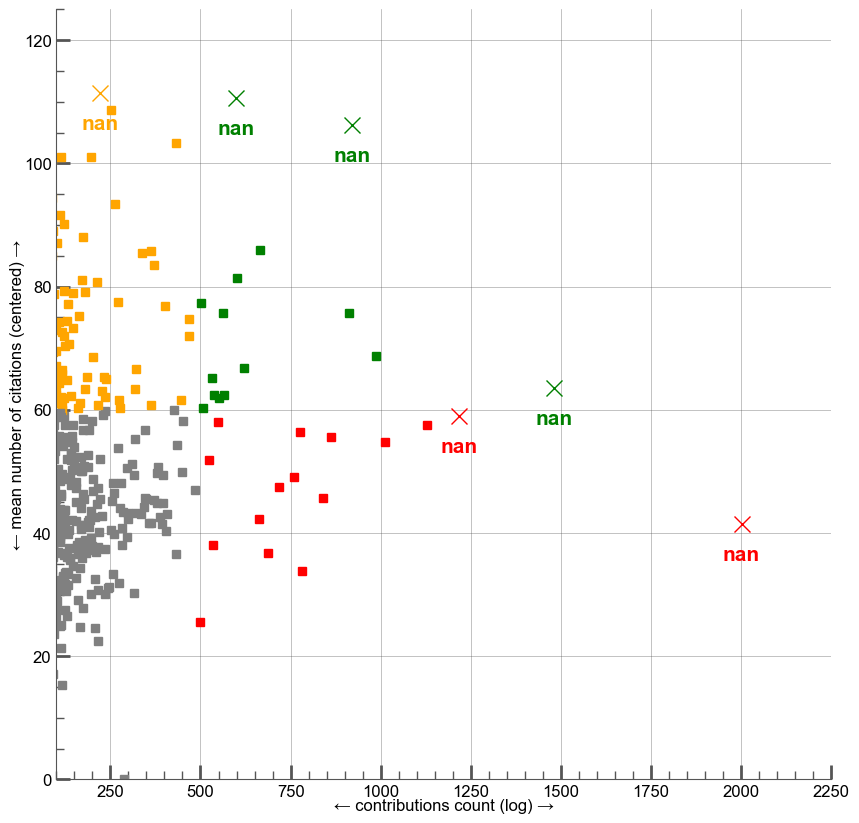

In [327]:
plt.figure(figsize = (10, 10))
for index, row in group_institutions_viz.iterrows():
    if row["cited_by_count_viz"] >= 60 and row["count_viz"] >= 500:
        color = "green"
    elif row["cited_by_count_viz"] >= 60 and row["count_viz"] < 500:
        color = "orange"
    elif row["cited_by_count_viz"] < 60 and row["count_viz"] >= 500:
        color = "red"
    else:
        color = "grey"
    #plt.text(row["count_viz"], row["cited_by_count_viz"], row["institution_simple"], ha = "center", va = "center", fontsize = 10, fontweight = "bold", color = color)
    if ((np.sqrt((row["count"]/(group_institutions_viz[group_institutions_viz["count"] > 100])["count"].max())**2 + (row["cited_by_count"]/(group_institutions_viz[group_institutions_viz["count"] > 100])["cited_by_count"].max())**2) > 1 or row["count"] > 1200) and row["count"] > 100 ): 
        plt.plot(row["count_viz"], row["cited_by_count_viz"], "x", markersize = 12, color = color)

        # the following if and elif are just here to avoid the superpositions 
        if row["institution_simple"] == "Ninewells Hospital":
            plt.text(row["count_viz"] , row["cited_by_count_viz"] + 5, row["institution_simple"], ha = "center", va = "center", fontsize = 15, fontweight = "bold", color = color)             
        else:
            plt.text(row["count_viz"], row["cited_by_count_viz"] - 5, row["institution_simple"], ha = "center", va = "center", fontsize = 15, fontweight = "bold", color = color)
    
    else:
        plt.plot(row["count_viz"], row["cited_by_count_viz"], "s", color = color)
    

plt.xlabel("← contributions count (log) →") # labelpad = décalage du label
plt.ylabel("← mean number of citations (centered) →")
plt.xlim(100, 2250)
plt.ylim(0, 125)
# # position of the two axes
# ax = plt.gca()
# ax.spines['left'].set_position('zero')   # axe Y à x=0
# ax.spines['bottom'].set_position('zero') # axe X à y=0
plt.show()

Only the institutions with more than 100 collaborations are considered

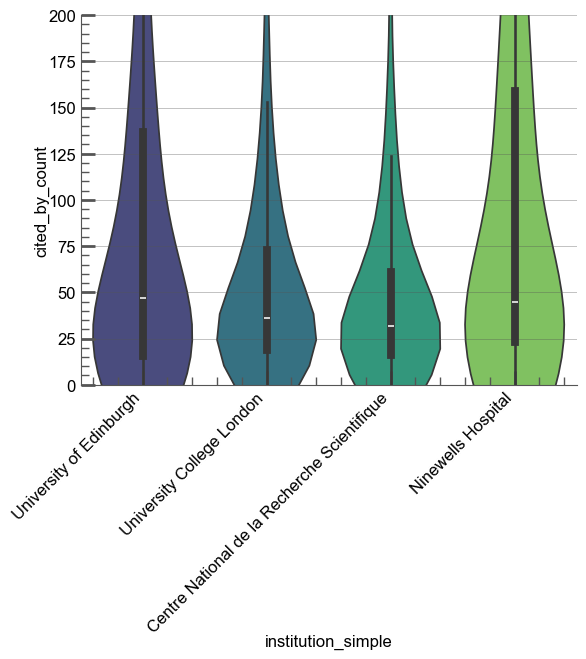

In [328]:
names_institutions_examples = ["University College London", "Centre National de la Recherche Scientifique", "University of Edinburgh", "Ninewells Hospital"]
institutions_examples = institutions[institutions["institution_simple"].isin(names_institutions_examples)]
institutions_examples.head()

# with aquarel.load_theme("scientific"):
sns.violinplot(x = "institution_simple", y = "cited_by_count", data = institutions_examples, hue = "institution_simple", palette = "viridis")
plt.ylim(0, 200)
plt.xticks(rotation=45, ha='right')
plt.show()

#### N citations | N institutions

In [329]:
test = works[["cited_by_count", "institutions_distinct_count"]].groupby(by = "institutions_distinct_count").count()
test

,cited_by_count
institutions_distinct_count,
0,3978
1,10742
2,6036
3,2776
4,1275
5,603
6,274
7,156
8,88


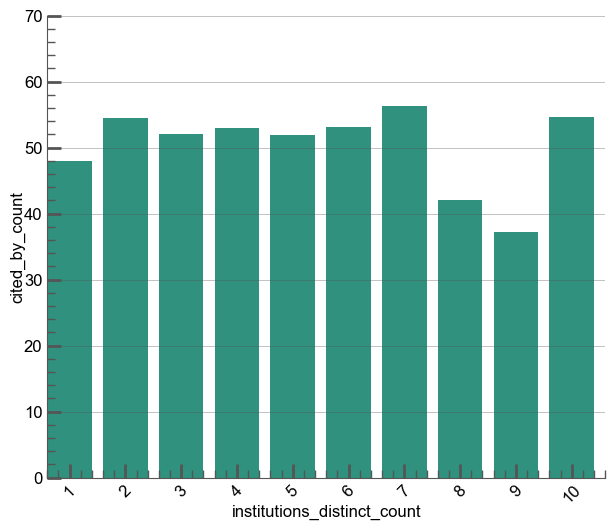

Mean authors count: 1.7305866135702253
Median authors count: 1.0


In [330]:

with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.barplot(data = group_Ninstitutions_mean, x = "institutions_distinct_count", y = "cited_by_count", color = sns.color_palette("viridis")[3])
    plt.xticks(rotation = 45)
    plt.xlim(0.6, 10.6)
    plt.ylim(0, 70)
    plt.show()

mean_value = works["institutions_distinct_count"].mean()
median_value = works["institutions_distinct_count"].median()
print(f"Mean authors count: {mean_value}")
print(f"Median authors count: {median_value}")

##### Citation rate

<Figure size 640x480 with 0 Axes>

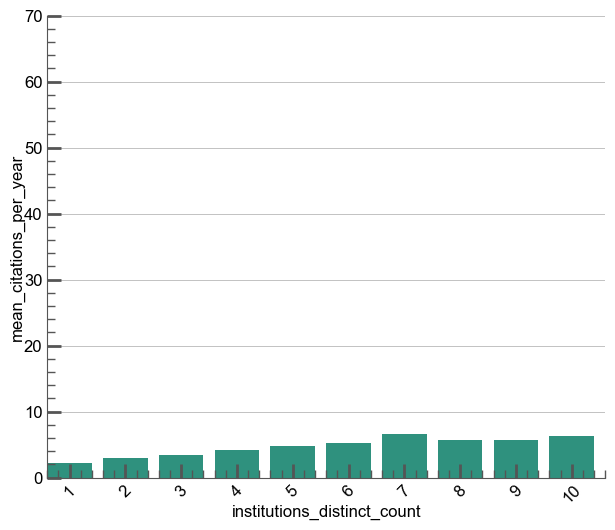

In [331]:

with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.barplot(data = group_Ninstitutions_mean, x = "institutions_distinct_count", y = "mean_citations_per_year", color = sns.color_palette("viridis")[3])
    plt.xticks(rotation = 45)
    plt.xlim(0.6, 10.6)
    plt.ylim(0, 70)
    plt.show()


##### MNCS 

<Figure size 640x480 with 0 Axes>

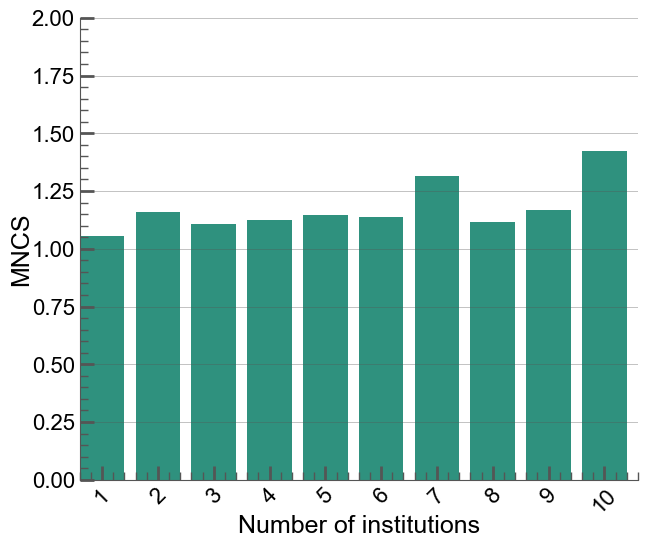

In [332]:

with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.barplot(data = group_Ninstitutions_mean, x = "institutions_distinct_count", y = "mncs", color = sns.color_palette("viridis")[3])
    plt.xticks(rotation = 45)
    plt.xlim(0.6, 10.6)
    plt.ylim(0, 2)
    plt.xlabel("Number of institutions", fontsize=18)
    plt.ylabel("MNCS", fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()


#### Study of big pharmas

In [333]:
funders = []
for index, article in works.iterrows():
    i = 1
    while pd.notna(article.get(f"institution_{i}")):
        funders.append({"institution" : article[f"institution_{i}"], "year" :  article["year"], "cited_by_count" : article["cited_by_count"]})
        i += 1
funders = pd.DataFrame(funders)
funders["compteur"] = 1

for index, row in funders.iterrows():
    ajout1 =  row["institution"].split(",", 1)[0]
    ajout1 = ajout1[2:-1]

    funders.loc[index, "institution_simple"] = ajout1 
funders.drop(columns = "institution", inplace = True)

In [334]:
funders.shape

(129673, 4)

In [335]:
big_pharma = ["Johnson & Johnson","Roche","Merck","Pfizer","AbbVie","AstraZeneca","Novartis","Bristol-Myers Squibb","Eli Lilly",
"Sanofi","Novo Nordisk","GlaxoSmithKline","Amgen","Takeda","Boehringer Ingelheim","Gilead Sciences","Bayer","Merck KGaA","Teva Pharmaceuticals","CSL", "BMS"] 
dataset_bigpharma =[]
for index, row in funders.iterrows():
    for j in big_pharma:
        if row["institution_simple"].startswith(j):
            row["institution_very_simple"] = row["institution_simple"].split("(", 1)[0].strip()
            if row["institution_very_simple"]  in ["Merck & Co", "Merck Serono", "Merck Canada Inc."]:
                row["institution_very_simple"] = "Merck"
            if row["institution_very_simple"] in ["Pfizer-University of Granada-Junta de Andalucía Centre for Genomics and Oncological Research"]:
                row["institution_very_simple"] = "Pfizer"
            if row["institution_very_simple"] in ["Novartis Institutes for BioMedical Research", "Novartis Foundation"]:
                row["institution_very_simple"] = "Novartis"
            if row["institution_very_simple"] in ["Roche Pharma AG"]:
                row["institution_very_simple"] = "Roche"
            dataset_bigpharma.append(row)
            break
dataset_bigpharma = pd.DataFrame(dataset_bigpharma)
dataset_bigpharma.drop(columns = "institution_simple", inplace = True)


4379 direct contributions

In [336]:
dataset_bigpharma.head()

,year,cited_by_count,compteur,institution_very_simple
13,1968,134,1,Roche
14,1968,134,1,Roche
96,1968,14,1,Pfizer
97,1968,14,1,Pfizer
103,1968,31,1,Novartis


In [337]:
group_bigpharma = (
    dataset_bigpharma
    .groupby(by = "institution_very_simple")
    .sum()
)
group_bigpharma.reset_index(inplace = True)
group_bigpharma.columns = ["institution", "year", "number of citations", "number of contributions"]

C:\Users\gabri\AppData\Local\Temp\ipykernel_30176\1786837494.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = group_bigpharma, x = "number of citations", y = "institution", orient = "h", palette = "viridis", legend = True)


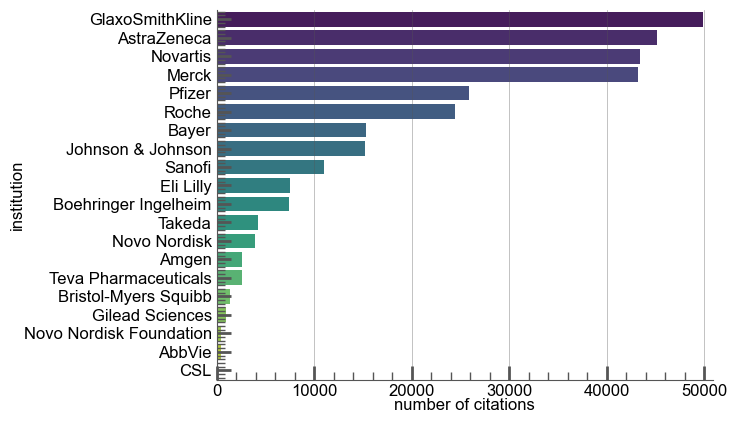

In [338]:
group_bigpharma.sort_values(by = "number of citations", inplace = True, ascending = False)
with aquarel.load_theme("scientific"):
    sns.barplot(data = group_bigpharma, x = "number of citations", y = "institution", orient = "h", palette = "viridis", legend = True)
    #plt.xticks(rotation = 90)
    plt.show()

#### Big pharma versus universities

In [339]:
group_bigpharma.drop(columns="year",inplace=True)

In [340]:
group_institutions_sum.reset_index(inplace=True)

In [341]:
top_10_universities = group_institutions_sum.loc[group_institutions_sum["institution_simple"].isin(["University of Edinburgh",
                       "University College London",
                       "University of Nottingham",
                       "King's College London",
                       "University of Cambridge",
                       "University of Bristol",
                       "The University of Melbourne",
                       "University of Glasgow",
                       "University of Aberdeen",
                       "University of Manchester"
                       ]),:]

In [342]:
top_10_universities.drop(columns=["mncs"], inplace=True) #"institution", "index",

C:\Users\gabri\AppData\Local\Temp\ipykernel_30176\200370390.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_10_universities.drop(columns=["mncs"], inplace=True) #"institution", "index",


In [344]:
top_10_universities

,institution_simple,institution,count,cited_by_count
0,University of Edinburgh,"['University of Edinburgh', 'https://openalex....",920,97714
1,University College London,"['University College London', 'https://openale...",1482,94145
4,University of Nottingham,"['University of Nottingham', 'https://openalex...",912,69021
5,King's College London,"[""King's College London"", 'https://openalex.or...",987,67843
7,University of Cambridge,"['University of Cambridge', 'https://openalex....",1128,64831
8,University of Bristol,"['University of Bristol', 'https://openalex.or...",666,57237
9,The University of Melbourne,"['The University of Melbourne', 'https://opena...",1012,55476
11,University of Glasgow,"['University of Glasgow', 'https://openalex.or...",862,47917
12,University of Aberdeen,"['University of Aberdeen', 'https://openalex.o...",433,44714
13,University of Manchester,"['University of Manchester', 'https://openalex...",777,43777


In [345]:
top_10_universities = top_10_universities.drop(columns="institution")
top_10_universities.columns = ["institution", "number of contributions", "number of citations"]

In [346]:
impact_universities = top_10_universities["number of citations"].sum()/top_10_universities["number of contributions"].sum()
impact_bigpharma = group_bigpharma["number of citations"].sum()/group_bigpharma["number of contributions"].sum()

In [ ]:
print(impact_universities)

69.83972543037699


In [ ]:
print(impact_bigpharma)

69.61357404021938


In [ ]:
top_10_universities

,institution,number of contributions,number of citations
0,University of Edinburgh,920,97350
1,University College London,1482,94018
4,University of Nottingham,912,68790
5,King's College London,987,67745
7,University of Cambridge,1127,64477
8,University of Bristol,666,57075
9,The University of Melbourne,1012,55362
11,University of Glasgow,862,47781
12,University of Aberdeen,433,44686
13,University of Manchester,777,43705


In [347]:
top_10_universities["kind"] = "University"

In [176]:
group_bigpharma

,institution,number of citations,number of contributions
9,GlaxoSmithKline,49748,625
2,AstraZeneca,45053,592
12,Novartis,43339,584
11,Merck,43158,589
15,Pfizer,25868,412
16,Roche,24418,409
3,Bayer,15280,157
10,Johnson & Johnson,15162,174
17,Sanofi,10954,225
7,Eli Lilly,7508,197


In [348]:
group_bigpharma["kind"] = "Company"


In [349]:
top_20 = pd.concat([top_10_universities, group_bigpharma])
top_20.sort_values(by="number of citations", inplace=True, ascending=False)

In [ ]:
top_20

,institution,number of contributions,number of citations,kind
0,University of Edinburgh,920,97350,University
1,University College London,1482,94018,University
4,University of Nottingham,912,68790,University
5,King's College London,987,67745,University
7,University of Cambridge,1127,64477,University
8,University of Bristol,666,57075,University
9,The University of Melbourne,1012,55362,University
9,GlaxoSmithKline,625,49748,Company
11,University of Glasgow,862,47781,University
2,AstraZeneca,592,45053,Company


<Figure size 640x480 with 0 Axes>

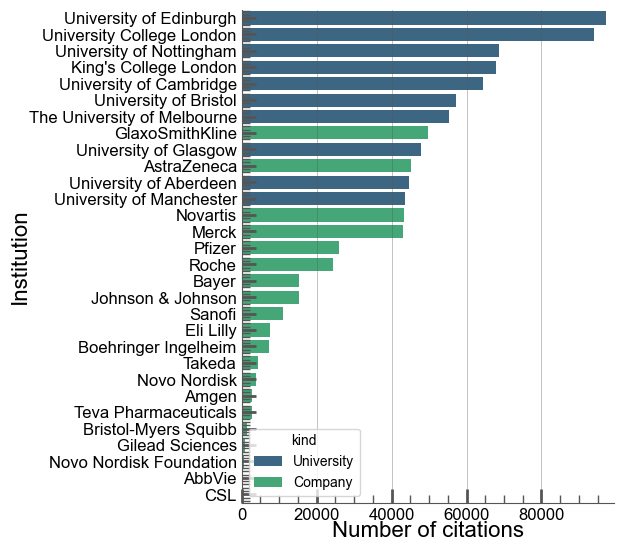

In [ ]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(4.8,6.4))
    sns.barplot(data = top_20, x = "number of citations", y = "institution", orient = "h", hue="kind", palette = "viridis", legend = True)
    plt.xlabel("Number of citations", fontsize = 16)
    plt.ylabel("Institution", fontsize=16)
    plt.show()

## Heatmap and radar map 🌐

### Heatmap

In [350]:
works

,title,year,cited_by_count,countries_distinct_count,institutions_distinct_count,citation_normalized_percentile,primary_topic,keywords,concepts,referenced_works_count,...,review,sum_past_contributions_authors,sum_past_citations_authors,countries_mean_mncs,countries_mean_number_works,institutions_mean_mncs,institutions_mean_number_works,sum_past_mncs_authors,mean_past_mncs_authors,mean_past_contributions_authors
0,"The Chemo-therapeutie Aetion of Streptomycin, ...",1948,7,0,0,"{'value': 0.776744, 'is_in_top_1_percent': Fal...","('Veterinary medicine and infectious diseases',)",[],"[{'id': 'https://openalex.org/C2775843808', 'w...",0,...,False,0.0,0.0,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000
1,"The Constitution of Pbotostilbamldlne, the Irr...",1948,0,0,0,"{'value': 0.0, 'is_in_top_1_percent': False, '...","('Lanthanide and Transition Metal Complexes',)",[],"[{'id': 'https://openalex.org/C2776154427', 'w...",0,...,False,0.0,0.0,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000
2,Antryeide A aew trypanocidal drug.,1950,19,0,0,"{'value': 0.937652, 'is_in_top_1_percent': Fal...",('Phytochemistry and biological activities of ...,[{'id': 'https://openalex.org/keywords/trypano...,"[{'id': 'https://openalex.org/C2776684476', 'w...",0,...,False,0.0,0.0,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000
3,Procaine perfused into cerebral ventricles and...,1968,6,1,1,"{'value': 0.770715, 'is_in_top_1_percent': Fal...",('Traumatic Brain Injury and Neurovascular Dis...,[{'id': 'https://openalex.org/keywords/subarac...,"[{'id': 'https://openalex.org/C42219234', 'wik...",9,...,False,0.0,0.0,NaN,0.000000,NaN,0.000000,0.000000,NaN,0.000000
4,The cholinergic properties of some amino‐acid ...,1968,25,1,1,"{'value': 0.72933, 'is_in_top_1_percent': Fals...","('Nicotinic Acetylcholine Receptors Study',)",[],"[{'id': 'https://openalex.org/C188987157', 'wi...",14,...,False,0.0,0.0,NaN,0.000000,NaN,0.000000,0.000000,NaN,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26111,"The cytoplasmic sensor, the AIM2 inflammasome:...",2024,3,2,4,"{'value': 0.999982, 'is_in_top_1_percent': Tru...","('Inflammasome and immune disorders',)","[{'id': 'https://openalex.org/keywords/aim2', ...","[{'id': 'https://openalex.org/C2777209026', 'w...",191,...,True,10.0,349.0,1.115402,6570.125000,NaN,111.500000,9.387139,0.938714,1.250000
26112,Innovative pharmacotherapy for hepatic metabol...,2024,3,1,1,"{'value': 0.730161, 'is_in_top_1_percent': Fal...","('Liver Disease Diagnosis and Treatment',)",[{'id': 'https://openalex.org/keywords/liver-c...,"[{'id': 'https://openalex.org/C2778772119', 'w...",134,...,False,13.0,512.0,1.105375,6840.000000,1.089818,276.000000,9.825888,0.755838,2.166667
26113,Structural bases for stoichiometry‐selective c...,2024,3,2,9,"{'value': 0.999982, 'is_in_top_1_percent': Tru...","('Nicotinic Acetylcholine Receptors Study',)",[{'id': 'https://openalex.org/keywords/n-type-...,"[{'id': 'https://openalex.org/C519063684', 'wi...",61,...,False,5.0,104.0,1.406428,16514.333333,NaN,198.666667,2.369164,0.473833,1.000000
26114,Insight into structural properties of viral G ...,2024,2,3,4,"{'value': 0.5, 'is_in_top_1_percent': False, '...","('Influenza Virus Research Studies',)",[{'id': 'https://openalex.org/keywords/viral-i...,"[{'id': 'https://openalex.org/C170493617', 'wi...",213,...,True,19.0,550.0,1.077325,2295.571429,1.516238,190.500000,26.469333,1.393123,2.714286


In [351]:
data_quantitative = works[["year", "cited_by_count", "countries_distinct_count", "institutions_distinct_count", "referenced_works_count", "authors_count", "sum_past_contributions_authors", "mncs", "age", "mean_citations_per_year"]]
data_quantitative.drop(columns = "age", inplace = True)

C:\Users\gabri\AppData\Local\Temp\ipykernel_30176\2196955766.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_quantitative.drop(columns = "age", inplace = True)


In [352]:
data_quantitative.head()

,year,cited_by_count,countries_distinct_count,institutions_distinct_count,referenced_works_count,authors_count,sum_past_contributions_authors,mncs,mean_citations_per_year
0,1948,7,0,0,0,2.0,0.0,2.000000,0.090909
1,1948,0,0,0,0,1.0,0.0,0.000000,0.000000
2,1950,19,0,0,0,2.0,0.0,1.000000,0.253333
3,1968,6,1,1,9,2.0,0.0,0.096635,0.105263
4,1968,25,1,1,14,4.0,0.0,0.402644,0.438596


In [353]:
data_quantitative.columns = ["Publication year", "Number of citations", "Number of countries", "Number of institutions", "Number of referenced works", "Number of authors", "Number of past contributions", "MNCS", "Mean number of citations per year"]
data_corr = data_quantitative.corr()
data_corr.head()

,Publication year,Number of citations,Number of countries,Number of institutions,Number of referenced works,Number of authors,Number of past contributions,MNCS,Mean number of citations per year
Publication year,1.000000,0.035790,0.158054,0.292889,0.326788,0.373310,0.131150,4.412237e-15,0.261393
Number of citations,0.035790,1.000000,0.135952,0.115252,0.223582,0.092061,0.124334,9.373305e-01,0.791754
Number of countries,0.158054,0.135952,1.000000,0.720378,0.181597,0.545446,0.351532,1.918030e-01,0.254482
Number of institutions,0.292889,0.115252,0.720378,1.000000,0.200008,0.625456,0.426761,1.983772e-01,0.339434
Number of referenced works,0.326788,0.223582,0.181597,0.200008,1.000000,0.156012,0.027703,1.965756e-01,0.315593


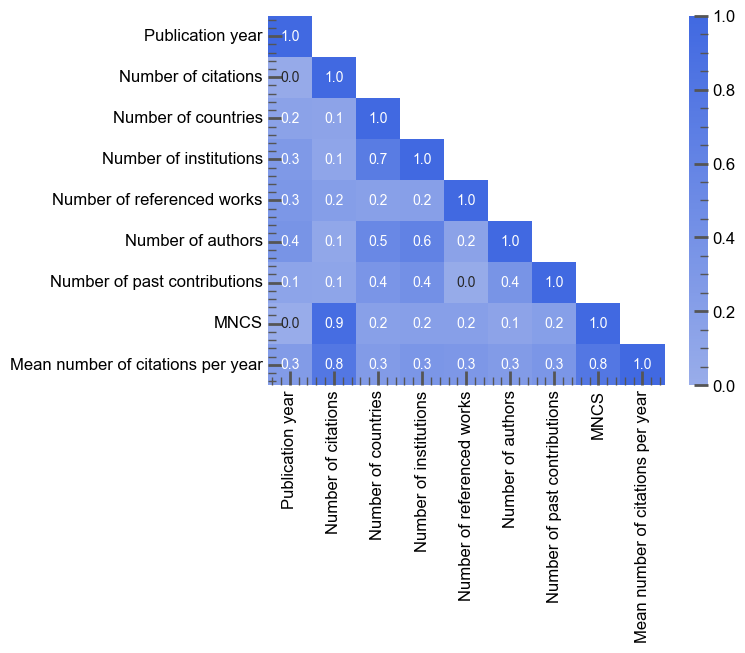

In [354]:
mask = np.triu(np.ones_like(data_corr, dtype=bool), k = 1)
cmap = sns.light_palette("royalblue", as_cmap=True)
sns.heatmap(data_corr, cmap = cmap, mask = mask, annot = True, fmt = ".1f", center = 0, vmin = 0, vmax = 1) #RdBu_r Spectral vlag
plt.grid(False)
plt.show()


### Radar map

In [186]:
data_quantitative.sort_values(by = "MNCS", inplace = True, ascending = False)
stars = data_quantitative.loc[:2629,:].mean()
common = data_quantitative.loc[2629:,:].mean()  
summary = pd.concat([stars, common], axis = 1)
summary.reset_index(inplace = True)
summary.columns = ["feature", "top 10% works (MNCS)", "other works"]



C:\Users\gabri\AppData\Local\Temp\ipykernel_25280\2061551573.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_quantitative.sort_values(by = "MNCS", inplace = True, ascending = False)


In [187]:
summary

,feature,top 10% works (MNCS),other works
0,Publication year,1998.299266,1998.645192
1,Number of citations,128.541034,21.292308
2,Number of countries,1.349428,1.101303
3,Number of institutions,2.092646,1.625691
4,Number of referenced works,55.175567,35.753456
5,Number of authors,4.858898,4.129937
6,Number of past contributions,7.476369,14.152251
7,MNCS,2.848084,0.465277
8,Mean number of citations per year,7.194829,1.198150


In [188]:
summary = summary[summary["feature"].isin(["Publication year", "Number of countries", "Number of institutions", "Number of referenced works", "Number of authors", "Number of past contributions"])]

In [189]:
for index, row in summary.iterrows():
    summary.loc[index,"top 10% works (MNCS)"] =  (summary.loc[index,"top 10% works (MNCS)"] - (data_quantitative.loc[:, row["feature"]]).quantile(0.1))/ ((data_quantitative.loc[:, row["feature"]]).quantile(0.9) - (data_quantitative.loc[:, row["feature"]]).quantile(0.1))
    summary.loc[index,"other works"] =  (summary.loc[index,"other works"] - (data_quantitative.loc[:, row["feature"]]).quantile(0.1))/ ((data_quantitative.loc[:, row["feature"]]).quantile(0.9) - (data_quantitative.loc[:, row["feature"]]).quantile(0.1))

In [190]:
import plotly.express as px
# Transformation pour Plotly (format long)
summary_melt = summary.melt(id_vars='feature', var_name='Groupe', value_name='Valeur')
# Radar chart
fig = px.line_polar(
    summary_melt,
    r='Valeur',
    theta='feature',
    color='Groupe',
    line_close=True,
    markers=True
)

fig.update_traces(fill='toself')
fig.update_layout(title='Means of aggregated metadata (MinMax rescaled)')
fig.update_layout(
    polar=dict(
        radialaxis=dict(
            visible=True,
            range=[0, 1]  # Échelle de 0 à 1 par exemple
        )
    )
)
fig.update_layout(
    width=1000,  # Largeur
    height=600,  # Hauteur → même que la largeur pour un carré
)
fig.show()

## Counts by year 📆

In [355]:
means_yearly_citations = [works[f"cited_by_count_{i}"].mean() for i in range(2012, 2025)]

new_studies = works[works["year"] == 2012]
means_2012_yearly_citations = [new_studies[f"cited_by_count_{i}"].mean() for i in range(2012, 2025)]

years = range(13)
years_2012 = range(2012, 2025)

list_means_yearly_citations = []
for year in years:
    new_studies = works[works["year"] == 2012 + year]
    list_means_yearly_citations.append([new_studies[f"cited_by_count_{i}"].mean() for i in range(2012 + year, 2025)])

### Life of new studies VS part of life of older studies

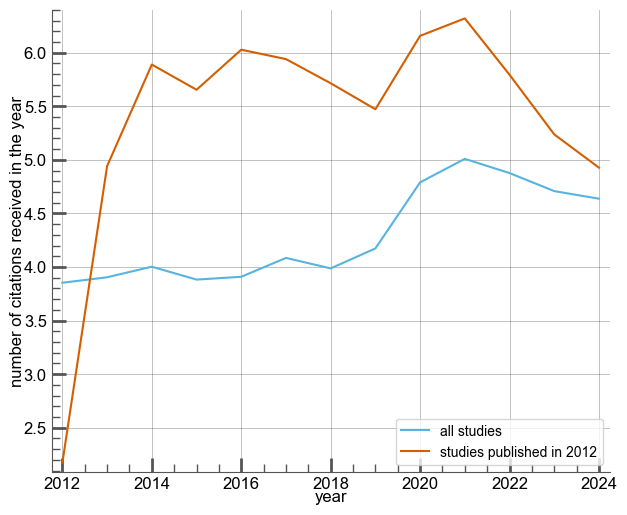

In [356]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.lineplot(x = years_2012, y =  means_yearly_citations, label = "all studies")
    sns.lineplot(x = years_2012, y =  means_2012_yearly_citations, label = "studies published in 2012")
    plt.xlabel("year")
    plt.ylabel("number of citations received in the year")
    plt.legend()
    plt.show()

The number of citations is highest in the first year after publication of the article, which means that if there are more and more new articles, this will skew the "all studies" graph above.

### Number of studies per year and part of life of studies

In [193]:
number_studies_per_year = (
    works[["title", 'year']]
    .groupby(by = "year")
    .count()
    .sort_values(by = "year", ascending = False)
)
number_studies_per_year = number_studies_per_year.head(n = 13)
number_studies_per_year.sort_values(by = "year", ascending = True, inplace = True)

In [194]:
means_yearly_citations_reduced = pd.Series(means_yearly_citations)
means_yearly_citations_reduced = (means_yearly_citations_reduced - means_yearly_citations_reduced.min())/(means_yearly_citations_reduced.max() - means_yearly_citations_reduced.min())
number_studies_per_year = number_studies_per_year["title"]
number_studies_per_year = (number_studies_per_year - number_studies_per_year.min())/(number_studies_per_year.max() - number_studies_per_year.min())

<Figure size 640x480 with 0 Axes>

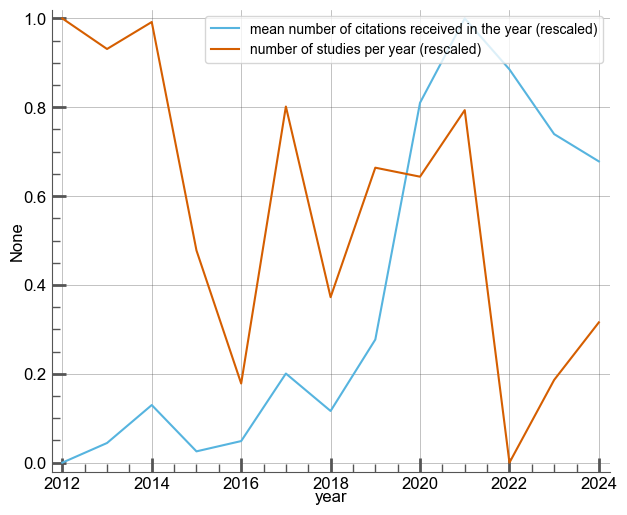

In [195]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.lineplot(x = years_2012, y =  means_yearly_citations_reduced, label = "mean number of citations received in the year (rescaled)")
    sns.lineplot(x = years_2012, y = number_studies_per_year, label = "number of studies per year (rescaled)")
    plt.xlabel("year")
    plt.legend()
    plt.show()

We can see that the number of studies is tending to fall, invalidating the hypothesis of an advantageous bias.

### Begin of life of new studies according to the publication year

Studies published in 2021 and earlier seem to have reached a peak.

So of course we're blind to the future, but as we're looking at an average, it's unlikely that the average as a whole will rise again (although perhaps some studies will continue to rise).

<Figure size 640x480 with 0 Axes>

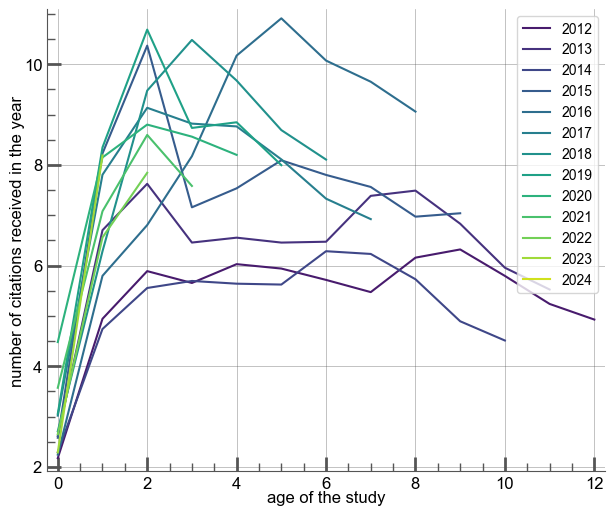

In [405]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    for i in range(13):
        y = list_means_yearly_citations[i]
        sns.lineplot(x = years[:len(y)], y = y, label = f"{2012 + i}", color = sns.set_palette("viridis", n_colors = 13))
    plt.xlabel("age of the study")
    plt.ylabel("number of citations received in the year")
    plt.legend()
    plt.show()

<Figure size 640x480 with 0 Axes>

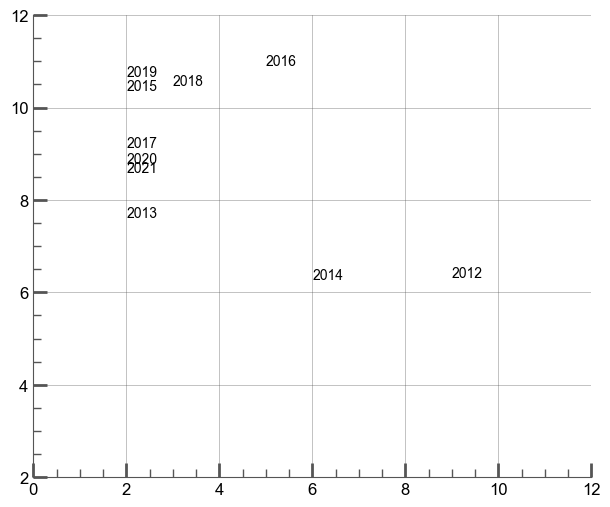

In [406]:
plt.figure(figsize=(7.2, 6))
for i in range(10):
    liste = pd.Series(list_means_yearly_citations[i])
    x = liste.argmax()
    y = liste.max()
    plt.text(x = x, y = y, s = f"{2012 + i}", fontweight = 50)
plt.xlim(0,12)
plt.ylim(2,12)
plt.show()

### Life of stars versus life of average publications

In [196]:
new_studies = works[works["year"] == 2012]

superstars = top 1% (5)
star = top 10% (51)

In [197]:
top_studies = new_studies.sort_values(by = "cited_by_count", ascending = False, inplace = False)
superstars = top_studies.iloc[0:5,:]
stars = top_studies.iloc[5:51,:]
usual = top_studies.iloc[51:, :]

In [198]:
superstars_2012_yearly_citations = pd.Series([superstars[f"cited_by_count_{i}"].mean() for i in range(2012, 2025)])
stars_2012_yearly_citations = pd.Series([stars[f"cited_by_count_{i}"].mean() for i in range(2012, 2025)])
usual_2012_yearly_citations = pd.Series([usual[f"cited_by_count_{i}"].mean() for i in range(2012, 2025)])

In [199]:
superstars_2012_yearly_citations = (superstars_2012_yearly_citations - superstars_2012_yearly_citations.min())/(superstars_2012_yearly_citations.max() - superstars_2012_yearly_citations.min())
stars_2012_yearly_citations = (stars_2012_yearly_citations - stars_2012_yearly_citations.min())/(stars_2012_yearly_citations.max() - stars_2012_yearly_citations.min())
usual_2012_yearly_citations = (usual_2012_yearly_citations - usual_2012_yearly_citations.min()) / (usual_2012_yearly_citations.max() - usual_2012_yearly_citations.min())

<Figure size 640x480 with 0 Axes>

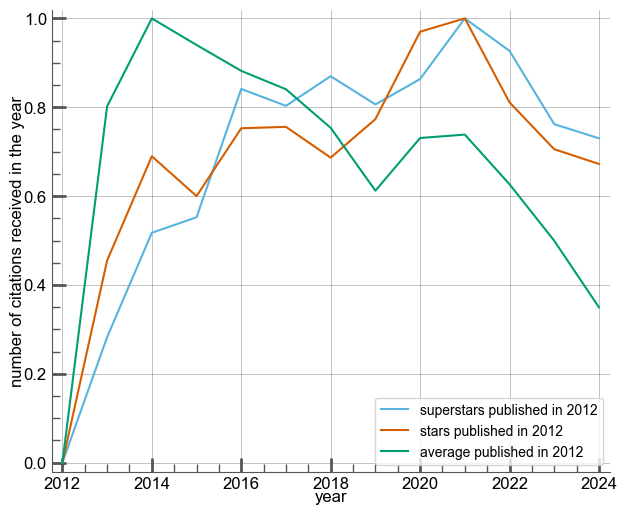

In [200]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.2, 6))
    sns.lineplot(x = years_2012, y =  superstars_2012_yearly_citations, label = "superstars published in 2012")
    sns.lineplot(x = years_2012, y =  stars_2012_yearly_citations, label = "stars published in 2012")
    sns.lineplot(x = years_2012, y =  usual_2012_yearly_citations, label = "average published in 2012")
    plt.xlabel("year")
    plt.ylabel("number of citations received in the year")
    plt.legend()
    plt.show()

### Impact of the first year on the life

Over the 2012-2024 period

In [201]:
new_studies = works[works["year"].isin(range(2012, 2013))]
for index, row in new_studies.iterrows():
    new_studies.loc[index, "cited_by_count_first_year"] = row[f"cited_by_count_{row["year"]}"]

C:\Users\gabri\AppData\Local\Temp\ipykernel_25280\1736045038.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [202]:
new_studies["is_in_top_global"] = (new_studies["cited_by_count"] >= new_studies["cited_by_count"].quantile(0.9))
new_studies["is_in_top_departure"] = (new_studies["cited_by_count_first_year"] >= new_studies["cited_by_count_first_year"].quantile(0.9))

C:\Users\gabri\AppData\Local\Temp\ipykernel_25280\4131532551.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gabri\AppData\Local\Temp\ipykernel_25280\4131532551.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [203]:
(new_studies["cited_by_count_first_year"] > new_studies["cited_by_count_first_year"].quantile(0.9)).sum()
(new_studies["cited_by_count"] > new_studies["cited_by_count"].quantile(0.9)).count()

np.int64(513)

In [204]:
impact_summary = (
    new_studies[["is_in_top_global", "is_in_top_departure", "title"]]
    .groupby(by = ["is_in_top_global", "is_in_top_departure"])
    .count()
)

In [205]:
impact_summary

title
is_in_top_global is_in_top_departure       
False            False                  416
                 True                    20
True             False                   38
                 True                    14

2021 publications are at a disadvantage compared with 2012 publications in the global top 10



It is normal that the top 10% departure does not contain the same number of individuals as the overall top 10%. Let's imagine that in one column, all the values are exactly at the threshold, in which case all the values are within the 10%!

A quantile at x% does not guarantee that exactly x% is to the left and 100-x% to the right of its boundary, quite simply because some values may be on the boundary! Knowing the top 10% is therefore a little harder to obtain than knowing the 90% quantile.

## Topics and keywords 🎭

### Topics from OpenAlex (old)

#### Data preparation ⚒️

In [357]:
for index, row in works.iterrows():
    if works.loc[index, "primary_topic"] != None and pd.notna(works.loc[index, "primary_topic"]) :
        #print("y", end = " ")
        works.loc[index, "primary_topic"] = (row["primary_topic"]).split("'", 2)[1]
        works.loc[index, "primary_subfield"] = (row["primary_subfield"]).split("'", 2)[1]
        works.loc[index, "primary_field"] = (row["primary_field"]).split("'", 2)[1]
        works.loc[index, "primary_domain"] = (row["primary_domain"]).split("'", 2)[1]

In [358]:
works.head()

,title,year,cited_by_count,countries_distinct_count,institutions_distinct_count,citation_normalized_percentile,primary_topic,keywords,concepts,referenced_works_count,...,review,sum_past_contributions_authors,sum_past_citations_authors,countries_mean_mncs,countries_mean_number_works,institutions_mean_mncs,institutions_mean_number_works,sum_past_mncs_authors,mean_past_mncs_authors,mean_past_contributions_authors
0,"The Chemo-therapeutie Aetion of Streptomycin, ...",1948,7,0,0,"{'value': 0.776744, 'is_in_top_1_percent': Fal...",Veterinary medicine and infectious diseases,[],"[{'id': 'https://openalex.org/C2775843808', 'w...",0,...,False,0.0,0.0,NaN,NaN,NaN,NaN,0.0,NaN,0.0
1,"The Constitution of Pbotostilbamldlne, the Irr...",1948,0,0,0,"{'value': 0.0, 'is_in_top_1_percent': False, '...",Lanthanide and Transition Metal Complexes,[],"[{'id': 'https://openalex.org/C2776154427', 'w...",0,...,False,0.0,0.0,NaN,NaN,NaN,NaN,0.0,NaN,0.0
2,Antryeide A aew trypanocidal drug.,1950,19,0,0,"{'value': 0.937652, 'is_in_top_1_percent': Fal...",Phytochemistry and biological activities of Fi...,[{'id': 'https://openalex.org/keywords/trypano...,"[{'id': 'https://openalex.org/C2776684476', 'w...",0,...,False,0.0,0.0,NaN,NaN,NaN,NaN,0.0,NaN,0.0
3,Procaine perfused into cerebral ventricles and...,1968,6,1,1,"{'value': 0.770715, 'is_in_top_1_percent': Fal...",Traumatic Brain Injury and Neurovascular Distu...,[{'id': 'https://openalex.org/keywords/subarac...,"[{'id': 'https://openalex.org/C42219234', 'wik...",9,...,False,0.0,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0
4,The cholinergic properties of some amino‐acid ...,1968,25,1,1,"{'value': 0.72933, 'is_in_top_1_percent': Fals...",Nicotinic Acetylcholine Receptors Study,[],"[{'id': 'https://openalex.org/C188987157', 'wi...",14,...,False,0.0,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0


#### Covid

<Figure size 640x480 with 0 Axes>

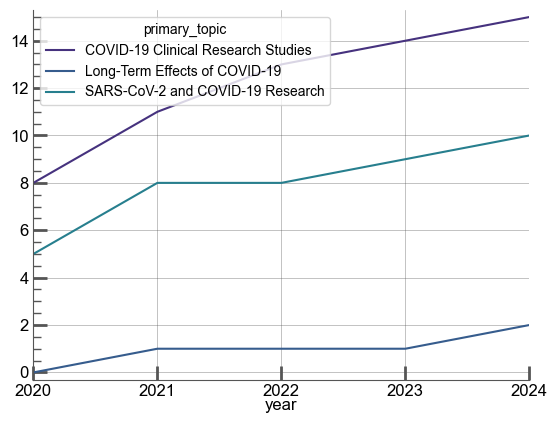

In [515]:
covid = (works[["primary_topic", "year", "title"]]).groupby(by = ["primary_topic", "year"]).count().reset_index()
covid  = covid[covid["primary_topic"].isin([
    "COVID-19 Clinical Research Studies", 
    "SARS-CoV-2 and COVID-19 Research",
    "Long-Term Effects of COVID-19"
    ])
    ]

topics_pivot = covid.pivot(index = "year", columns = "primary_topic", values = "title")
topics_pivot = topics_pivot.fillna(0)
topics_pivot = topics_pivot.cumsum(skipna = True)
topics_pivot = topics_pivot.sort_index()
topics_pivot.index = pd.to_datetime(topics_pivot.index, format ='%Y')
topics_pivot.plot()
plt.show()

#### Topics

In [516]:
group_topics = ((works)[works["year"]>2014][["primary_topic", "title"]]).groupby(by = "primary_topic").count()

In [517]:
group_topics.sort_values(by = "title", inplace = True, ascending = False)

C:\Users\gabri\AppData\Local\Temp\ipykernel_25280\3708741420.py:4: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



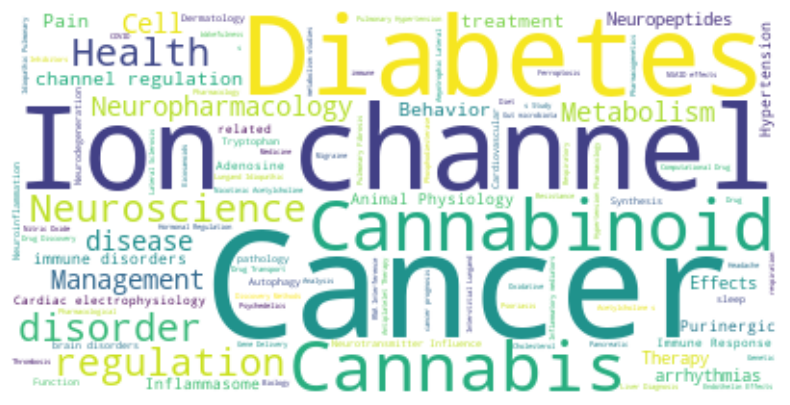

In [518]:
works_recent = works[works["year"]>2020]

# Data Cleaning and formatting
primary_topics_merged = ' '.join((works_recent[works["primary_topic"].notna()])["primary_topic"])
primary_topics_merged = primary_topics_merged.replace("Research", "")
primary_topics_merged = primary_topics_merged.replace("Treatment", "")
primary_topics_merged = primary_topics_merged.replace("Signaling", "")
primary_topics_merged = primary_topics_merged.replace("Disease", "")
primary_topics_merged = primary_topics_merged.replace("Mechanisms", "")
primary_topics_merged = primary_topics_merged.replace("research", "")
primary_topics_merged = primary_topics_merged.replace(" s ", "")
primary_topics_merged = primary_topics_merged.replace("Receptor", "")
primary_topics_merged = primary_topics_merged.replace("function", "")
primary_topics_merged = primary_topics_merged.replace("Studies", "")

wordcloud = wc.WordCloud(background_color= "white").generate(primary_topics_merged)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

#### Topics BCR cumulative

In [212]:
group_topics_bis = (works[["primary_topic", "year", "title"]]).groupby(by = ["primary_topic", "year"]).count().reset_index()
topics_pivot = group_topics_bis.pivot(index = "year", columns = "primary_topic", values = "title")
topics_pivot = topics_pivot.cumsum(skipna = True)
topics_pivot = topics_pivot.sort_index()
topics_pivot = topics_pivot.fillna(0)
topics_pivot.index = pd.to_datetime(topics_pivot.index, format ='%Y')

In [184]:
bcr.bar_chart_race(
    df=topics_pivot,
    filename='bar_chart_race.mp4',  # ou None pour afficher dans un notebook
    orientation='h',
    sort='desc',
    n_bars=5,
    fixed_order=False,
    fixed_max=True,
    steps_per_period=10,
    period_length=1000,
    period_fmt='%Y',
    title='Evolution of the top topics along the years',
    bar_size=.95,
    interpolate_period=True
)

Locator attempting to generate 1882 ticks ([-7.6000000000000005, ..., 368.6]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 1882 ticks ([-7.6000000000000005, ..., 368.6]), which exceeds Locator.MAXTICKS (1000).
c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 127 () missing from font(s) Arial.

c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 128 (\x80) missing from font(s) Arial.

c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 129 (\x81) missing from font(s) Arial.

c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 130 (\x82) missing from font(s) Arial.

c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_c

#### Topics BCR 5y-smoothing

In [ ]:
smoothing = 5
group_topics_bis = (works[["primary_topic", "year", "title"]]).groupby(by = ["primary_topic", "year"]).count().reset_index()
topics_pivot = group_topics_bis.pivot(index = "year", columns = "primary_topic", values = "title")
topics_pivot = topics_pivot.fillna(0)
topics_pivot.drop(index=[1948, 1950], inplace=True)
topics_pivot_smooth = topics_pivot.copy()
for index, row in topics_pivot.iterrows():
    if index<1973:
        debut = 1968
    else:
        debut = index - smoothing
    topics_pivot_smooth.loc[index,:] = sum([topics_pivot.loc[i,:] for i in range(debut, index+1)])
    
topics_pivot_smooth = topics_pivot.sort_index()
topics_pivot_smooth.index = pd.to_datetime(topics_pivot.index, format ='%Y')

In [99]:
topics_pivot_smooth

primary_topic,3D Printing in Biomedical Research,AI in cancer detection,ATP Synthase and ATPases Research,Abdominal vascular conditions and treatments,Academic Publishing and Open Access,Academic Writing and Publishing,Academic integrity and plagiarism,Acne and Rosacea Treatments and Effects,Acupuncture Treatment Research Studies,Acute Ischemic Stroke Management,...,dental development and anomalies,interferon and immune responses,melanin and skin pigmentation,"s Biomedical Applications"",)","s Disease Mechanisms and Treatments"",)","s Physical and Motor Development"",)","s biological and therapeutic effects"",)","s disease research and treatments"",)",thermodynamics and calorimetric analyses,vaccines and immunoinformatics approaches
year,,,,,,,,,,,,,,,,,,,,,
1968,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1969,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1970,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,1.0,0.0
1971,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,1.0,0.0
1972,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,3.0,0.0
1973,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,5.0,1.0,0.0,0.0,3.0,0.0
1974,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,5.0,1.0,0.0,0.0,3.0,0.0
1975,3.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.0,1.0,0.0,1.0,3.0,0.0
1976,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,2.0,0.0


In [104]:
bcr.bar_chart_race(
    df=topics_pivot_smooth,
    filename='bar_chart_race_5ysmooth.mp4',  # ou None pour afficher dans un notebook
    orientation='h',
    sort='desc',
    n_bars=5,
    fixed_order=False,
    fixed_max=True,
    steps_per_period=10,
    period_length=2000,
    period_fmt='%Y',
    title='Evolution of the top topics along the years',
    bar_size=.95,
    interpolate_period=True
)

Locator attempting to generate 4326 ticks ([-17.0, ..., 848.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 4326 ticks ([-17.0, ..., 848.0]), which exceeds Locator.MAXTICKS (1000).
c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning: Glyph 127 () missing from font(s) Arial.
  fig.canvas.print_figure(io.BytesIO())
c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning: Glyph 128 (\x80) missing from font(s) Arial.
  fig.canvas.print_figure(io.BytesIO())
c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning: Glyph 129 (\x81) missing from font(s) Arial.
  fig.canvas.print_figure(io.BytesIO())
c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning: Glyph 130 (\x82) missing from font(s) Arial.
  fig.canva

#### Example of topics

In [185]:
topics_pivot = group_topics_bis.pivot(index = "year", columns = "primary_topic", values = "title")
topics_pivot = topics_pivot.cumsum(skipna = True)
topics_pivot = topics_pivot.sort_index()
topics_pivot = topics_pivot.ffill()
topics_pivot = topics_pivot.fillna(0)
topics_pivot = topics_pivot[[
    "Cannabis and Cannabinoid Research",
    "Asthma and respiratory diseases",
    "Pancreatic function and diabetes",
    "Regulation of Appetite and Obesity"
]]
topics_pivot

primary_topic,Cannabis and Cannabinoid Research,Asthma and respiratory diseases,Pancreatic function and diabetes,Regulation of Appetite and Obesity
year,,,,
2021,12.0,4.0,2.0,1.0
2022,18.0,4.0,3.0,1.0
2023,26.0,5.0,5.0,1.0
2024,32.0,6.0,11.0,2.0
2025,35.0,8.0,11.0,2.0


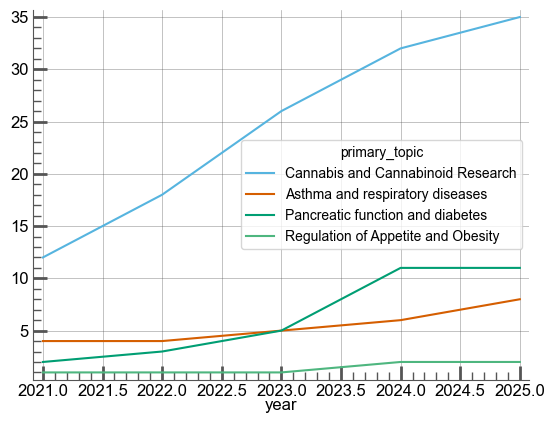

In [187]:
with aquarel.load_theme("scientific"):
    topics_pivot.plot()
    plt.show()

top topics of the last years

#### Subfields

In [188]:
group_subfields = (works[["primary_subfield", "title"]]).groupby(by = "primary_subfield").count()
group_subfields.sort_values(by = "title", inplace = True, ascending = False)

In [189]:
group_subfields

,title
primary_subfield,
Molecular Biology,289
Physiology,101
Pharmacology,83
Cellular and Molecular Neuroscience,74
Pulmonary and Respiratory Medicine,59
...,...
Insect Science,1
Health Informatics,1
Periodontics,1


<Figure size 640x480 with 0 Axes>

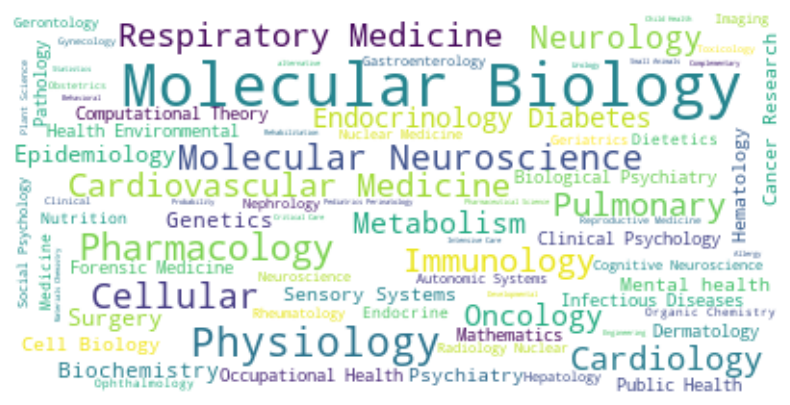

In [190]:
primary_subfields_merged = ' '.join((works[works["primary_subfield"].notna()])["primary_subfield"])

wordcloud = wc.WordCloud(background_color= "white").generate(primary_subfields_merged)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

#### Subfields bar chart race

In [191]:
group_subfields_bis = (works[["primary_subfield", "year", "title"]]).groupby(by = ["primary_subfield", "year"]).count().reset_index()
subfields_pivot = group_subfields_bis.pivot(index = "year", columns = "primary_subfield", values = "title")
subfields_pivot = subfields_pivot.cumsum(skipna = True)
subfields_pivot = subfields_pivot.sort_index()
subfields_pivot = subfields_pivot.fillna(0)
subfields_pivot.index = pd.to_datetime(subfields_pivot.index, format ='%Y')

bcr.bar_chart_race(
    df=subfields_pivot,
    filename='bcr_subfields.mp4', 
    orientation='h',
    sort='desc',
    n_bars=5,
    fixed_order=False,
    fixed_max=True,
    steps_per_period=10,
    period_length=1000,
    period_fmt='%Y',
    title='Evolution of the top subfields along the years',
    bar_size=.95,
    interpolate_period=True
)

c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 127 () missing from font(s) Arial.

c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 128 (\x80) missing from font(s) Arial.

c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 129 (\x81) missing from font(s) Arial.

c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 130 (\x82) missing from font(s) Arial.

c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 131 (\x83) missing from font(s) Arial.

c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 132 (\x84) missing from font(s) Ari

### Topic modelling with BERTopic

#### Data preparation ⚒️

In [359]:
works_topics = pd.read_csv("data/bertopic/data_topic.csv")

C:\Users\gabri\AppData\Local\Temp\ipykernel_30176\3758080146.py:1: DtypeWarning: Columns (93,94,95,96,97,98,99,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,3

In [360]:
works_topics

,Unnamed: 0,title,year,cited_by_count,countries_distinct_count,institutions_distinct_count,citation_normalized_percentile,primary_topic,keywords,concepts,...,institution_119,institution_120,institution_121,institution_122,institution_123,institution_124,institution_125,institution_126,topic,topic_name
0,0,Animal research: Reporting <i>in vivo</i> expe...,2010,3423,1,4,"{'value': 0.99971, 'is_in_top_1_percent': True...","('Animal testing and alternatives',)",[{'id': 'https://openalex.org/keywords/watson'...,"[{'id': 'https://openalex.org/C161191863', 'wi...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,NaN
1,1,Principles of early drug discovery,2010,2407,1,2,"{'value': 0.77439, 'is_in_top_1_percent': Fals...","('Computational Drug Discovery Methods',)",[{'id': 'https://openalex.org/keywords/identif...,"[{'id': 'https://openalex.org/C74187038', 'wik...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,119,NaN
2,2,Measuring reactive species and oxidative damag...,2004,2194,1,1,"{'value': 0.990741, 'is_in_top_1_percent': Tru...","('Antioxidant Activity and Oxidative Stress',)",[],"[{'id': 'https://openalex.org/C207001950', 'wi...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN
3,3,"Guide to Receptors and Channels (GRAC), 5th ed...",2011,2071,1,3,"{'value': 0.999918, 'is_in_top_1_percent': Tru...","('Inflammatory mediators and NSAID effects',)",[],"[{'id': 'https://openalex.org/C170493617', 'wi...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55,NaN
4,4,Characterization of three inhibitors of endoth...,1990,1873,1,1,"{'value': 0.999876, 'is_in_top_1_percent': Tru...","('Nitric Oxide and Endothelin Effects',)",[{'id': 'https://openalex.org/keywords/omega-n...,"[{'id': 'https://openalex.org/C2908937200', 'w...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23532,26258,NaN,1994,0,4,5,NaN,NaN,[],"[{'id': 'https://openalex.org/C41008148', 'wik...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,162,NaN
23533,26266,NaN,1994,0,0,0,NaN,NaN,[],"[{'id': 'https://openalex.org/C41008148', 'wik...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN
23534,26270,NaN,1986,0,2,2,NaN,NaN,[],"[{'id': 'https://openalex.org/C86803240', 'wik...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41,NaN
23535,26274,NaN,1987,0,3,5,NaN,NaN,[],"[{'id': 'https://openalex.org/C86803240', 'wik...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41,NaN


In [361]:
# computing the mncs 
cbc_per_year = (
    works_topics[["year", "cited_by_count"]]
    .groupby(by = "year")
    .mean()
)

for index, row in works_topics.iterrows():
    works_topics.loc[index, "mncs"] = works_topics.loc[index, "cited_by_count"]/cbc_per_year.loc[works_topics.loc[index, "year"], "cited_by_count"]
works_topics

,Unnamed: 0,title,year,cited_by_count,countries_distinct_count,institutions_distinct_count,citation_normalized_percentile,primary_topic,keywords,concepts,...,institution_120,institution_121,institution_122,institution_123,institution_124,institution_125,institution_126,topic,topic_name,mncs
0,0,Animal research: Reporting <i>in vivo</i> expe...,2010,3423,1,4,"{'value': 0.99971, 'is_in_top_1_percent': True...","('Animal testing and alternatives',)",[{'id': 'https://openalex.org/keywords/watson'...,"[{'id': 'https://openalex.org/C161191863', 'wi...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,NaN,46.677273
1,1,Principles of early drug discovery,2010,2407,1,2,"{'value': 0.77439, 'is_in_top_1_percent': Fals...","('Computational Drug Discovery Methods',)",[{'id': 'https://openalex.org/keywords/identif...,"[{'id': 'https://openalex.org/C74187038', 'wik...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,119,NaN,32.822727
2,2,Measuring reactive species and oxidative damag...,2004,2194,1,1,"{'value': 0.990741, 'is_in_top_1_percent': Tru...","('Antioxidant Activity and Oxidative Stress',)",[],"[{'id': 'https://openalex.org/C207001950', 'wi...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,33.815184
3,3,"Guide to Receptors and Channels (GRAC), 5th ed...",2011,2071,1,3,"{'value': 0.999918, 'is_in_top_1_percent': Tru...","('Inflammatory mediators and NSAID effects',)",[],"[{'id': 'https://openalex.org/C170493617', 'wi...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55,NaN,27.699896
4,4,Characterization of three inhibitors of endoth...,1990,1873,1,1,"{'value': 0.999876, 'is_in_top_1_percent': Tru...","('Nitric Oxide and Endothelin Effects',)",[{'id': 'https://openalex.org/keywords/omega-n...,"[{'id': 'https://openalex.org/C2908937200', 'w...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,37.240493
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23532,26258,NaN,1994,0,4,5,NaN,NaN,[],"[{'id': 'https://openalex.org/C41008148', 'wik...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,162,NaN,0.000000
23533,26266,NaN,1994,0,0,0,NaN,NaN,[],"[{'id': 'https://openalex.org/C41008148', 'wik...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,0.000000
23534,26270,NaN,1986,0,2,2,NaN,NaN,[],"[{'id': 'https://openalex.org/C86803240', 'wik...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41,NaN,0.000000
23535,26274,NaN,1987,0,3,5,NaN,NaN,[],"[{'id': 'https://openalex.org/C86803240', 'wik...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41,NaN,0.000000


In [362]:
# number of works (for the next groupby)
works_topics["number_of_works"]  = 1

In [363]:
# group by topics for quadrant

group_topics =  (
    works_topics[["topic", "mncs", "number_of_works"]]
    .groupby(by="topic")
    .sum()
)
group_topics["mncs"] /= group_topics["number_of_works"]

for index, row in group_topics.iterrows():
    for i in range(2012, 2025):
        group_topics.loc[index, f"cited_by_count_{i}"] = works_topics[works_topics["topic"] == index][f"cited_by_count_{i}"].mean()
        group_topics.loc[index, f"number_of_works_{i}"] = works_topics[(works_topics["topic"] == index) & (works_topics["year"] == i)]["number_of_works"].sum()

group_topics = group_topics.reset_index()

In [364]:
group_topics

,topic,mncs,number_of_works,cited_by_count_2012,number_of_works_2012,cited_by_count_2013,number_of_works_2013,cited_by_count_2014,number_of_works_2014,cited_by_count_2015,...,cited_by_count_2020,number_of_works_2020,cited_by_count_2021,number_of_works_2021,cited_by_count_2022,number_of_works_2022,cited_by_count_2023,number_of_works_2023,cited_by_count_2024,number_of_works_2024
0,-1,0.907739,10379,3.500747,173.0,3.538839,138.0,3.635337,207.0,3.520887,...,4.264393,140.0,4.416667,152.0,4.333921,100.0,4.207050,78.0,4.063698,116.0
1,0,1.129644,682,3.252772,7.0,2.894614,8.0,3.049133,2.0,2.945087,...,3.193548,4.0,3.670370,3.0,3.458015,2.0,3.498024,3.0,3.258772,3.0
2,1,1.538373,669,6.807407,26.0,6.255760,30.0,6.405286,22.0,6.379310,...,8.620825,18.0,8.827778,15.0,7.675422,6.0,7.634343,12.0,7.033932,7.0
3,2,1.263147,402,3.577143,2.0,3.579545,4.0,3.320442,2.0,3.478788,...,3.513889,2.0,3.488636,2.0,3.661765,0.0,3.343066,1.0,3.251852,2.0
4,3,1.055442,359,3.443709,5.0,3.236842,4.0,3.013793,3.0,3.101351,...,2.928571,2.0,2.962963,5.0,2.852713,4.0,2.759690,7.0,2.881356,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
254,253,0.768905,10,2.166667,0.0,1.666667,0.0,3.333333,0.0,1.857143,...,3.000000,0.0,3.200000,0.0,2.750000,0.0,2.000000,0.0,1.750000,0.0
255,254,1.248815,10,5.750000,0.0,4.000000,0.0,3.833333,1.0,5.666667,...,3.777778,0.0,4.000000,1.0,3.555556,0.0,4.333333,0.0,4.625000,0.0
256,255,0.855936,10,3.250000,0.0,6.000000,0.0,5.333333,0.0,6.666667,...,3.714286,1.0,6.285714,1.0,7.571429,1.0,6.000000,0.0,5.000000,0.0
257,256,1.038762,10,1.000000,0.0,1.000000,0.0,1.333333,0.0,3.500000,...,1.500000,0.0,1.000000,0.0,2.000000,0.0,1.000000,0.0,1.000000,0.0


In [ ]:
group_topicsyears_sum =  (
    works_topics[["topic", "year", "mncs", "number_of_works"]]
    .groupby(by=["topic", "year"])
    .sum()
)
group_topicsyears_sum.reset_index(inplace=True)
group_topicsyears_sum.sort_values("year", inplace=True)
group_topicsyears_cumsum = (
    group_topicsyears_sum
    .groupby(by="topic")
    .cumsum()
)
group_topicsyears_cumsum.drop(columns="year", inplace=True)
group_topicsyears_cumsum[["topic", "year"]] = group_topicsyears_sum[["topic", "year"]]
group_topicsyears_cumsum.rename(columns={"mncs":"sum_mncs"}, inplace=True)
group_topicsyears_cumsum["sum_mncs"] -= group_topicsyears_sum["mncs"] #substracts the work of the same year
group_topicsyears_cumsum["number_of_works"] -= group_topicsyears_sum["number_of_works"]
group_topicsyears_cumsum["mean_mncs"] = group_topicsyears_cumsum["sum_mncs"]/group_topicsyears_cumsum["number_of_works"]

In [373]:
# extracting the names of topics

topics_to_words = pd.read_csv("data/bertopic/topic_words.csv")

for index, row in group_topics.iterrows():
    word_1 = topics_to_words.loc[0, f"{group_topics.loc[index,"topic"]}"]
    word_2 = topics_to_words.loc[1, f"{group_topics.loc[index,"topic"]}"]
    word_1 = word_1.split(",")[0][2:-1]
    word_2 = word_2.split(",")[0][2:-1]
    group_topics.loc[index, "topic_name"] = f"{word_1}_{word_2}"
group_topics.loc[group_topics["topic"]==-1, "topic_name"] = "unclassified"
group_topics["mncs"] = group_topics["mncs"]/group_topics["number_of_works"]

#### Topics quadrant

<Figure size 640x480 with 0 Axes>

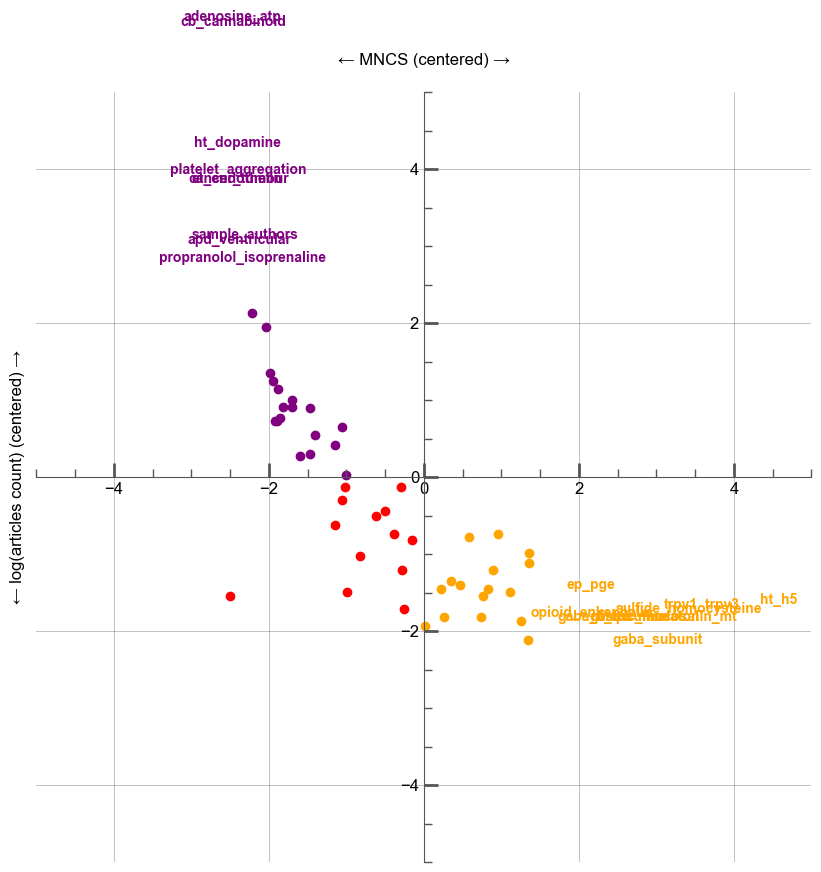

In [374]:
group_topics_viz = group_topics.copy()
group_topics_viz = group_topics[group_topics["topic"]!=-1]
group_topics_viz = group_topics_viz[group_topics_viz["number_of_works"]>=50]
group_topics_viz["mncs_viz"] = (group_topics_viz["mncs"] -  group_topics_viz["mncs"].mean())/group_topics_viz["mncs"].std() *3
group_topics_viz["number_of_works_log"] = np.log(group_topics_viz["number_of_works"]) 
group_topics_viz["number_of_works_viz"] = (group_topics_viz["number_of_works_log"] -  group_topics_viz["number_of_works_log"].mean())/group_topics_viz["number_of_works_log"].std() *2

with aquarel.load_theme("scientific"):
    plt.figure(figsize = (10, 10))
    for index, row in group_topics_viz.iterrows():
        if row["mncs_viz"] >= 0 and row["number_of_works_viz"] >= 0:
            color = "green"
        elif row["mncs_viz"] < 0 and row["number_of_works_viz"] >= 0:
            color = "purple"
        elif row["mncs_viz"] < 0 and row["number_of_works_viz"] < 0:
            color = "red"
        else:
            color = "orange"
        if row["mncs_viz"]>2 or row["number_of_works_viz"]>2.8:
            if row["topic_name"] != "concise_guide":
                plt.text(row["mncs_viz"], row["number_of_works_viz"], row["topic_name"], ha = "center", va = "center", fontsize = 10, fontweight = "bold", color = color)
        else:
            plt.scatter(row["mncs_viz"], row["number_of_works_viz"],  color = color) 
        
    plt.xlim(-5,5)
    plt.ylim(-5,5)
    plt.xlabel("← MNCS (centered) →", labelpad = - 320) # labelpad = décalage du label
    plt.ylabel("← log(articles count) (centered) →", labelpad = 270)
    # # position of the two axes
    ax = plt.gca()
    ax.spines['left'].set_position('zero')   # axe Y à x=0
    ax.spines['bottom'].set_position('zero') # axe X à y=0

    plt.show()

In [375]:
works_topics

,Unnamed: 0,title,year,cited_by_count,countries_distinct_count,institutions_distinct_count,citation_normalized_percentile,primary_topic,keywords,concepts,...,institution_123,institution_124,institution_125,institution_126,topic,topic_name,mncs,number_of_works,topic_mncs,topic_number_works
0,0,Animal research: Reporting <i>in vivo</i> expe...,2010,3423,1,4,"{'value': 0.99971, 'is_in_top_1_percent': True...","('Animal testing and alternatives',)",[{'id': 'https://openalex.org/keywords/watson'...,"[{'id': 'https://openalex.org/C161191863', 'wi...",...,NaN,NaN,NaN,NaN,6,NaN,46.677273,1,0.730421,160.0
1,1,Principles of early drug discovery,2010,2407,1,2,"{'value': 0.77439, 'is_in_top_1_percent': Fals...","('Computational Drug Discovery Methods',)",[{'id': 'https://openalex.org/keywords/identif...,"[{'id': 'https://openalex.org/C74187038', 'wik...",...,NaN,NaN,NaN,NaN,119,NaN,32.822727,1,6.961190,9.0
2,2,Measuring reactive species and oxidative damag...,2004,2194,1,1,"{'value': 0.990741, 'is_in_top_1_percent': Tru...","('Antioxidant Activity and Oxidative Stress',)",[],"[{'id': 'https://openalex.org/C207001950', 'wi...",...,NaN,NaN,NaN,NaN,-1,NaN,33.815184,1,0.910840,7238.0
3,3,"Guide to Receptors and Channels (GRAC), 5th ed...",2011,2071,1,3,"{'value': 0.999918, 'is_in_top_1_percent': Tru...","('Inflammatory mediators and NSAID effects',)",[],"[{'id': 'https://openalex.org/C170493617', 'wi...",...,NaN,NaN,NaN,NaN,55,NaN,27.699896,1,3.388749,12.0
4,4,Characterization of three inhibitors of endoth...,1990,1873,1,1,"{'value': 0.999876, 'is_in_top_1_percent': Tru...","('Nitric Oxide and Endothelin Effects',)",[{'id': 'https://openalex.org/keywords/omega-n...,"[{'id': 'https://openalex.org/C2908937200', 'w...",...,NaN,NaN,NaN,NaN,-1,NaN,37.240493,1,0.895922,3301.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23532,26258,NaN,1994,0,4,5,NaN,NaN,[],"[{'id': 'https://openalex.org/C41008148', 'wik...",...,NaN,NaN,NaN,NaN,162,NaN,0.000000,1,NaN,NaN
23533,26266,NaN,1994,0,0,0,NaN,NaN,[],"[{'id': 'https://openalex.org/C41008148', 'wik...",...,NaN,NaN,NaN,NaN,-1,NaN,0.000000,1,NaN,NaN
23534,26270,NaN,1986,0,2,2,NaN,NaN,[],"[{'id': 'https://openalex.org/C86803240', 'wik...",...,NaN,NaN,NaN,NaN,41,NaN,0.000000,1,NaN,NaN
23535,26274,NaN,1987,0,3,5,NaN,NaN,[],"[{'id': 'https://openalex.org/C86803240', 'wik...",...,NaN,NaN,NaN,NaN,41,NaN,0.000000,1,NaN,NaN


#### Preparation for modelling ⚒️

In [376]:
for index, row in works_topics.iterrows():
    works_topics.loc[index, "topic_mncs"] = 0
    works_topics.loc[index, "topic_number_works"] = 0
    year = row["year"]
    subset = group_topicsyears_cumsum[(group_topicsyears_cumsum["topic"] == row[f"topic"]) & (group_topicsyears_cumsum["year"] == year)]


    while subset.empty == True: # if the topic has no work for this year...
        if year==1967:
            works_topics.loc[index, "topic_mncs"] = None # None if none of the topics have previous works_topics
            works_topics.loc[index, "topic_number_works"] = None
        year -= 1 # then try the year before
        subset = group_topicsyears_cumsum[(group_topicsyears_cumsum["topic"] == row[f"topic"]) & (group_topicsyears_cumsum["year"] == year)]
    if not subset.empty: # if the topic have already published a work since 1967...
        works_topics.loc[index, "topic_mncs"] += subset["mean_mncs"].iloc[0]
        works_topics.loc[index, "topic_number_works"] += subset["number_of_works"].iloc[0]


    if index%100 == 0:
        print(f"Progress: {index/works_topics.shape[0]*100} %")
        clear_output(wait=True)


Progress: 99.84280069677529 %


verification:

In [377]:
works_topics.sort_values("year", inplace=True)
works_topics.reset_index(drop=True, inplace=True)

In [378]:
works_topics[works_topics["topic"]==4]["topic_number_works"].plot()

<Axes: >

In [379]:
group_topics.reset_index(inplace=True)

In [380]:
works_topics = works_topics.merge(group_topics[["topic", "topic_name"]], on="topic", how="left")

#### Citation share Inequalities | Size of the subfield

In [381]:
for i in range(-1,258):
    works_topic = works_topics[works_topics["topic"] == i]
    group_topics.loc[i, "gini"] = gini(works_topic["cited_by_count"].values)


c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\ineqpy\inequality.py:96: RuntimeWarning: invalid value encountered in scalar divide
  return 2 * cov / mu
c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\ineqpy\inequality.py:96: RuntimeWarning: invalid value encountered in scalar divide
  return 2 * cov / mu


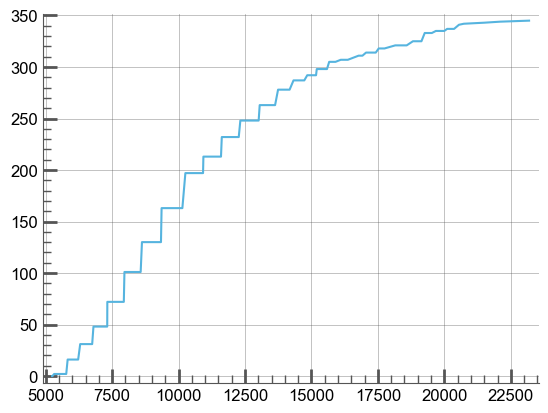

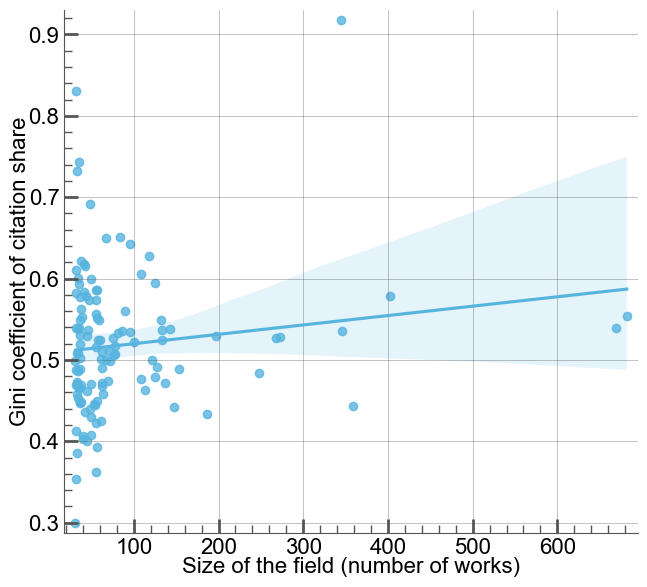

In [382]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize=(7.4, 6.8))
    sns.regplot(data=group_topics[group_topics["number_of_works"]>30][1:], x="number_of_works", y="gini")
    plt.xlabel("Size of the field (number of works)", fontsize=16)
    plt.ylabel("Gini coefficient of citation share", fontsize=16)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()

In [383]:
works_topics.sort_values(by="year", ascending=True)

,Unnamed: 0,title,year,cited_by_count,countries_distinct_count,institutions_distinct_count,citation_normalized_percentile,primary_topic,keywords,concepts,...,institution_124,institution_125,institution_126,topic,topic_name_x,mncs,number_of_works,topic_mncs,topic_number_works,topic_name_y
0,12234,Studies on renal vasomotion,1968,21,1,1,"{'value': 0.91727, 'is_in_top_1_percent': Fals...","('Anesthesia and Sedative Agents',)",[{'id': 'https://openalex.org/keywords/vasomot...,"[{'id': 'https://openalex.org/C2775893369', 'w...",...,NaN,NaN,NaN,-1,NaN,0.452685,1,NaN,0.0,unclassified
17,1222,Isolated 5‐hydroxytryptamine organelles of rab...,1968,134,1,1,"{'value': 0.923133, 'is_in_top_1_percent': Fal...","('Receptor Mechanisms and Signaling',)",[{'id': 'https://openalex.org/keywords/organel...,"[{'id': 'https://openalex.org/C168240541', 'wi...",...,NaN,NaN,NaN,3,NaN,2.888564,1,NaN,0.0,platelet_aggregation
37,21678,The Schultz—Dale reaction of the depolarized g...,1968,4,1,2,"{'value': 0.617891, 'is_in_top_1_percent': Fal...","('Mast cells and histamine',)",[],"[{'id': 'https://openalex.org/C1122143', 'wiki...",...,NaN,NaN,NaN,-1,NaN,0.086226,1,NaN,0.0,unclassified
38,15563,Action of various sympathomimetic amines on th...,1968,15,1,2,"{'value': 0.865672, 'is_in_top_1_percent': Fal...",('Cholinesterase and Neurodegenerative Disease...,[{'id': 'https://openalex.org/keywords/vas-def...,"[{'id': 'https://openalex.org/C2778210472', 'w...",...,NaN,NaN,NaN,-1,NaN,0.323347,1,NaN,0.0,unclassified
36,21679,Maturation of somatomotor responses to strychn...,1968,4,1,1,"{'value': 0.374747, 'is_in_top_1_percent': Fal...","('Neuroscience and Neuropharmacology Research',)",[],"[{'id': 'https://openalex.org/C2777725853', 'w...",...,NaN,NaN,NaN,-1,NaN,0.086226,1,NaN,0.0,unclassified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23529,8578,Intestinal permeability and immune‐inflammator...,2025,0,1,3,NaN,"('Liver Disease Diagnosis and Treatment',)",[{'id': 'https://openalex.org/keywords/steatos...,"[{'id': 'https://openalex.org/C2776637226', 'w...",...,NaN,NaN,NaN,-1,NaN,0.000000,1,0.910986,10321.0,unclassified
23528,8577,Structure–activity relationship of the alloste...,2025,0,2,5,NaN,"('Adenosine and Purinergic Signaling',)",[{'id': 'https://openalex.org/keywords/avermec...,"[{'id': 'https://openalex.org/C166342909', 'wi...",...,NaN,NaN,NaN,0,NaN,0.000000,1,1.132967,680.0,adenosine_atp
23505,8434,Baclofen modulates the immune response after s...,2025,0,2,2,"{'value': 0.0, 'is_in_top_1_percent': False, '...","('Spinal Cord Injury Research',)",[{'id': 'https://openalex.org/keywords/baclofe...,"[{'id': 'https://openalex.org/C2781201050', 'w...",...,NaN,NaN,NaN,-1,NaN,0.000000,1,0.910986,10321.0,unclassified
23535,9972,Defining the polycystin pharmacophore through ...,2025,0,1,1,NaN,"('Microtubule and mitosis dynamics',)",[],"[{'id': 'https://openalex.org/C56173144', 'wik...",...,NaN,NaN,NaN,-1,NaN,0.000000,1,0.910986,10321.0,unclassified


In [384]:
group_topics

,index,topic,mncs,number_of_works,cited_by_count_2012,number_of_works_2012,cited_by_count_2013,number_of_works_2013,cited_by_count_2014,number_of_works_2014,...,cited_by_count_2021,number_of_works_2021,cited_by_count_2022,number_of_works_2022,cited_by_count_2023,number_of_works_2023,cited_by_count_2024,number_of_works_2024,topic_name,gini
0,0.0,-1.0,8.426552e-09,10379.0,3.500747,173.0,3.538839,138.0,3.635337,207.0,...,4.416667,152.0,4.333921,100.0,4.207050,78.0,4.063698,116.0,unclassified,0.485189
1,1.0,0.0,2.428695e-06,682.0,3.252772,7.0,2.894614,8.0,3.049133,2.0,...,3.670370,3.0,3.458015,2.0,3.498024,3.0,3.258772,3.0,adenosine_atp,0.553516
2,2.0,1.0,3.437236e-06,669.0,6.807407,26.0,6.255760,30.0,6.405286,22.0,...,8.827778,15.0,7.675422,6.0,7.634343,12.0,7.033932,7.0,cb_cannabinoid,0.538807
3,3.0,2.0,7.816313e-06,402.0,3.577143,2.0,3.579545,4.0,3.320442,2.0,...,3.488636,2.0,3.661765,0.0,3.343066,1.0,3.251852,2.0,ht_dopamine,0.578207
4,4.0,3.0,8.189277e-06,359.0,3.443709,5.0,3.236842,4.0,3.013793,3.0,...,2.962963,5.0,2.852713,4.0,2.759690,7.0,2.881356,4.0,platelet_aggregation,0.443219
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,255.0,254.0,1.248815e-02,10.0,5.750000,0.0,4.000000,0.0,3.833333,1.0,...,4.000000,1.0,3.555556,0.0,4.333333,0.0,4.625000,0.0,asic3_apetx2,0.399256
256,256.0,255.0,8.559364e-03,10.0,3.250000,0.0,6.000000,0.0,5.333333,0.0,...,6.285714,1.0,7.571429,1.0,6.000000,0.0,5.000000,0.0,hypertrophy_aucubin,0.431499
257,257.0,256.0,1.038762e-02,10.0,1.000000,0.0,1.000000,0.0,1.333333,0.0,...,1.000000,0.0,2.000000,0.0,1.000000,0.0,1.000000,0.0,membrane_26763,0.381579
258,258.0,257.0,3.480204e-03,10.0,1.000000,0.0,2.000000,0.0,2.000000,0.0,...,1.000000,0.0,NaN,0.0,NaN,0.0,NaN,0.0,angiotensin_di,NaN


#### BCR

In [385]:
works_topics_classified = works_topics[works_topics["topic"] != -1]

In [406]:
smoothing = 5
group_topics_bis = (works_topics_classified[["topic_name_y", "year", "title"]]).groupby(by = ["topic_name_y", "year"]).count().reset_index()
topics_pivot = group_topics_bis.pivot(index = "year", columns = "topic_name_y", values = "title")
topics_pivot = topics_pivot.fillna(0)
topics_pivot_smooth = topics_pivot.copy()
for index, row in topics_pivot.iterrows():
    if index<1973:
        debut = 1968
    else:
        debut = index - smoothing
    topics_pivot_smooth.loc[index,:] = sum([topics_pivot.loc[i,:] for i in range(debut, index+1)])
    
topics_pivot_smooth = topics_pivot.sort_index()
topics_pivot_smooth.index = pd.to_datetime(topics_pivot.index, format ='%Y')

In [407]:
group_topics_bis = (works_topics_classified[["topic_name_y", "year", "title"]]).groupby(by = ["topic_name_y", "year"]).count().reset_index()
topics_pivot = group_topics_bis.pivot(index = "year", columns = "topic_name_y", values = "title")
topics_pivot = topics_pivot.cumsum(skipna = True)
topics_pivot = topics_pivot.sort_index()
topics_pivot = topics_pivot.fillna(0)
topics_pivot.index = pd.to_datetime(topics_pivot.index, format ='%Y')

In [273]:
bcr.bar_chart_race(
    df=topics_pivot,
    filename='bcr_new.mp4',  # ou None pour afficher dans un notebook
    orientation='h',
    sort='desc',
    n_bars=5,
    fixed_order=False,
    fixed_max=True,
    steps_per_period=10,
    period_length=2000,
    period_fmt='%Y',
    title='Evolution of the top topics along the years',
    bar_size=.95,
    interpolate_period=True
)

Locator attempting to generate 1325 ticks ([-5.4, ..., 259.40000000000003]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 1325 ticks ([-5.4, ..., 259.40000000000003]), which exceeds Locator.MAXTICKS (1000).
c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 127 () missing from font(s) Arial.

c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 128 (\x80) missing from font(s) Arial.

c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 129 (\x81) missing from font(s) Arial.

c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 130 (\x82) missing from font(s) Arial.

c:\Users\gabri\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart

KeyboardInterrupt: 

#### Topics evolutions quadrant

In [408]:
group_topics = group_topics[group_topics["topic"] != -1]

In [409]:
group_topics_test = group_topics[group_topics["number_of_works_2024"]>=10]
for i in range(2012, 2025):
    
    group_topics_test[f"cited_by_count_{i}_viz"] = (group_topics_test[f"cited_by_count_{i}"] -  group_topics_test[f"cited_by_count_{i}"].mean())
    group_topics_test[f"number_of_works_{i}_log"] = group_topics_test[f"number_of_works_{i}"]
    group_topics_test[f"number_of_works_{i}_viz"] = (group_topics_test[f"number_of_works_{i}_log"] -  group_topics_test[f"number_of_works_{i}_log"].mean())

C:\Users\gabri\AppData\Local\Temp\ipykernel_30176\1904201753.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_topics_test[f"cited_by_count_{i}_viz"] = (group_topics_test[f"cited_by_count_{i}"] -  group_topics_test[f"cited_by_count_{i}"].mean())
C:\Users\gabri\AppData\Local\Temp\ipykernel_30176\1904201753.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_topics_test[f"number_of_works_{i}_log"] = group_topics_test[f"number_of_works_{i}"]
C:\Users\gabri\AppData\Local\Temp\ipykernel_30176\19042

In [410]:
group_topics_test

,index,topic,mncs,number_of_works,cited_by_count_2012,number_of_works_2012,cited_by_count_2013,number_of_works_2013,cited_by_count_2014,number_of_works_2014,...,number_of_works_2021_viz,cited_by_count_2022_viz,number_of_works_2022_log,number_of_works_2022_viz,cited_by_count_2023_viz,number_of_works_2023_log,number_of_works_2023_viz,cited_by_count_2024_viz,number_of_works_2024_log,number_of_works_2024_viz
6,6.0,5.0,0.000009,345.0,5.107692,18.0,5.335570,22.0,4.860606,19.0,...,12.0,0.433707,5.0,1.333333,0.378724,22.0,10.666667,1.063826,12.0,-0.333333
24,24.0,23.0,0.000102,113.0,8.413043,5.0,8.489796,5.0,7.166667,5.0,...,-6.0,-0.191747,5.0,1.333333,0.093533,11.0,-0.333333,0.747029,12.0,-0.333333
129,129.0,128.0,0.000975,30.0,4.000000,0.0,7.000000,1.0,5.000000,2.0,...,-6.0,-0.241960,1.0,-2.666667,-0.472257,1.0,-10.333333,-1.810855,13.0,0.666667


In [412]:
topics_to_words

,Unnamed: 0,-1,0,1,2,3,4,5,6,7,...,248,249,250,251,252,253,254,255,256,257
0,0,"('10', np.float64(0.0033830855899565056))","('adenosine', np.float64(0.030559856880314387))","('cb', np.float64(0.033980979290184656))","('ht', np.float64(0.023381500785321203))","('platelet', np.float64(0.048371992470458126))","('et', np.float64(0.05438166823438373))","('cancer', np.float64(0.031877638163795616))","('sample', np.float64(0.015092742131957897))","('apd', np.float64(0.01677795365837227))",...,"('histamine', np.float64(0.07146218409120268))","('stem', np.float64(0.050684539886866144))","('m6g', np.float64(0.12395007114035946))","('chelerythrine', np.float64(0.036493966857473...","('ethanol', np.float64(0.1836540442583922))","('npy', np.float64(0.1279830685446005))","('asic3', np.float64(0.07145721638123359))","('hypertrophy', np.float64(0.055027012160844026))","('membrane', np.float64(0.05271071267787416))","('angiotensin', np.float64(0.08043731378980985))"
1,1,"('induced', np.float64(0.003303501840958186))","('atp', np.float64(0.02302366816385903))","('cannabinoid', np.float64(0.02795851003432741))","('dopamine', np.float64(0.020452131711424074))","('aggregation', np.float64(0.0409280871219517))","('endothelin', np.float64(0.04562494638922935))","('tumour', np.float64(0.022848293401121367))","('authors', np.float64(0.014607027392787986))","('ventricular', np.float64(0.015790243822277387))",...,"('dtt', np.float64(0.033867014318609674))","('therapy', np.float64(0.03334126958184913))","('ecf', np.float64(0.08313735034989157))","('spike', np.float64(0.03646749219259063))","('pregnanolone', np.float64(0.04715167867856431))","('pyy', np.float64(0.10702765881851656))","('apetx2', np.float64(0.04367438582968993))","('aucubin', np.float64(0.05183469522332248))","('26763', np.float64(0.042294087393479916))","('di', np.float64(0.06513443222931621))"
2,2,"('effect', np.float64(0.0031653879122675735))","('p2y', np.float64(0.0124056587326729))","('anandamide', np.float64(0.02000219082220821))","('dopa', np.float64(0.017098355367093632))","('platelets', np.float64(0.03973657030370469))","('bq', np.float64(0.023915641092593695))","('apoptosis', np.float64(0.015474084144222298))","('research', np.float64(0.012906446980682043))","('myocytes', np.float64(0.015362081928456102))",...,"('h1', np.float64(0.02872531797352728))","('regenerative', np.float64(0.03042075532367055))","('morphine', np.float64(0.06136045599038552))","('membrane', np.float64(0.03228860829813277))","('fat', np.float64(0.04111743518910596))","('y1', np.float64(0.06048783406466798))","('p2x', np.float64(0.04178455815418889))","('limonin', np.float64(0.05183469522332248))","('483', np.float64(0.03384338409835686))","('aii', np.float64(0.05489355792276121))"
3,3,"('effects', np.float64(0.0030979797251727875))","('p2x', np.float64(0.012278205944171287))","('thc', np.float64(0.018917813250429075))","('tryptophan', np.float64(0.013421546094208795))","('adp', np.float64(0.01767849458270544))","('big', np.float64(0.015434665953287015))","('cell', np.float64(0.01353367783291567))","('data', np.float64(0.011281406553239334))","('atrial', np.float64(0.014269156536928321))",...,"('substituents', np.float64(0.0266824917048549...","('al', np.float64(0.029242398544933906))","('brain', np.float64(0.05027187418061602))","('papaverine', np.float64(0.02732467881693491))","('hsl', np.float64(0.039521303862119314))","('36', np.float64(0.058293911759556706))","('asics', np.float64(0.04102579018304859))","('cardiac', np.float64(0.04480576673208836))","('3049', np.float64(0.03286386288154877))","('teprotide', np.float64(0.05295690760060887))"
4,4,"('release', np.float64(0.0029661430425591663))","('utp', np.float64(0.011938682470220178))","('cannabinoids', np.float64(0.0156352618014229...","('brain', np.float64(0.012876965340080992))","('thrombin', np.float64(0.015367275561263032))","('sarafotoxin', np.float64(0.014705710785150754))","('cells', np.float64(0.010402920472288975))","('figure', np.float64(0.010

In [413]:
topics_to_words = pd.read_csv("data/bertopic/topic_words.csv")

for index, row in group_topics_test.iterrows():
    word_1 = topics_to_words.loc[0, f"{int(group_topics_test.loc[index,"topic"])}"]
    word_2 = topics_to_words.loc[1, f"{int(group_topics_test.loc[index,"topic"])}"]
    word_1 = word_1.split(",")[0][2:-1]
    word_2 = word_2.split(",")[0][2:-1]
    group_topics_test.loc[index, "topic_name"] = f"{word_1}_{word_2}"
group_topics_test.loc[group_topics_test["topic"]==-1, "topic_name"] = "unclassified"

<Figure size 640x480 with 0 Axes>

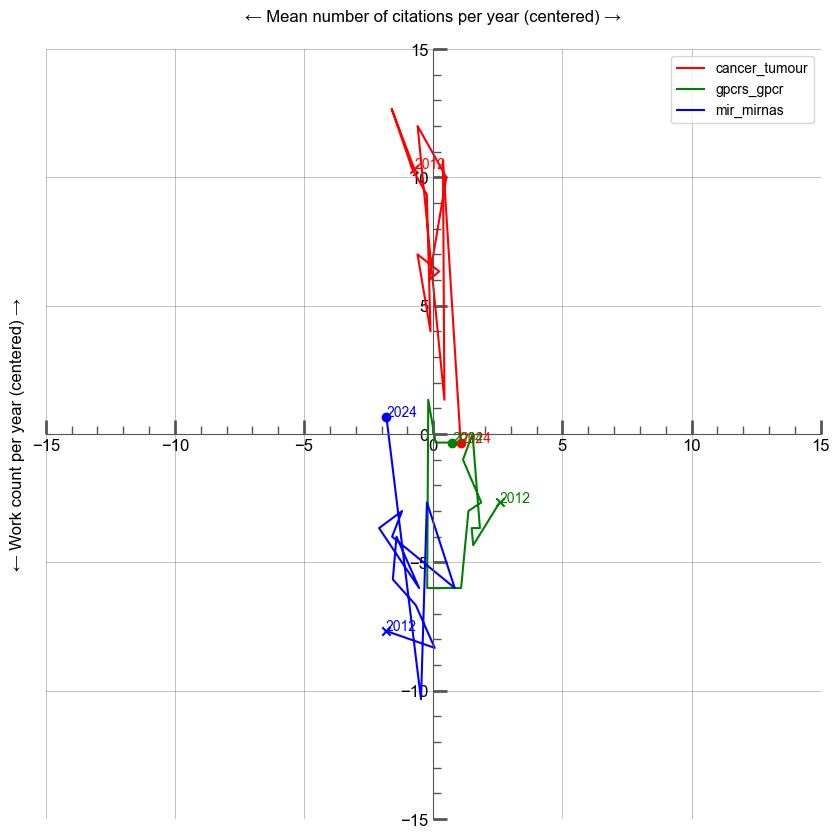

In [415]:
with aquarel.load_theme("scientific"):
    plt.figure(figsize = (10, 10))
    for index, row in group_topics_test.iterrows():
        # if row["cited_by_count_2024_viz"]>2 or row["number_of_works_2024_viz"]>2.8:
        #     if row["topic_name"] != "concise_guide":
        #         plt.text(row["cited_by_count_2024_viz"], row["number_of_works_2024_viz"], row["topic_name"], ha = "center", va = "center", fontsize = 10, fontweight = "bold", color = color)
        # else:
        if index == 6:
            color="red"
        if index == 24:
            color="green"
        if index == 129:
            color = "blue"
        x = [row[f"cited_by_count_{i}_viz"] for i in range(2012, 2025)]
        y = [row[f"number_of_works_{i}_viz"] for i in range(2012, 2025)]
        plt.plot(x, y, color=color, label=row["topic_name"])
        plt.scatter(row["cited_by_count_2012_viz"], row["number_of_works_2012_viz"], marker="x", color=color)
        plt.scatter(row["cited_by_count_2024_viz"], row["number_of_works_2024_viz"],  color=color)
        plt.text(row["cited_by_count_2012_viz"], row["number_of_works_2012_viz"], "2012", color=color)
        plt.text(row["cited_by_count_2024_viz"], row["number_of_works_2024_viz"], "2024", color=color)  
        
    plt.xlim(-15,15)
    plt.ylim(-15,15)
    plt.xlabel("← Mean number of citations per year (centered) →", labelpad = - 320) # labelpad = décalage du label
    plt.ylabel("← Work count per year (centered) →", labelpad = 270)
    # # position of the two axes
    ax = plt.gca()
    ax.spines['left'].set_position('zero')   # axe Y à x=0
    ax.spines['bottom'].set_position('zero') # axe X à y=0
    plt.legend()
    plt.show()

## Preparation for modelling ⚒️

In [390]:
works['title'].value_counts()

title
Issue Information                                                                                                        295
Mandarin Translations                                                                                                     92
Erratum                                                                                                                   68
POSTER COMMUNICATIONS                                                                                                     42
Correction                                                                                                                40
                                                                                                                        ... 
Pharmacological activity in polyvinyl chloride (PVC) tubing                                                                1
A device for measuring the threshold of pain in man                                                                    

In [391]:
works_topics['title'].value_counts()

title
Issue Information                                                                                                                                        148
Erratum                                                                                                                                                   16
Correction                                                                                                                                                13
PROCEEDINGS OF THE BRITISH PHARMACOLOGICAL SOCIETY                                                                                                         6
CORRECTION                                                                                                                                                 5
                                                                                                                                                        ... 
The reversal of the central effects of noradrenaline

Deleting the uninteresting works

In [392]:
works = works[works["title"].notna()]
works_topics = works_topics[works_topics["title"].notna()]
works = works[works['title'].duplicated(keep=False) == False]
works_topics = works_topics[works_topics['title'].duplicated(keep=False) == False]

Merging works and works_topics

In [396]:
works_modelling = works.merge(works_topics[["title", "author_1", "topic", "topic_mncs", "topic_number_works", "topic_name_y"]],
            on=["title","author_1"],
            how="left")

In [397]:
works_modelling.to_csv("data/works/works_modelling.csv", index=False)

In [394]:
works_topics

,Unnamed: 0,title,year,cited_by_count,countries_distinct_count,institutions_distinct_count,citation_normalized_percentile,primary_topic,keywords,concepts,...,institution_124,institution_125,institution_126,topic,topic_name_x,mncs,number_of_works,topic_mncs,topic_number_works,topic_name_y
0,12234,Studies on renal vasomotion,1968,21,1,1,"{'value': 0.91727, 'is_in_top_1_percent': Fals...","('Anesthesia and Sedative Agents',)",[{'id': 'https://openalex.org/keywords/vasomot...,"[{'id': 'https://openalex.org/C2775893369', 'w...",...,NaN,NaN,NaN,-1,NaN,0.452685,1,NaN,0.0,unclassified
1,12241,The influence of β‐adrenoceptive receptor bloc...,1968,21,2,2,"{'value': 0.878128, 'is_in_top_1_percent': Fal...","('Nitric Oxide and Endothelin Effects',)",[{'id': 'https://openalex.org/keywords/intramu...,"[{'id': 'https://openalex.org/C134018914', 'wi...",...,NaN,NaN,NaN,-1,NaN,0.452685,1,NaN,0.0,unclassified
2,11047,The effect of antidepressants and “tranquilliz...,1968,24,1,0,"{'value': 0.868526, 'is_in_top_1_percent': Fal...","('Forensic Toxicology and Drug Analysis',)",[{'id': 'https://openalex.org/keywords/desipra...,"[{'id': 'https://openalex.org/C2780250439', 'w...",...,NaN,NaN,NaN,252,NaN,0.517355,1,NaN,0.0,ethanol_pregnanolone
3,6772,Pharmacological modifications of sympathetic r...,1968,38,2,0,"{'value': 0.852071, 'is_in_top_1_percent': Fal...","('Stress Responses and Cortisol',)",[{'id': 'https://openalex.org/keywords/phentol...,"[{'id': 'https://openalex.org/C24998067', 'wik...",...,NaN,NaN,NaN,-1,NaN,0.819145,1,NaN,0.0,unclassified
4,6736,"Interaction between desipramine, tyramine, and...",1968,40,1,2,"{'value': 0.729259, 'is_in_top_1_percent': Fal...","('Neuropeptides and Animal Physiology',)",[{'id': 'https://openalex.org/keywords/desipra...,"[{'id': 'https://openalex.org/C2780250439', 'w...",...,NaN,NaN,NaN,-1,NaN,0.862258,1,NaN,0.0,unclassified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23532,8560,A potential therapeutic target at Connexin 43 ...,2025,0,1,5,NaN,"('Connexins and lens biology',)",[],"[{'id': 'https://openalex.org/C2780228694', 'w...",...,NaN,NaN,NaN,-1,NaN,0.000000,1,0.910986,10321.0,unclassified
23533,9970,Vitamin D deficiency induces erectile dysfunct...,2025,0,1,14,"{'value': 0.0, 'is_in_top_1_percent': False, '...","('Sexual function and dysfunction studies',)",[],"[{'id': 'https://openalex.org/C2779929075', 'w...",...,NaN,NaN,NaN,98,NaN,0.000000,1,0.949229,34.0,cavernosum_erectile
23534,9971,Opioid receptors in cardiovascular function,2025,0,1,1,"{'value': 0.0, 'is_in_top_1_percent': False, '...","('Neuropeptides and Animal Physiology',)",[{'id': 'https://openalex.org/keywords/cardiac...,"[{'id': 'https://openalex.org/C170493617', 'wi...",...,NaN,NaN,NaN,152,NaN,0.000000,1,0.820713,21.0,naloxone_opioid
23535,9972,Defining the polycystin pharmacophore through ...,2025,0,1,1,NaN,"('Microtubule and mitosis dynamics',)",[],"[{'id': 'https://openalex.org/C56173144', 'wik...",...,NaN,NaN,NaN,-1,NaN,0.000000,1,0.910986,10321.0,unclassified


### Consistency check

In [399]:
works_modelling["institutions_mean_number_works"].mean()

np.float64(123.2761166104259)

In [400]:
works_modelling["institutions_mean_mncs"].mean()

np.float64(1.1407542344699633)

In [401]:
works_modelling["countries_mean_number_works"].mean()

np.float64(4172.437128768096)

In [402]:
works_modelling["countries_mean_mncs"].mean()

np.float64(1.1295559379553612)

In [403]:
works_modelling["sum_past_contributions_authors"].mean()

np.float64(13.013268390997649)

In [404]:
works_modelling["sum_past_citations_authors"].mean()

np.float64(854.825747396708)

In [405]:
works_modelling["authors_count"].mean()

np.float64(4.620297279140074)

In [417]:
works_modelling

,title,year,cited_by_count,countries_distinct_count,institutions_distinct_count,citation_normalized_percentile,primary_topic,keywords,concepts,referenced_works_count,...,countries_mean_number_works,institutions_mean_mncs,institutions_mean_number_works,sum_past_mncs_authors,mean_past_mncs_authors,mean_past_contributions_authors,topic,topic_mncs,topic_number_works,topic_name_y
0,"The Chemo-therapeutie Aetion of Streptomycin, ...",1948,7,0,0,"{'value': 0.776744, 'is_in_top_1_percent': Fal...",Veterinary medicine and infectious diseases,[],"[{'id': 'https://openalex.org/C2775843808', 'w...",0,...,NaN,NaN,NaN,0.000000,NaN,0.000000,NaN,NaN,NaN,NaN
1,"The Constitution of Pbotostilbamldlne, the Irr...",1948,0,0,0,"{'value': 0.0, 'is_in_top_1_percent': False, '...",Lanthanide and Transition Metal Complexes,[],"[{'id': 'https://openalex.org/C2776154427', 'w...",0,...,NaN,NaN,NaN,0.000000,NaN,0.000000,NaN,NaN,NaN,NaN
2,Antryeide A aew trypanocidal drug.,1950,19,0,0,"{'value': 0.937652, 'is_in_top_1_percent': Fal...",Phytochemistry and biological activities of Fi...,[{'id': 'https://openalex.org/keywords/trypano...,"[{'id': 'https://openalex.org/C2776684476', 'w...",0,...,NaN,NaN,NaN,0.000000,NaN,0.000000,NaN,NaN,NaN,NaN
3,Procaine perfused into cerebral ventricles and...,1968,6,1,1,"{'value': 0.770715, 'is_in_top_1_percent': Fal...",Traumatic Brain Injury and Neurovascular Distu...,[{'id': 'https://openalex.org/keywords/subarac...,"[{'id': 'https://openalex.org/C42219234', 'wik...",9,...,0.000000,NaN,0.000000,0.000000,NaN,0.000000,-1.0,NaN,0.0,unclassified
4,The cholinergic properties of some amino‐acid ...,1968,25,1,1,"{'value': 0.72933, 'is_in_top_1_percent': Fals...",Nicotinic Acetylcholine Receptors Study,[],"[{'id': 'https://openalex.org/C188987157', 'wi...",14,...,0.000000,NaN,0.000000,0.000000,NaN,0.000000,-1.0,NaN,0.0,unclassified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23811,"The cytoplasmic sensor, the AIM2 inflammasome:...",2024,3,2,4,"{'value': 0.999982, 'is_in_top_1_percent': Tru...",Inflammasome and immune disorders,"[{'id': 'https://openalex.org/keywords/aim2', ...","[{'id': 'https://openalex.org/C2777209026', 'w...",191,...,6570.125000,NaN,111.500000,9.387139,0.938714,1.250000,-1.0,0.910207,10205.0,unclassified
23812,Innovative pharmacotherapy for hepatic metabol...,2024,3,1,1,"{'value': 0.730161, 'is_in_top_1_percent': Fal...",Liver Disease Diagnosis and Treatment,[{'id': 'https://openalex.org/keywords/liver-c...,"[{'id': 'https://openalex.org/C2778772119', 'w...",134,...,6840.000000,1.089818,276.000000,9.825888,0.755838,2.166667,106.0,1.206527,29.0,nafld_nash
23813,Structural bases for stoichiometry‐selective c...,2024,3,2,9,"{'value': 0.999982, 'is_in_top_1_percent': Tru...",Nicotinic Acetylcholine Receptors Study,[{'id': 'https://openalex.org/keywords/n-type-...,"[{'id': 'https://openalex.org/C519063684', 'wi...",61,...,16514.333333,NaN,198.666667,2.369164,0.473833,1.000000,40.0,0.745657,66.0,nachrs_nachr
23814,Insight into structural properties of viral G ...,2024,2,3,4,"{'value': 0.5, 'is_in_top_1_percent': False, '...",Influenza Virus Research Studies,[{'id': 'https://openalex.org/keywords/viral-i...,"[{'id': 'https://openalex.org/C170493617', 'wi...",213,...,2295.571429,1.516238,190.500000,26.469333,1.393123,2.714286,126.0,0.797359,28.0,chemokine_cxcr3
